In [1]:
from libraries import *
from my_functions import *
dataframe=load_data()
dataframe.head()


[INFO] Loading data


,X,Y,area,perimeter,roi,image,category,Brep,Trep,group,chemistry,path_decon,path_raw,expected,1,2,3,4
0,462.658045,123.805411,200.299,53.891,2,1,OFQv67_w3,OFQv67,w3,36plex-1K eLIT,JEB,../20190204_OFQv67/detect_toto_w3/OFQv67_w3_1_...,merged/OFQv67/w3/1/roi_2.tif,66,10,58,61,54
1,366.437019,411.463645,191.621,52.759,5,1,OFQv67_w3,OFQv67,w3,36plex-1K eLIT,JEB,../20190204_OFQv67/detect_toto_w3/OFQv67_w3_1_...,merged/OFQv67/w3/1/roi_5.tif,66,13,55,60,54
2,196.810109,88.081063,131.091,43.654,2,2,OFQv67_w3,OFQv67,w3,36plex-1K eLIT,JEB,../20190204_OFQv67/detect_toto_w3/OFQv67_w3_2_...,merged/OFQv67/w3/2/roi_2.tif,66,18,59,59,58
3,398.738159,94.008875,175.333,51.952,3,2,OFQv67_w3,OFQv67,w3,36plex-1K eLIT,JEB,../20190204_OFQv67/detect_toto_w3/OFQv67_w3_2_...,merged/OFQv67/w3/2/roi_3.tif,66,16,60,59,56
4,150.306217,164.407736,117.149,40.415,4,2,OFQv67_w3,OFQv67,w3,36plex-1K eLIT,JEB,../20190204_OFQv67/detect_toto_w3/OFQv67_w3_2_...,merged/OFQv67/w3/2/roi_4.tif,66,18,64,61,52


In [2]:
model4 = keras.models.load_model('../Model9_r4_fold1')
rounds_used=4
test_index=np.load("../../test_index.npy")
val_index=np.load("../../fold1.npy")
train_index=np.load("../../train_index.npy")
mask = np.isin(train_index, val_index)
train=train_index[~mask]

In [4]:
images_test = pd.DataFrame(columns=["image_array", "image", "roi", "category", "area", "perimeter", "chemistry", "X", "Y", "file", 'expected', 'observed_r1', 'observed_r2', 'observed_r3', 'observed_r4', "group"])
images_val = pd.DataFrame(columns=["image_array", "image", "roi", "category", "area", "perimeter", "chemistry", "X", "Y", "file", 'expected', 'observed_r1', 'observed_r2', 'observed_r3', 'observed_r4', "group"])
images_test=prepare_test(dataframe, images_test, test_index, 4, rounds_used, 150, False, group="test dataset")
images_val=prepare_test(dataframe, images_val, val_index, 4, rounds_used, 150, False, group="validation dataset")
frames = [images_test, images_val]
result = pd.concat(frames)
threshold=0.4
rounds_used=4
x_test, y_test=prepare_dataset_1(result, rounds_used)
auc, fpr, tpr, thresholds, loss, preds=evaluate_model(x_test, y_test, model4, threshold)
area=result["area"].tolist()
error=[abs(a_i - b_i) for a_i, b_i in zip(np.asarray(y_test), np.asarray(preds)[:,0])]

13/13 [==============================] - 10s 736ms/step - loss: 0.0132
[METRICS] Loss:  0.013170471414923668
[METRICS] ROC AUC=0.934


In [24]:
result["error"]=error
result["preds"]=preds
result["y_test"]=y_test
result_sorted=result.sort_values(["preds"], ascending=True)

In [25]:
result_sorted.head()

,image_array,image,roi,category,area,perimeter,chemistry,X,Y,file,...,observed_r1,observed_r2,observed_r3,observed_r4,group,file_decon,file_raw,error,preds,y_test
127,"[[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",56,2,shyam04_w4,231.738,57.377,JEB,108.305363,99.936687,NaN,...,20,66,24,12,validation dataset,../041019_PGP1_FISSEQ_shyam_decon/detect_w4_w5...,merged/shyam04/w4/11/roi_2.tif,0.111530,0.070289,0.181818
155,"[[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",74,9,shyam04_w5,185.220,52.226,JEB,310.919554,417.271476,NaN,...,19,58,34,7,validation dataset,../041019_PGP1_FISSEQ_shyam_decon/detect_w4_w5...,merged/shyam04/w5/06/roi_9.tif,0.035079,0.070982,0.106061
10,"[[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",10,1,OFQv67_w5,149.086,46.477,SOLiD,429.813242,63.732416,NaN,...,10,39,37,21,validation dataset,../20190204_OFQv67/detect_toto_w5/OFQv67_w5_1_...,merged/OFQv67/w5/1/roi_1.tif,0.241116,0.077066,0.318182
219,"[[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",4,8,OFQv65_w1,201.366,53.163,SOLiD,98.204461,353.966493,NaN,...,10,36,13,9,validation dataset,../20190414_OFQv65/detect/OFQv65_w1_36plxMSBS_...,merged/OFQv65/w1/4/roi_8.tif,0.059190,0.077173,0.136364
121,"[[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",50,6,shyam04_w4,124.404,44.408,JEB,437.079592,373.230944,NaN,...,23,64,32,7,validation dataset,../041019_PGP1_FISSEQ_shyam_decon/detect_w4_w5...,merged/shyam04/w4/05/roi_6.tif,0.002103,0.108164,0.106061



[INFO] Plotting images sorted by prediction...

[Image] number 0 	Prediction: 0.07028859 	Category: shyam04_w4
			Observed: 0.18181818181818182


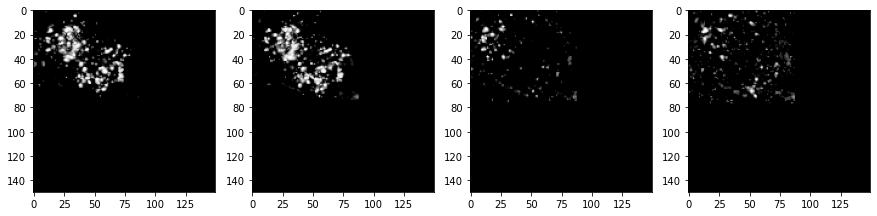


[Image] number 1 	Prediction: 0.0709815 	Category: shyam04_w5
			Observed: 0.10606060606060606


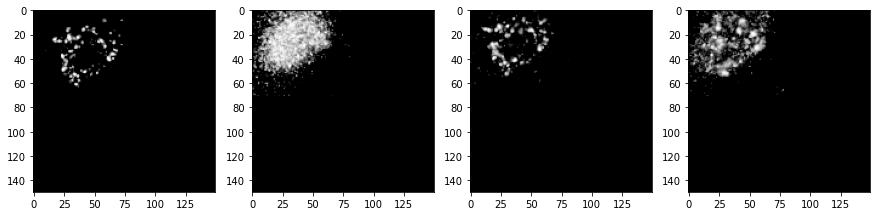


[Image] number 2 	Prediction: 0.077065565 	Category: OFQv67_w5
			Observed: 0.3181818181818182


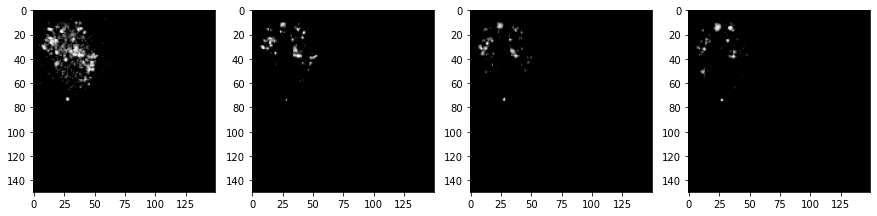


[Image] number 3 	Prediction: 0.077173166 	Category: OFQv65_w1
			Observed: 0.13636363636363635


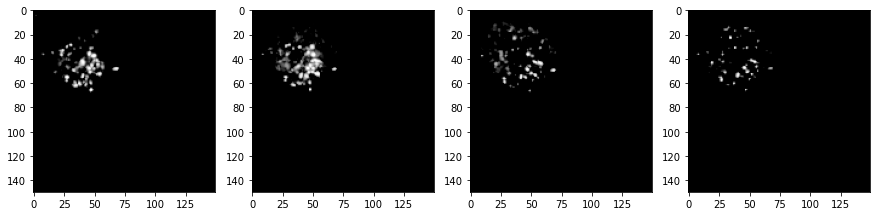


[Image] number 4 	Prediction: 0.108163744 	Category: shyam04_w4
			Observed: 0.10606060606060606


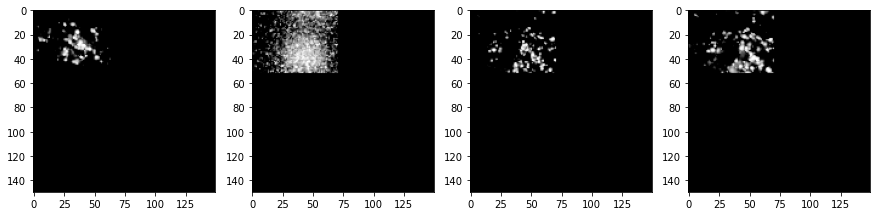


[Image] number 5 	Prediction: 0.11250304 	Category: shyam01_ch1
			Observed: 0.19696969696969696


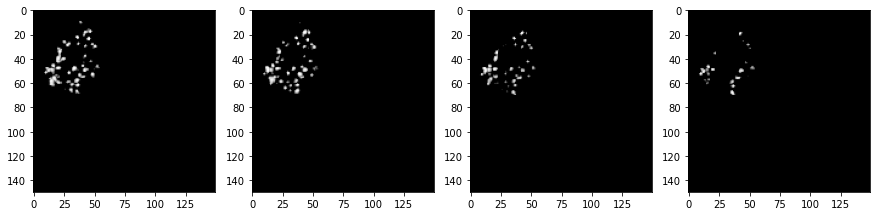


[Image] number 6 	Prediction: 0.15609586 	Category: OFQv65_w1
			Observed: 0.25757575757575757


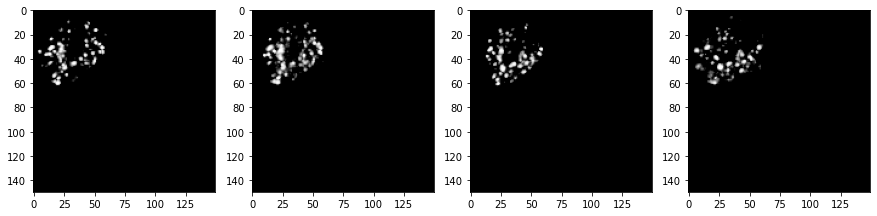


[Image] number 7 	Prediction: 0.16651301 	Category: shyam04_w5
			Observed: 0.10606060606060606


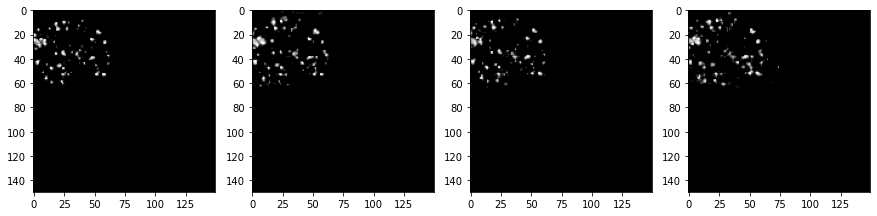


[Image] number 8 	Prediction: 0.17799716 	Category: OFQv67_w5
			Observed: 0.15151515151515152


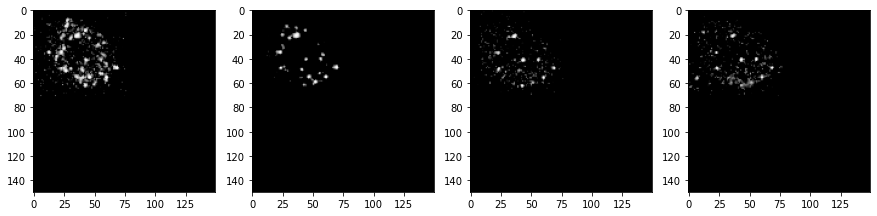


[Image] number 9 	Prediction: 0.18797395 	Category: OFQv65_w1
			Observed: 0.2878787878787879


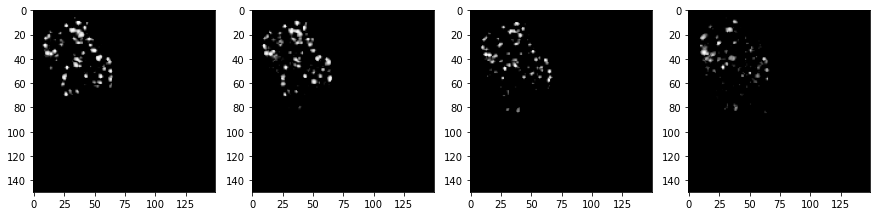


[Image] number 10 	Prediction: 0.21679243 	Category: shyam04_w5
			Observed: 0.30303030303030304


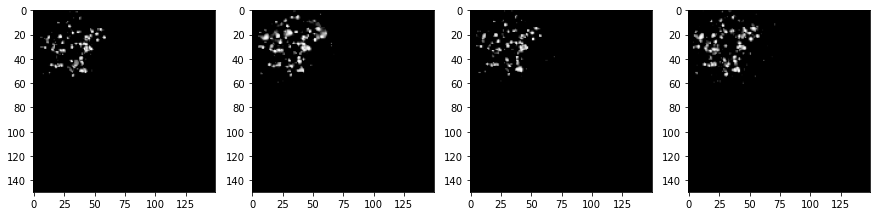


[Image] number 11 	Prediction: 0.23002993 	Category: OFQv67_w5
			Observed: 0.3181818181818182


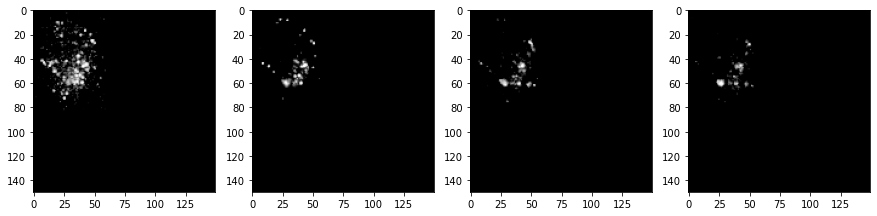


[Image] number 12 	Prediction: 0.2606185 	Category: OFQv65_w1
			Observed: 0.5303030303030303


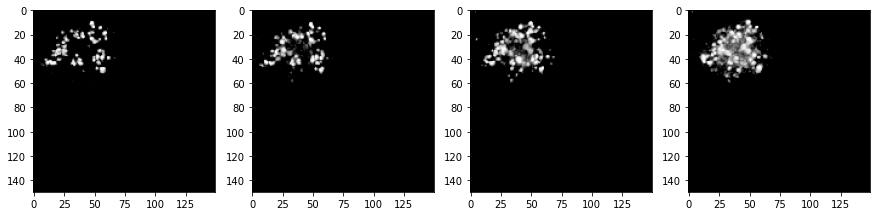


[Image] number 13 	Prediction: 0.2977673 	Category: shyam04_w2
			Observed: 0.36363636363636365


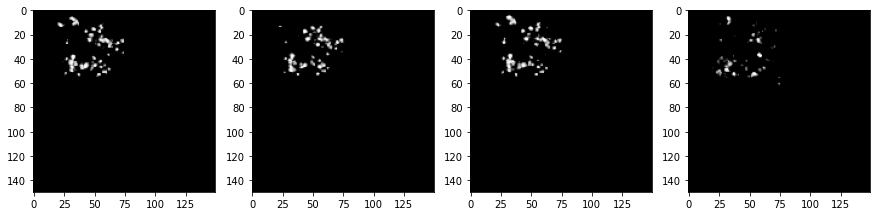


[Image] number 14 	Prediction: 0.3024228 	Category: shyam04_w1
			Observed: 0.25757575757575757


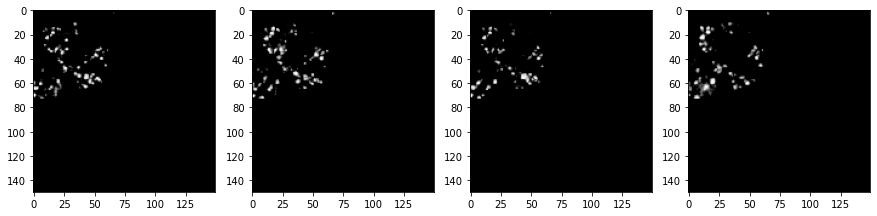


[Image] number 15 	Prediction: 0.31845942 	Category: shyam04_w2
			Observed: 0.09090909090909091


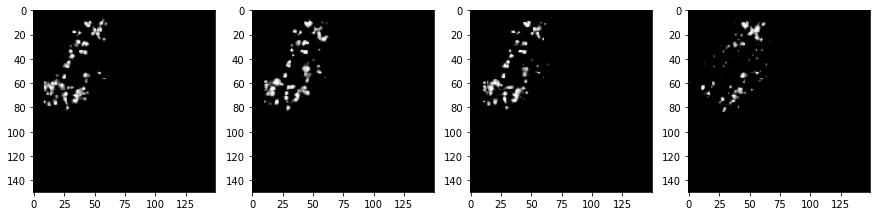


[Image] number 16 	Prediction: 0.32624453 	Category: OFQv69_w2
			Observed: 0.16666666666666666


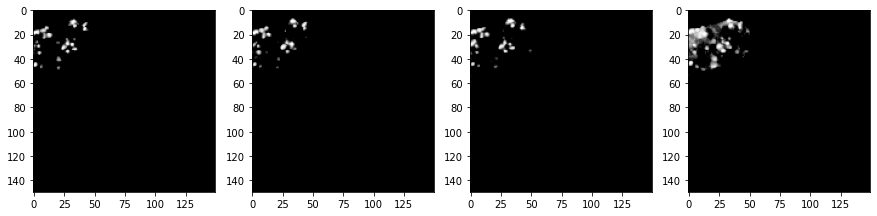


[Image] number 17 	Prediction: 0.32897937 	Category: OFQv67_w5
			Observed: 0.18181818181818182


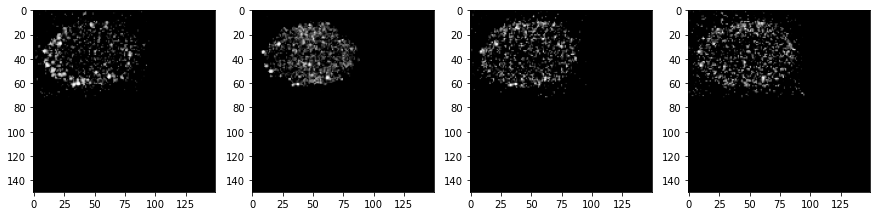


[Image] number 18 	Prediction: 0.33654755 	Category: shyam04_w1
			Observed: 0.3484848484848485


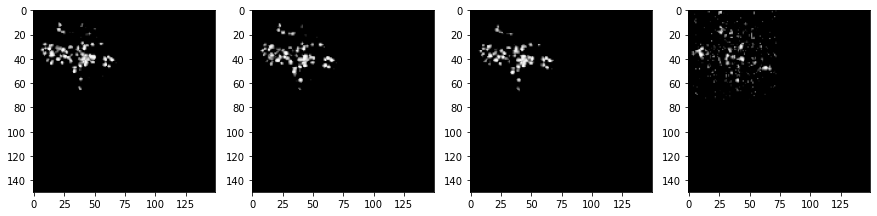


[Image] number 19 	Prediction: 0.33699244 	Category: OFQv67_w5
			Observed: 0.22727272727272727


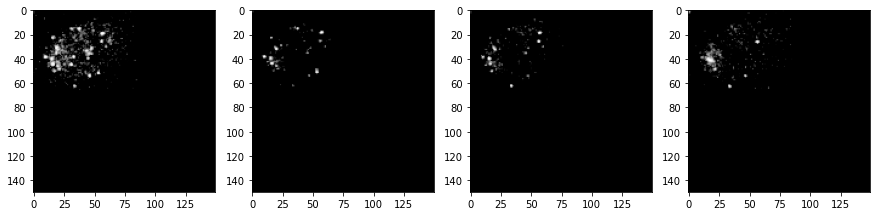


[Image] number 20 	Prediction: 0.34420952 	Category: shyam04_w2
			Observed: 0.15151515151515152


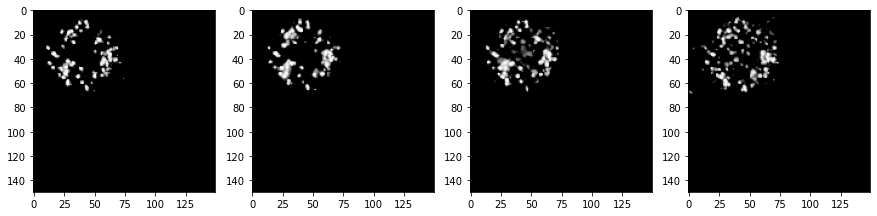


[Image] number 21 	Prediction: 0.34707162 	Category: OFQv65_w4
			Observed: 0.42424242424242425


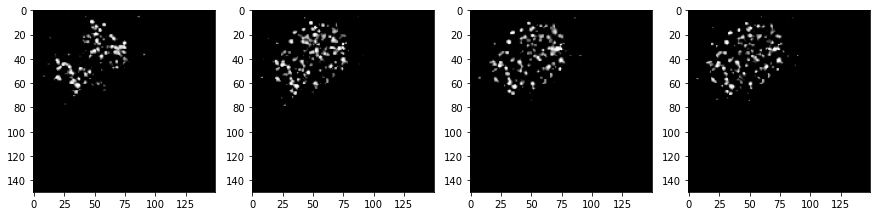


[Image] number 22 	Prediction: 0.37311587 	Category: shyam04_w4
			Observed: 0.4696969696969697


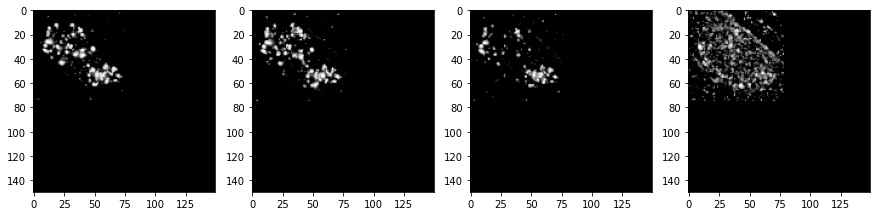


[Image] number 23 	Prediction: 0.37704313 	Category: shyam04_w2
			Observed: 0.13636363636363635


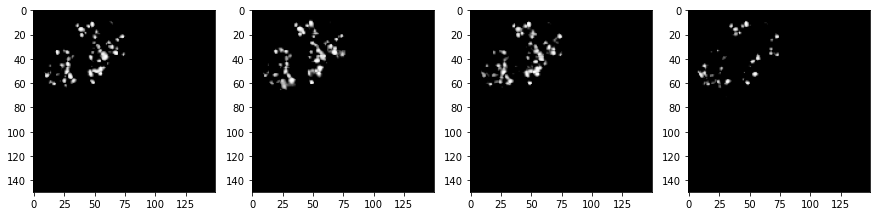


[Image] number 24 	Prediction: 0.3832815 	Category: shyam04_w1
			Observed: 0.6060606060606061


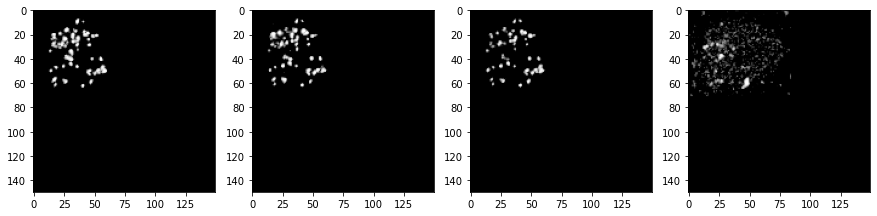


[Image] number 25 	Prediction: 0.38947088 	Category: shyam04_w1
			Observed: 0.3787878787878788


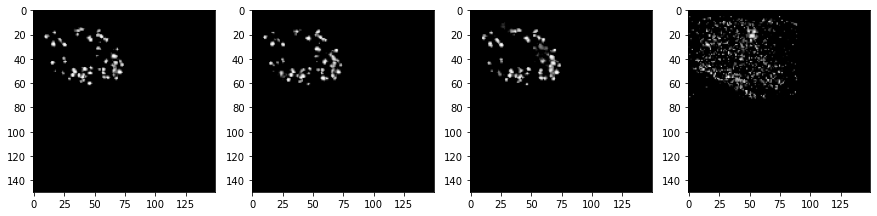


[Image] number 26 	Prediction: 0.39033088 	Category: shyam04_w2
			Observed: 0.36363636363636365


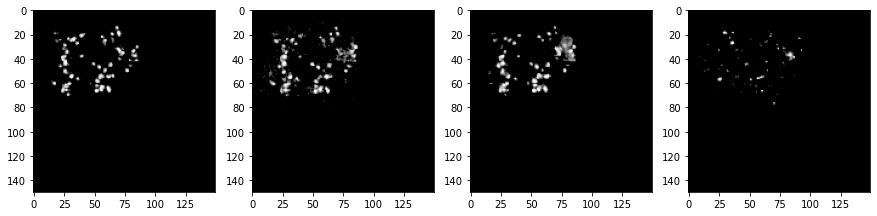


[Image] number 27 	Prediction: 0.39365476 	Category: shyam04_w1
			Observed: 0.3787878787878788


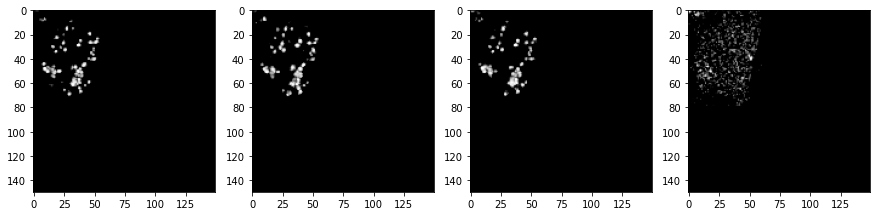


[Image] number 28 	Prediction: 0.39405957 	Category: shyam04_w1
			Observed: 0.4393939393939394


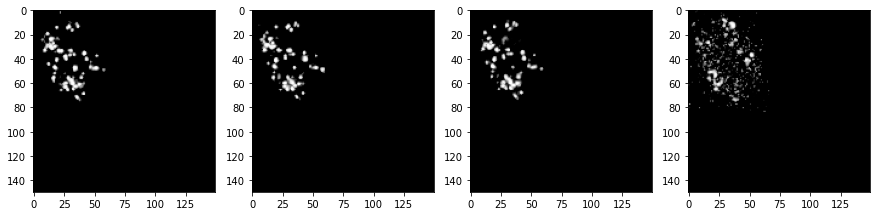


[Image] number 29 	Prediction: 0.4075619 	Category: shyam04_w1
			Observed: 0.2727272727272727


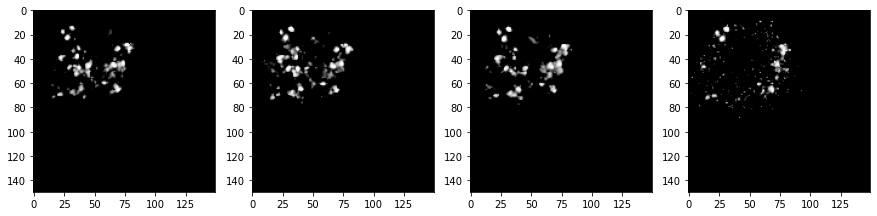


[Image] number 30 	Prediction: 0.41402987 	Category: OFQv65_w1
			Observed: 0.45454545454545453


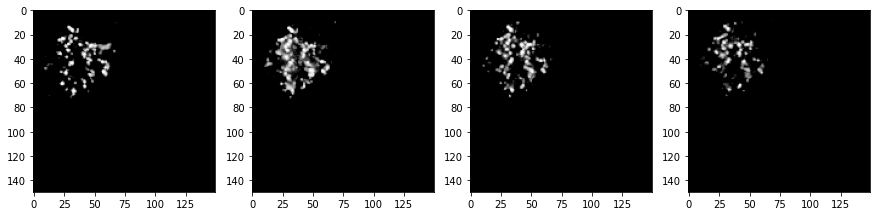


[Image] number 31 	Prediction: 0.42384085 	Category: shyam04_w1
			Observed: 0.48484848484848486


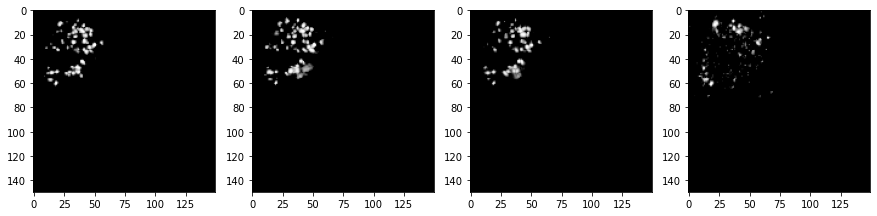


[Image] number 32 	Prediction: 0.4252109 	Category: OFQv65_w1
			Observed: 0.4393939393939394


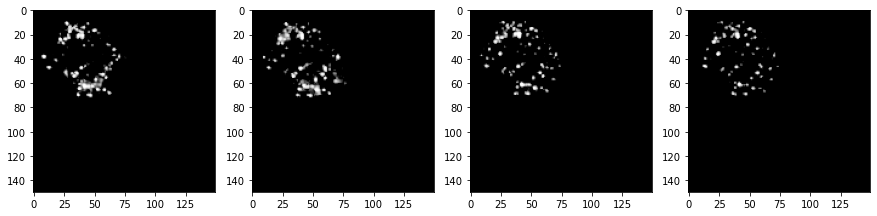


[Image] number 33 	Prediction: 0.43971977 	Category: shyam04_w1
			Observed: 0.18181818181818182


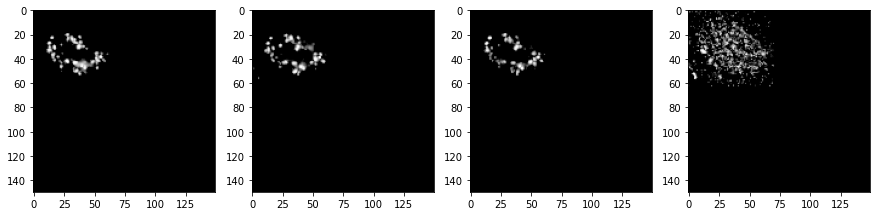


[Image] number 34 	Prediction: 0.44037503 	Category: OFQv69_w3
			Observed: 0.8939393939393939


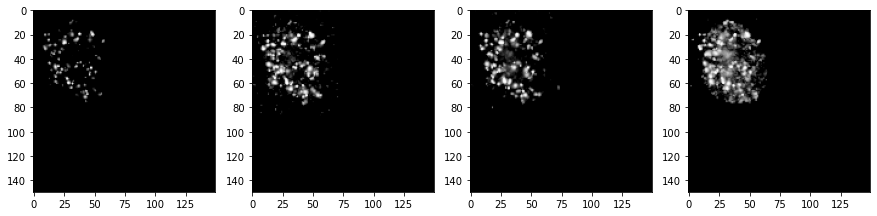


[Image] number 35 	Prediction: 0.4419984 	Category: OFQv69_w3
			Observed: 0.9242424242424242


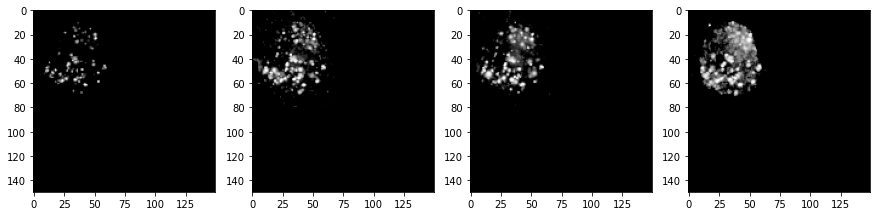


[Image] number 36 	Prediction: 0.44520417 	Category: shyam04_w5
			Observed: 0.3939393939393939


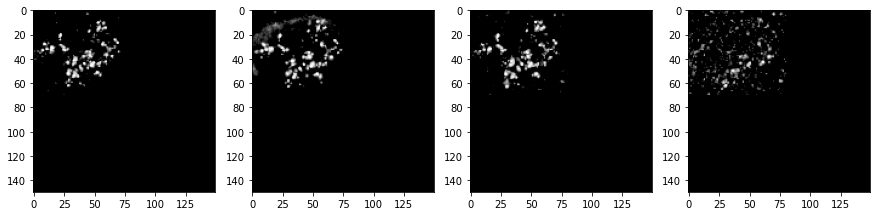


[Image] number 37 	Prediction: 0.44625154 	Category: shyam04_w1
			Observed: 0.24242424242424243


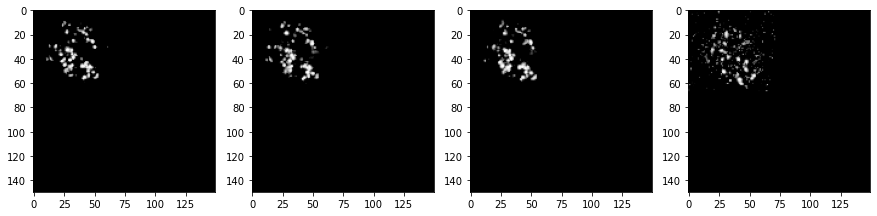


[Image] number 38 	Prediction: 0.44868165 	Category: OFQv69_w2
			Observed: 0.45454545454545453


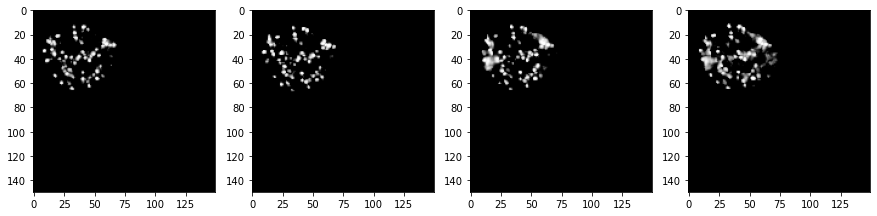


[Image] number 39 	Prediction: 0.449891 	Category: shyam04_w4
			Observed: 0.3939393939393939


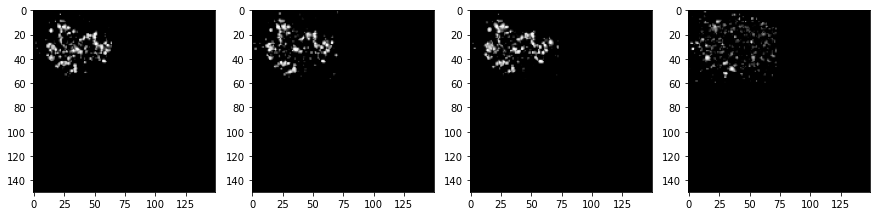


[Image] number 40 	Prediction: 0.4568145 	Category: shyam04_w4
			Observed: 0.5


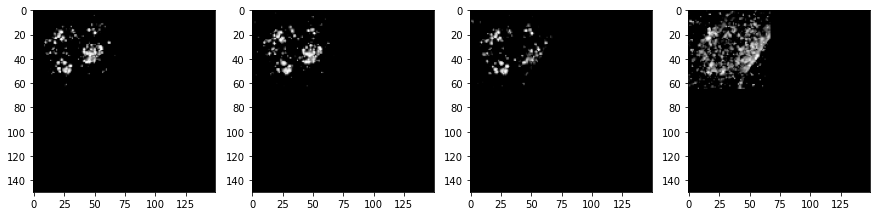


[Image] number 41 	Prediction: 0.46289676 	Category: shyam04_w2
			Observed: 0.3484848484848485


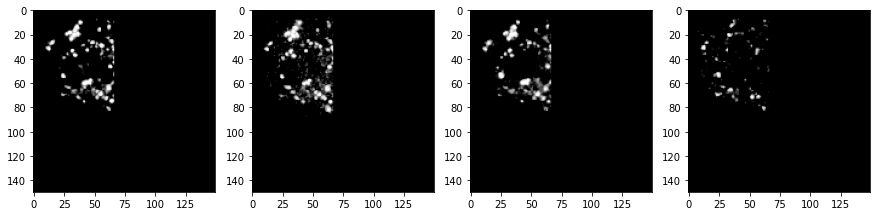


[Image] number 42 	Prediction: 0.4683674 	Category: shyam04_w1
			Observed: 0.6060606060606061


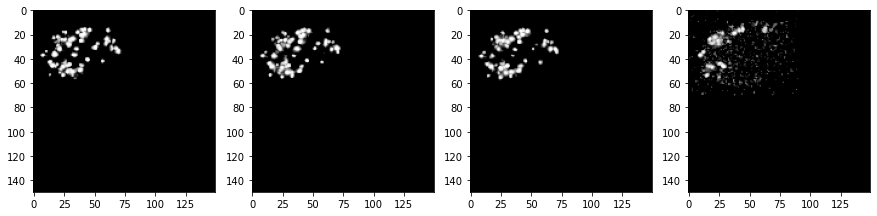


[Image] number 43 	Prediction: 0.4689557 	Category: shyam04_w2
			Observed: 0.3939393939393939


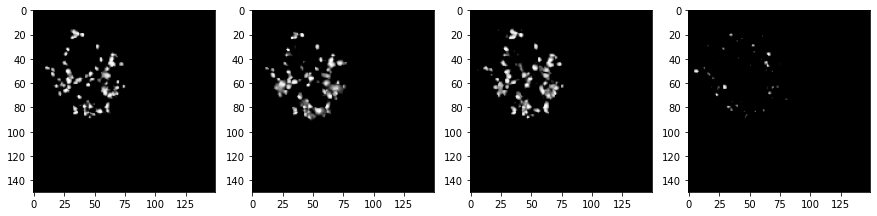


[Image] number 44 	Prediction: 0.47202832 	Category: shyam04_w4
			Observed: 0.2727272727272727


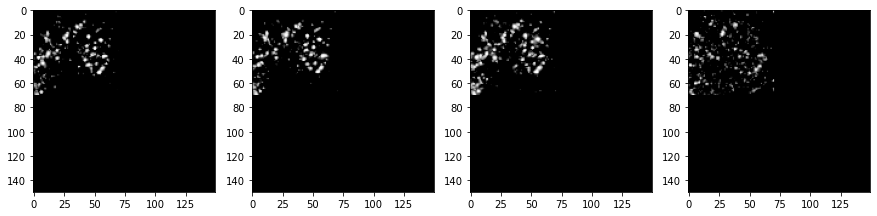


[Image] number 45 	Prediction: 0.473832 	Category: shyam04_w2
			Observed: 0.19696969696969696


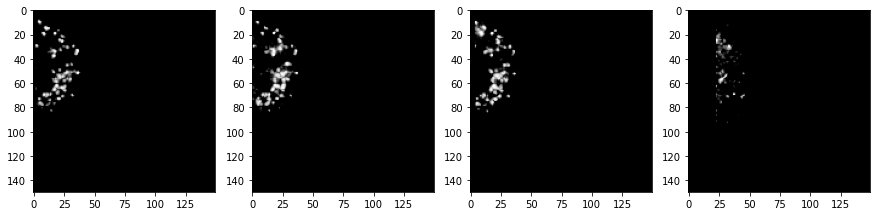


[Image] number 46 	Prediction: 0.47435266 	Category: shyam04_w1
			Observed: 0.5


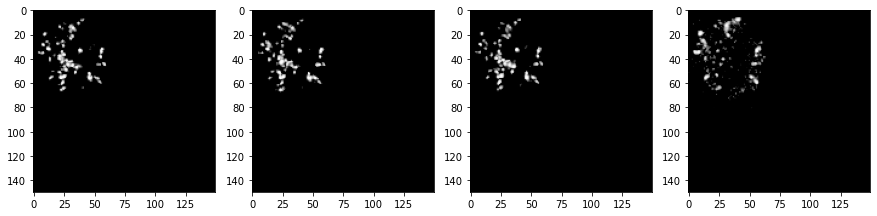


[Image] number 47 	Prediction: 0.47721162 	Category: shyam04_w1
			Observed: 0.42424242424242425


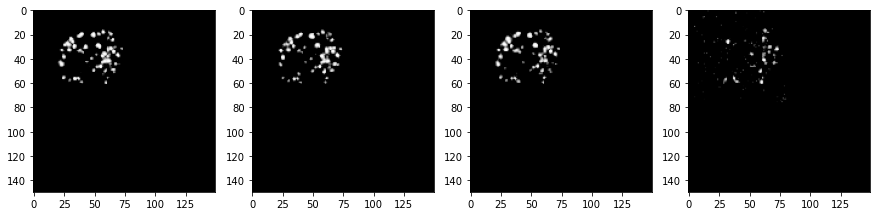


[Image] number 48 	Prediction: 0.47877875 	Category: shyam04_w1
			Observed: 0.4393939393939394


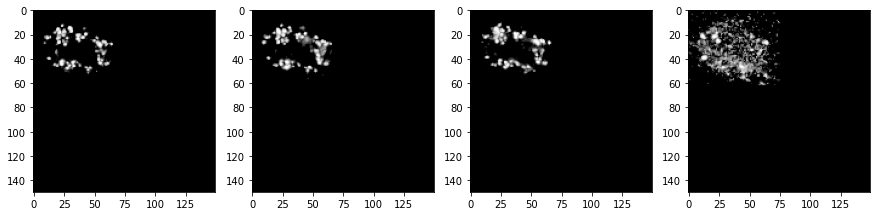


[Image] number 49 	Prediction: 0.47887132 	Category: OFQv65_w4
			Observed: 0.5151515151515151


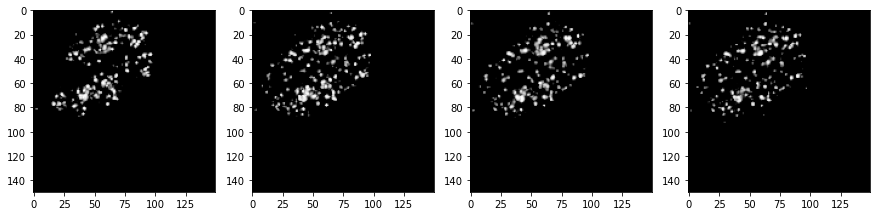


[Image] number 50 	Prediction: 0.4822175 	Category: shyam04_w5
			Observed: 0.5757575757575758


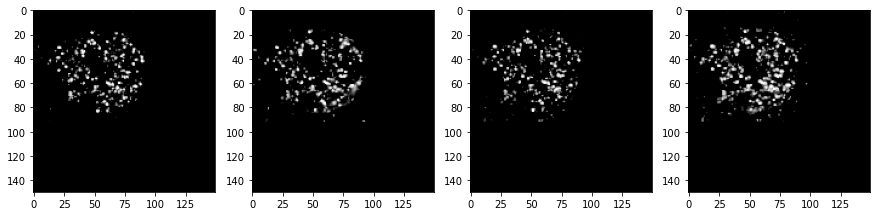


[Image] number 51 	Prediction: 0.4852162 	Category: shyam04_w1
			Observed: 0.5151515151515151


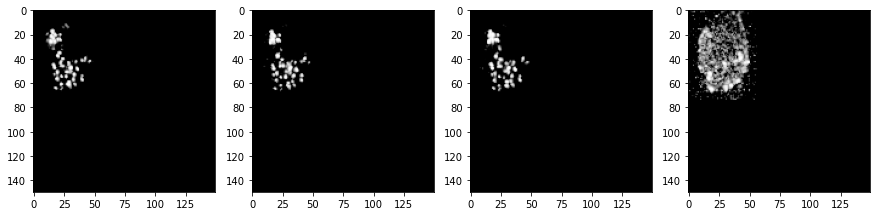


[Image] number 52 	Prediction: 0.49521434 	Category: shyam04_w4
			Observed: 0.3484848484848485


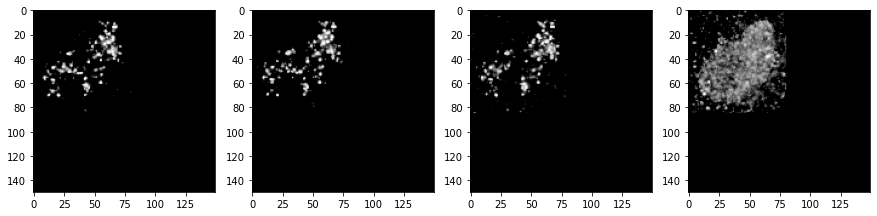


[Image] number 53 	Prediction: 0.50010085 	Category: OFQv69_w3
			Observed: 0.8181818181818182


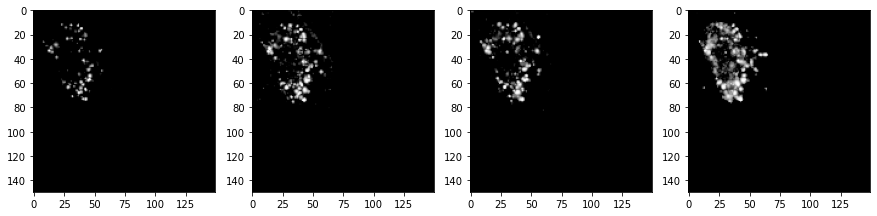


[Image] number 54 	Prediction: 0.5004141 	Category: shyam04_w1
			Observed: 0.5


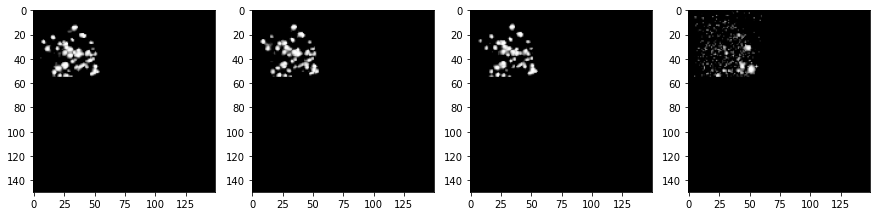


[Image] number 55 	Prediction: 0.50380135 	Category: shyam04_w2
			Observed: 0.48484848484848486


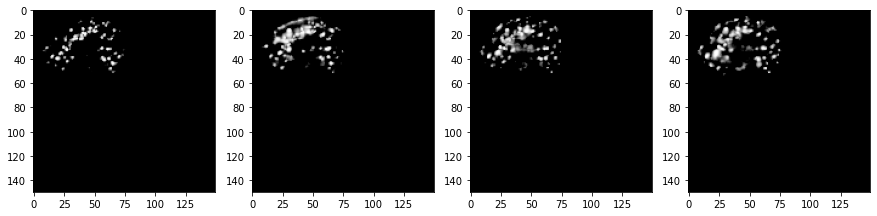


[Image] number 56 	Prediction: 0.50424635 	Category: OFQv61_w4
			Observed: 0.7878787878787878


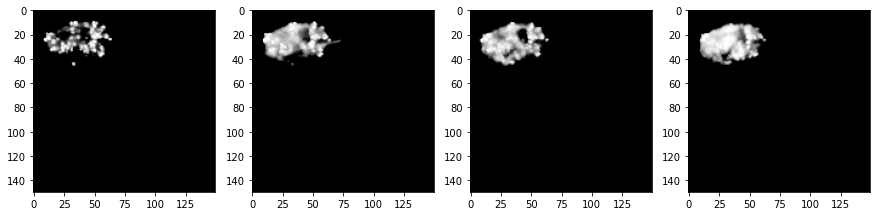


[Image] number 57 	Prediction: 0.50666875 	Category: OFQv65_w1
			Observed: 0.5757575757575758


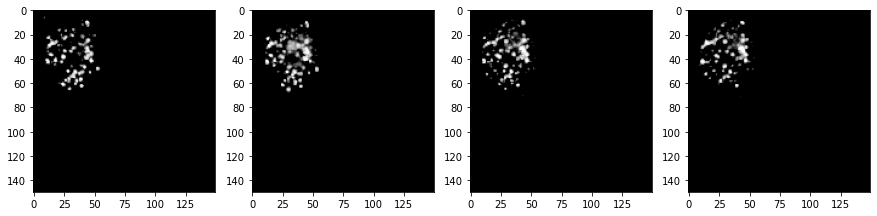


[Image] number 58 	Prediction: 0.5090944 	Category: OFQv61_w3
			Observed: 0.6363636363636364


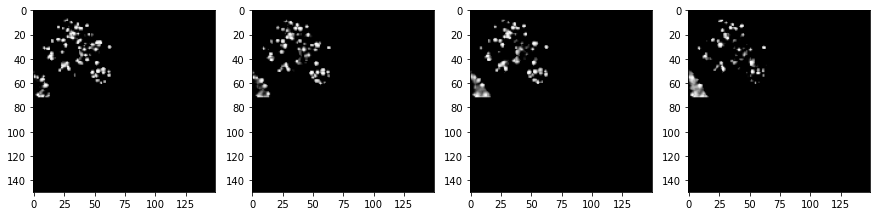


[Image] number 59 	Prediction: 0.5098454 	Category: OFQv65_w4
			Observed: 0.5303030303030303


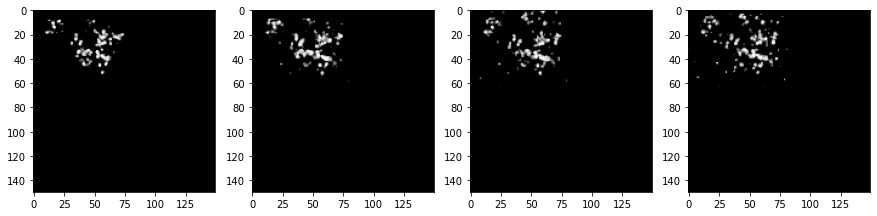


[Image] number 60 	Prediction: 0.5101332 	Category: shyam04_w2
			Observed: 0.6212121212121212


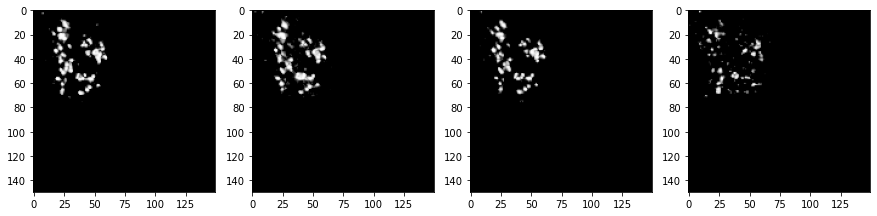


[Image] number 61 	Prediction: 0.5107478 	Category: OFQv69_w1
			Observed: 0.22727272727272727


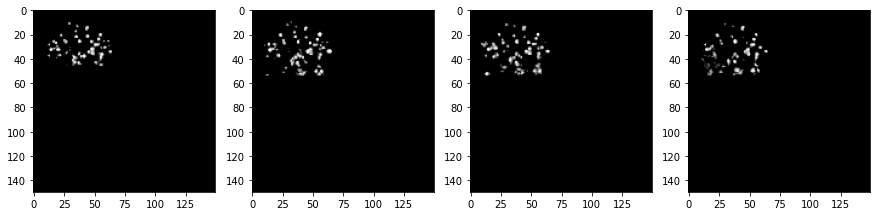


[Image] number 62 	Prediction: 0.51101273 	Category: OFQv65_w1
			Observed: 0.48484848484848486


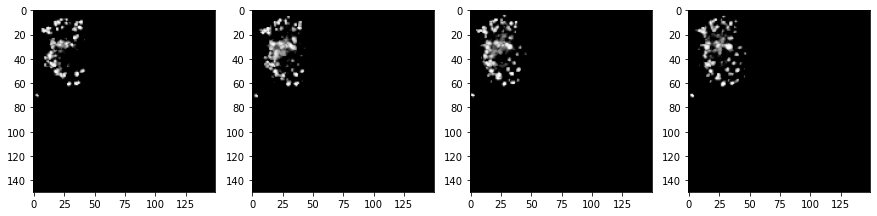


[Image] number 63 	Prediction: 0.51290333 	Category: OFQv65_w4
			Observed: 0.6363636363636364


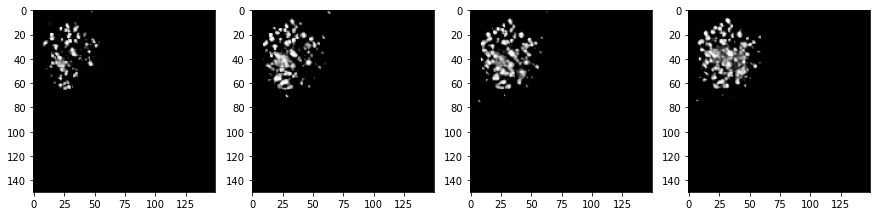


[Image] number 64 	Prediction: 0.5144476 	Category: shyam04_w1
			Observed: 0.5151515151515151


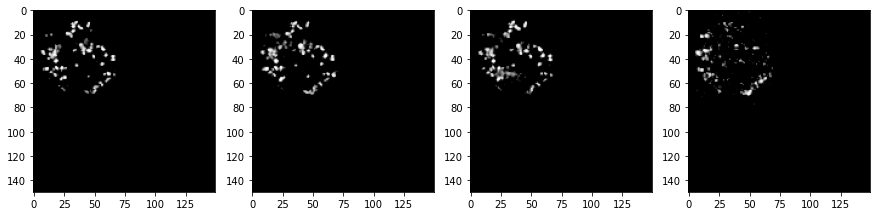


[Image] number 65 	Prediction: 0.5144977 	Category: OFQv61_w3
			Observed: 0.6818181818181818


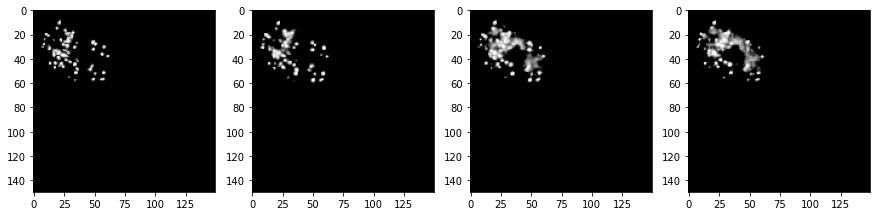


[Image] number 66 	Prediction: 0.51630795 	Category: OFQv69_w3
			Observed: 0.7878787878787878


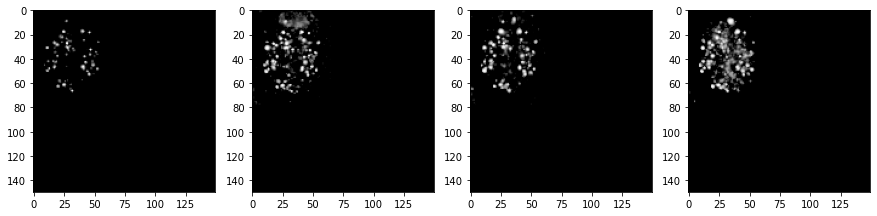


[Image] number 67 	Prediction: 0.52126354 	Category: OFQv69_w1
			Observed: 0.4393939393939394


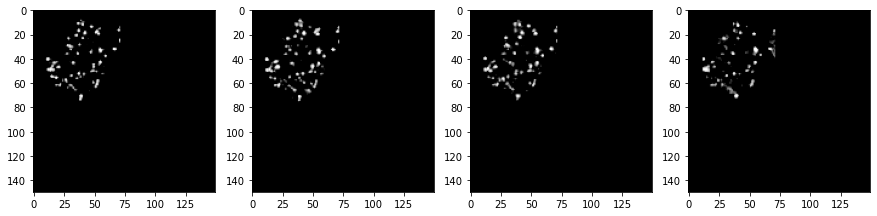


[Image] number 68 	Prediction: 0.5249319 	Category: OFQv65_w4
			Observed: 0.696969696969697


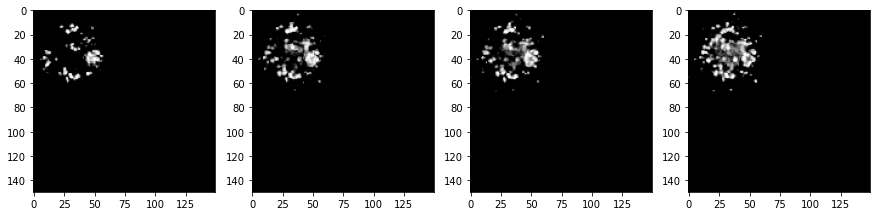


[Image] number 69 	Prediction: 0.5256258 	Category: OFQv61_w3
			Observed: 0.5606060606060606


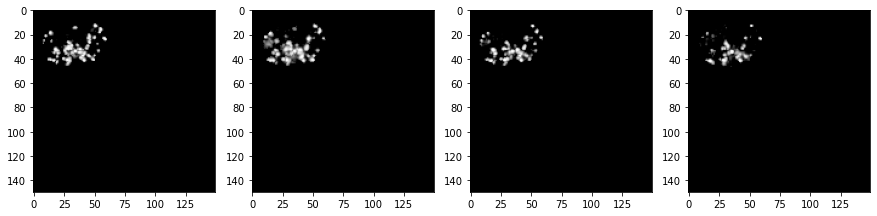


[Image] number 70 	Prediction: 0.526392 	Category: shyam04_w2
			Observed: 0.3939393939393939


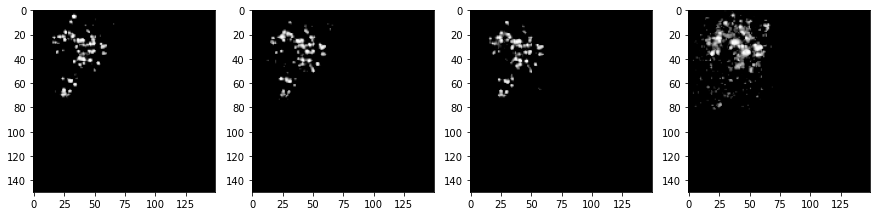


[Image] number 71 	Prediction: 0.5268326 	Category: OFQv61_w4
			Observed: 0.5454545454545454


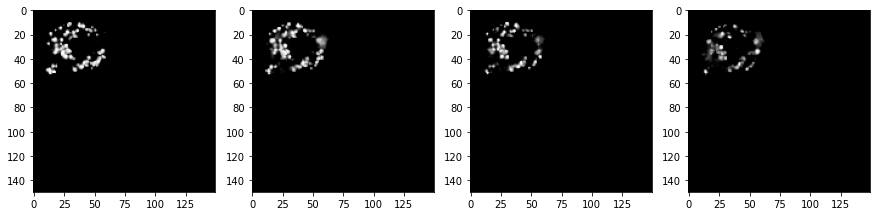


[Image] number 72 	Prediction: 0.52727455 	Category: OFQv65_w1
			Observed: 0.42424242424242425


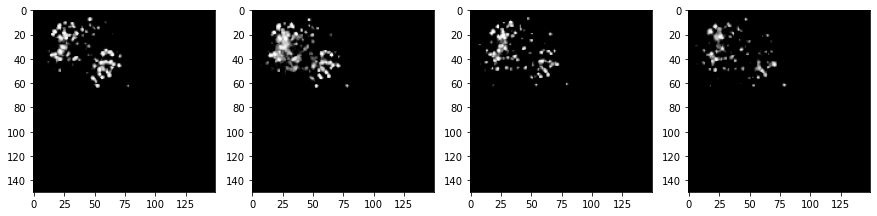


[Image] number 73 	Prediction: 0.5277951 	Category: OFQv69_w4
			Observed: 0.36363636363636365


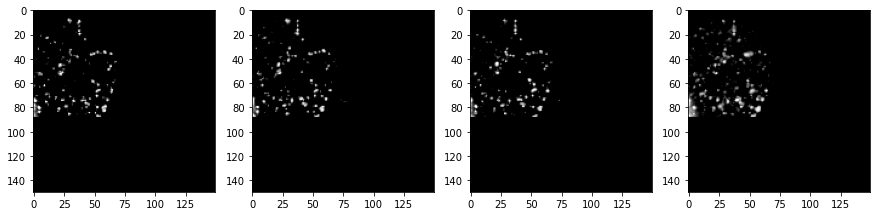


[Image] number 74 	Prediction: 0.53648657 	Category: OFQv61_w3
			Observed: 0.42424242424242425


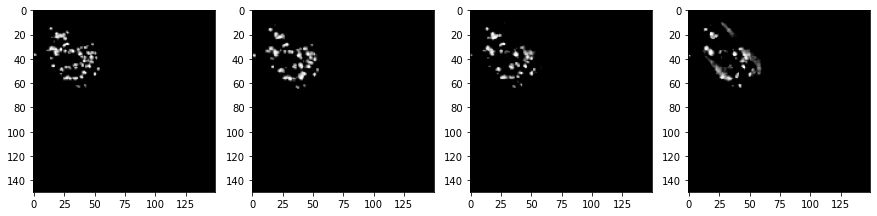


[Image] number 75 	Prediction: 0.53829694 	Category: OFQv69_w4
			Observed: 0.5909090909090909


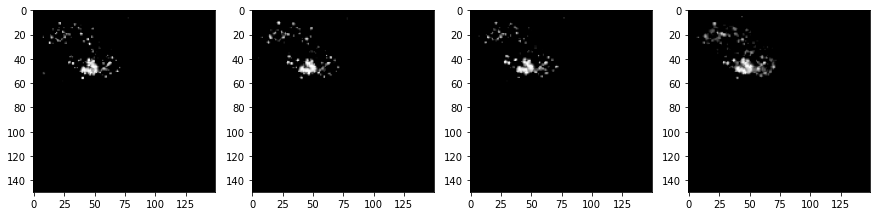


[Image] number 76 	Prediction: 0.53915864 	Category: shyam01_ch3
			Observed: 0.5454545454545454


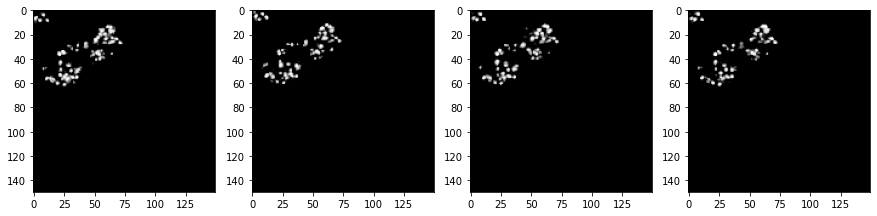


[Image] number 77 	Prediction: 0.54116654 	Category: OFQv68_w4
			Observed: 0.696969696969697


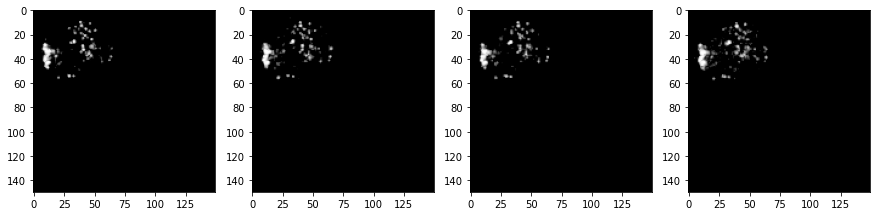


[Image] number 78 	Prediction: 0.5433474 	Category: shyam04_w1
			Observed: 0.6666666666666666


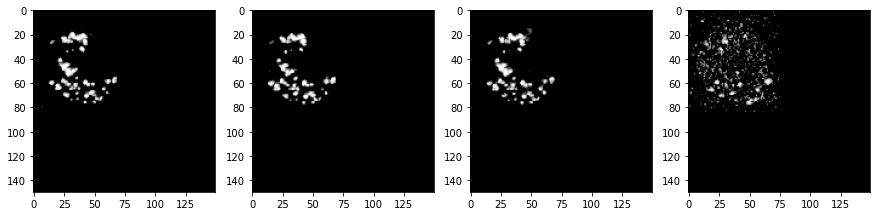


[Image] number 79 	Prediction: 0.5433495 	Category: shyam04_w2
			Observed: 0.5909090909090909


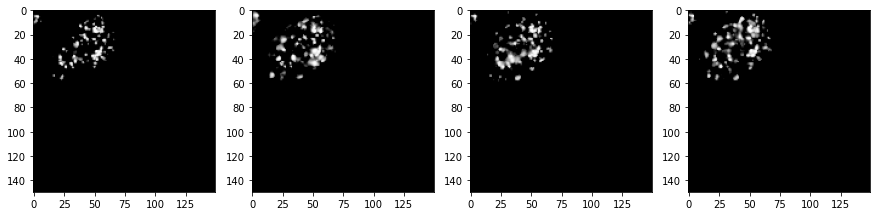


[Image] number 80 	Prediction: 0.5439791 	Category: shyam04_w1
			Observed: 0.3787878787878788


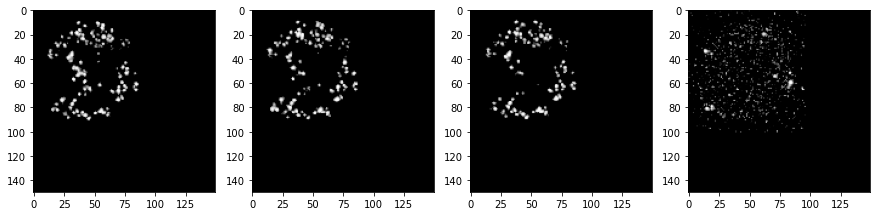


[Image] number 81 	Prediction: 0.5454606 	Category: shyam01_ch5
			Observed: 0.6515151515151515


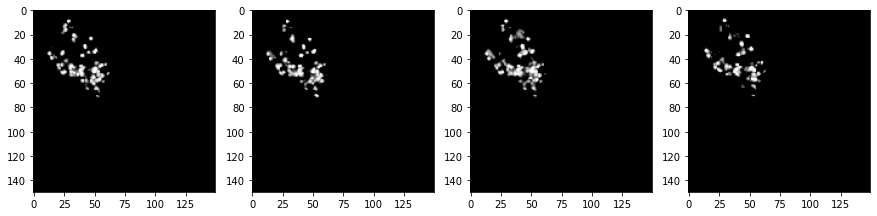


[Image] number 82 	Prediction: 0.54647726 	Category: shyam04_w2
			Observed: 0.5909090909090909


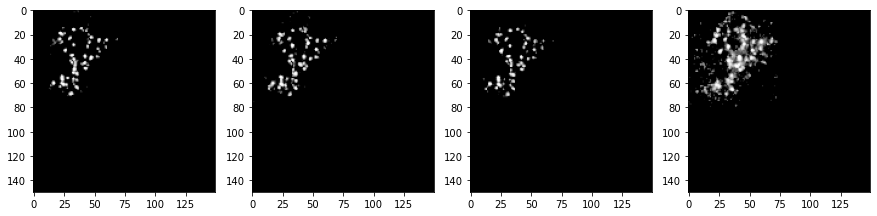


[Image] number 83 	Prediction: 0.54719514 	Category: shyam04_w1
			Observed: 0.7878787878787878


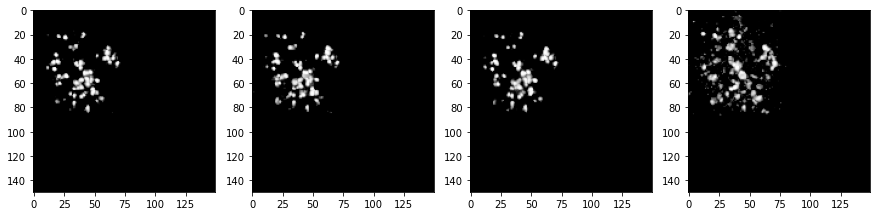


[Image] number 84 	Prediction: 0.5492158 	Category: shyam04_w1
			Observed: 0.45454545454545453


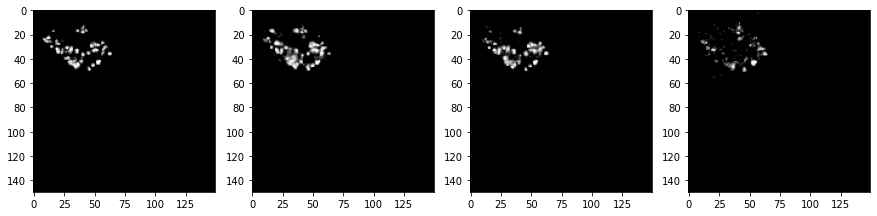


[Image] number 85 	Prediction: 0.5494659 	Category: OFQv65_w1
			Observed: 0.5909090909090909


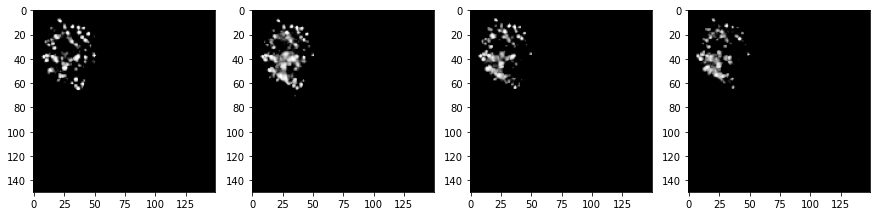


[Image] number 86 	Prediction: 0.55462724 	Category: OFQv69_w3
			Observed: 0.9242424242424242


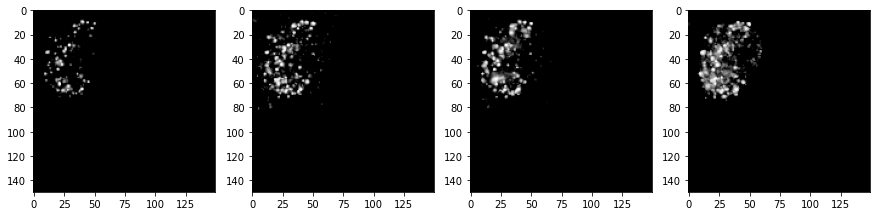


[Image] number 87 	Prediction: 0.5573349 	Category: shyam04_w1
			Observed: 0.5909090909090909


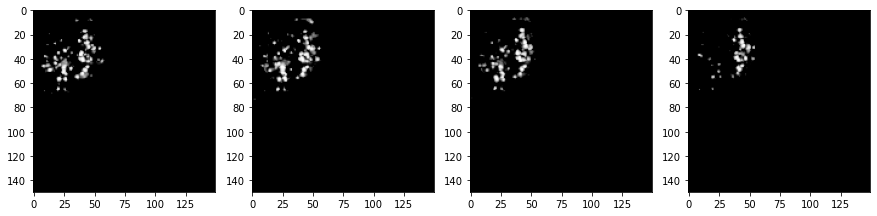


[Image] number 88 	Prediction: 0.5617919 	Category: shyam04_w2
			Observed: 0.6666666666666666


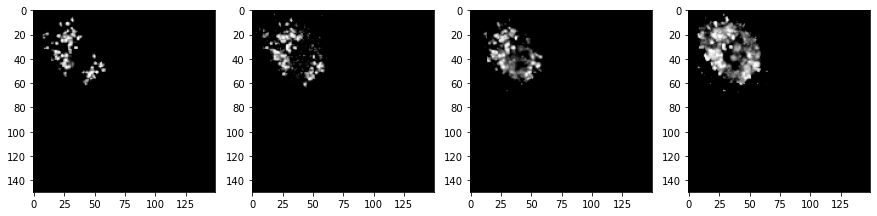


[Image] number 89 	Prediction: 0.56505185 	Category: OFQv69_w2
			Observed: 0.48484848484848486


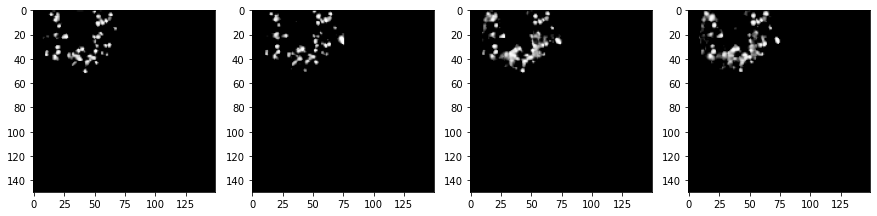


[Image] number 90 	Prediction: 0.5681696 	Category: shyam01_ch1
			Observed: 0.5909090909090909


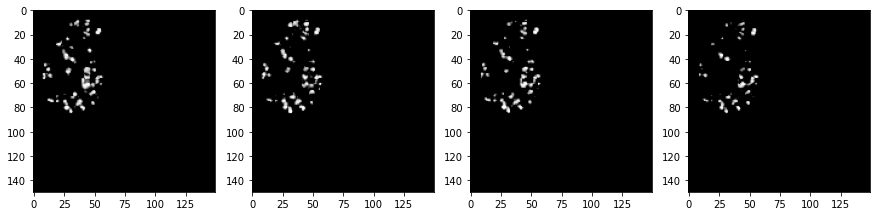


[Image] number 91 	Prediction: 0.5686484 	Category: shyam04_w2
			Observed: 0.6060606060606061


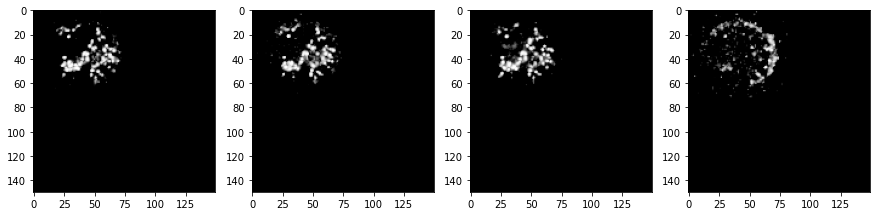


[Image] number 92 	Prediction: 0.57226986 	Category: OFQv69_w4
			Observed: 0.803030303030303


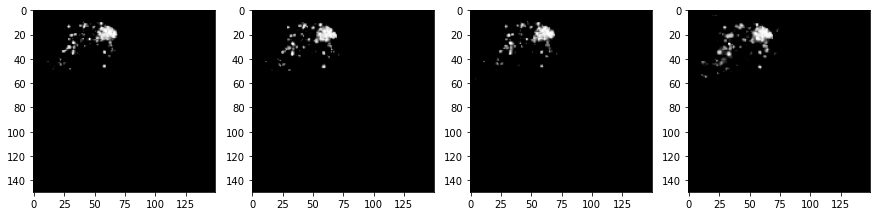


[Image] number 93 	Prediction: 0.5729622 	Category: shyam04_w2
			Observed: 0.6818181818181818


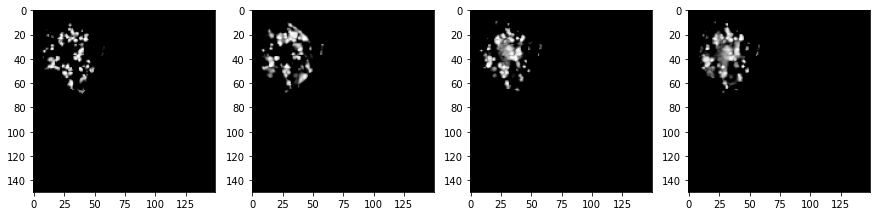


[Image] number 94 	Prediction: 0.5749345 	Category: OFQv65_w2
			Observed: 0.5


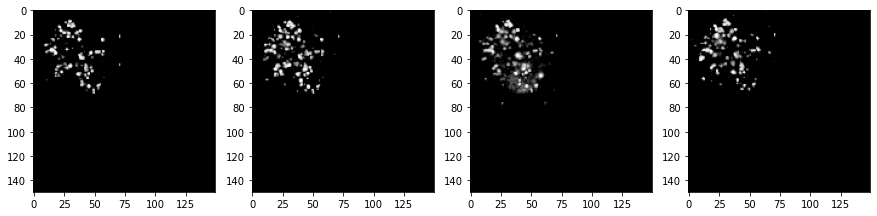


[Image] number 95 	Prediction: 0.57877743 	Category: shyam04_w5
			Observed: 0.696969696969697


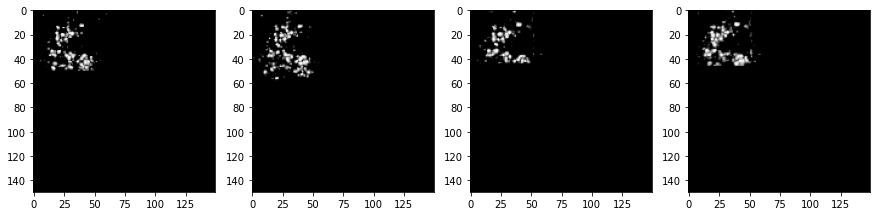


[Image] number 96 	Prediction: 0.58113974 	Category: OFQv69_w2
			Observed: 0.6515151515151515


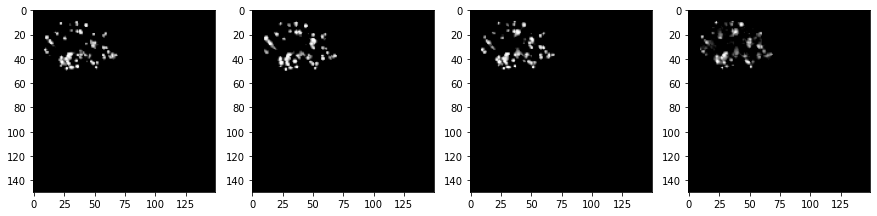


[Image] number 97 	Prediction: 0.5830294 	Category: OFQv69_w1
			Observed: 0.4393939393939394


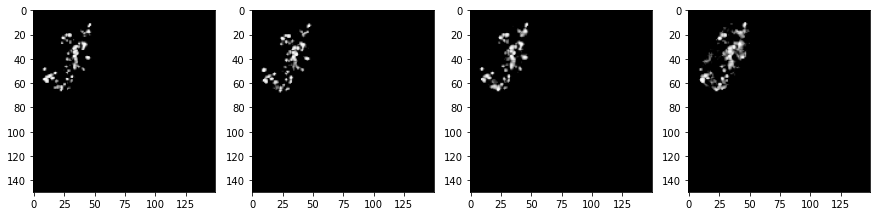


[Image] number 98 	Prediction: 0.5865512 	Category: OFQv69_w1
			Observed: 0.5757575757575758


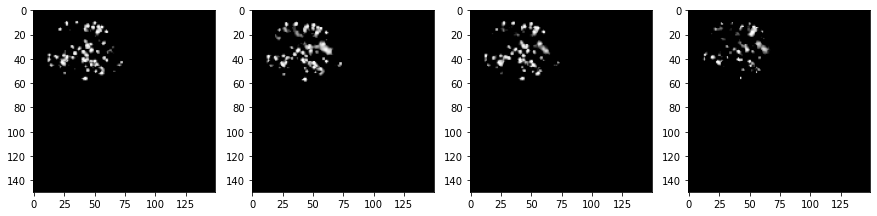


[Image] number 99 	Prediction: 0.58690786 	Category: shyam04_w1
			Observed: 0.6363636363636364


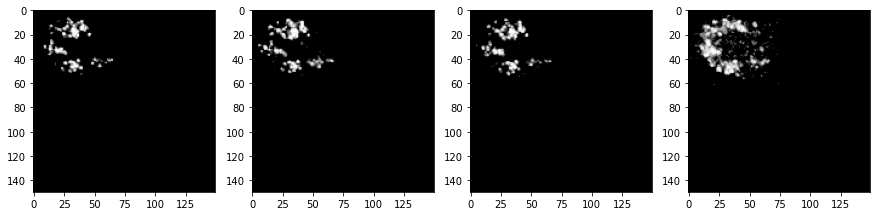


[Image] number 100 	Prediction: 0.5921027 	Category: OFQv69_w4
			Observed: 0.5909090909090909


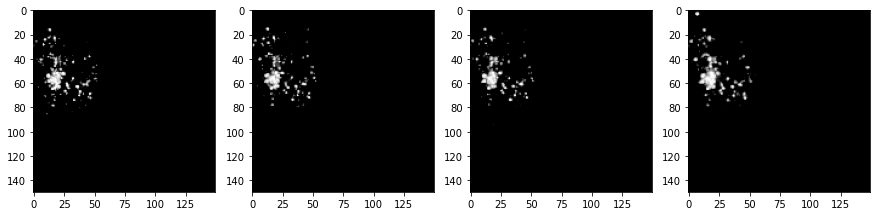


[Image] number 101 	Prediction: 0.59546393 	Category: OFQv69_w3
			Observed: 0.9090909090909091


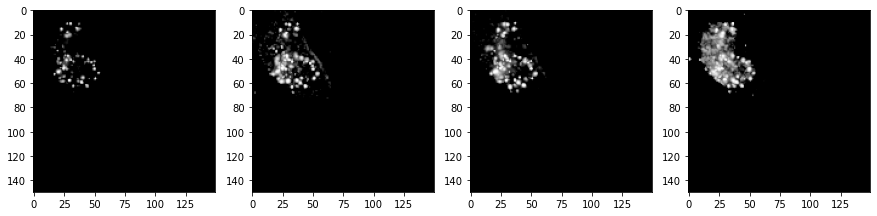


[Image] number 102 	Prediction: 0.59802234 	Category: shyam04_w5
			Observed: 0.5151515151515151


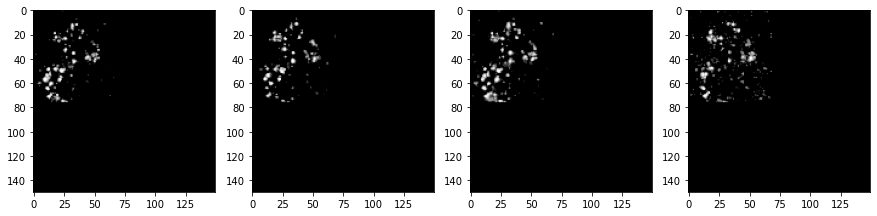


[Image] number 103 	Prediction: 0.6019622 	Category: OFQv69_w2
			Observed: 0.3787878787878788


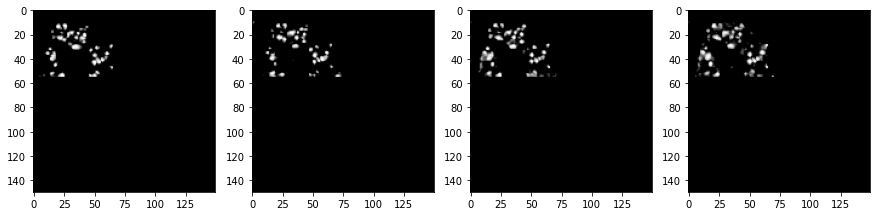


[Image] number 104 	Prediction: 0.60242987 	Category: OFQv69_w2
			Observed: 0.6212121212121212


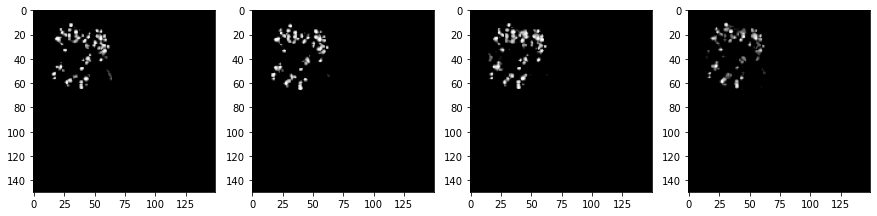


[Image] number 105 	Prediction: 0.6046678 	Category: OFQv67_w5
			Observed: 0.7272727272727273


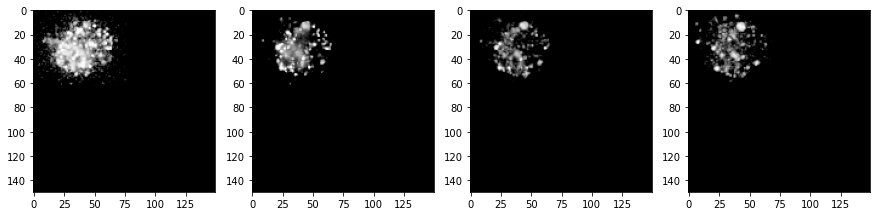


[Image] number 106 	Prediction: 0.60471535 	Category: OFQv61_w4
			Observed: 0.6212121212121212


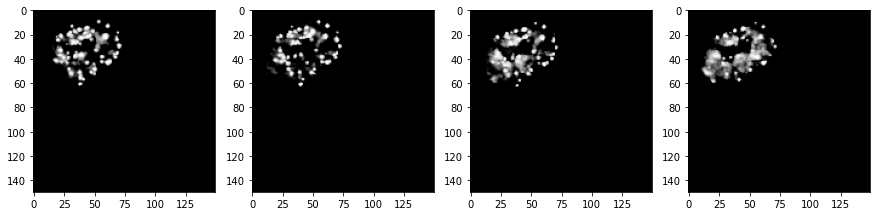


[Image] number 107 	Prediction: 0.60727274 	Category: OFQv68_w3
			Observed: 0.7121212121212122


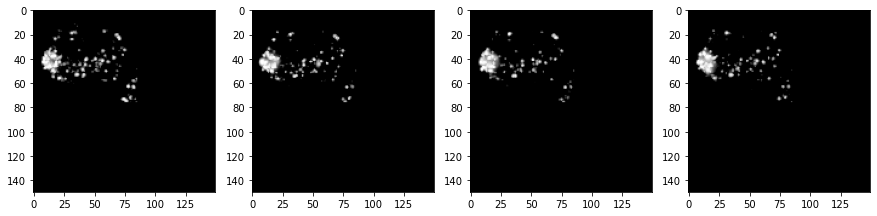


[Image] number 108 	Prediction: 0.6092719 	Category: OFQv69_w3
			Observed: 0.9090909090909091


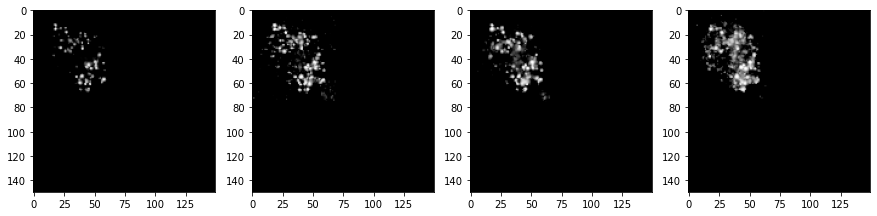


[Image] number 109 	Prediction: 0.60973954 	Category: OFQv69_w1
			Observed: 0.6060606060606061


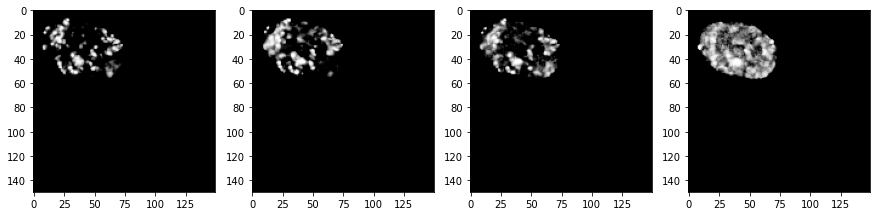


[Image] number 110 	Prediction: 0.6105134 	Category: OFQv69_w1
			Observed: 0.7272727272727273


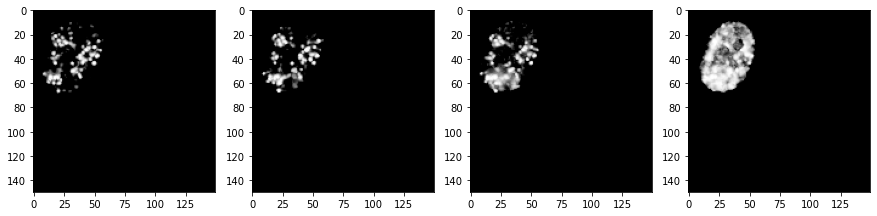


[Image] number 111 	Prediction: 0.6121014 	Category: OFQv65_w1
			Observed: 0.6212121212121212


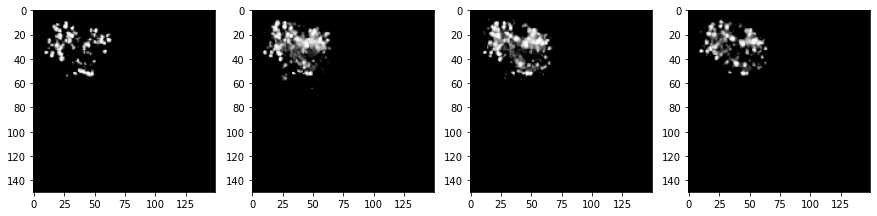


[Image] number 112 	Prediction: 0.6125808 	Category: OFQv69_w2
			Observed: 0.6515151515151515


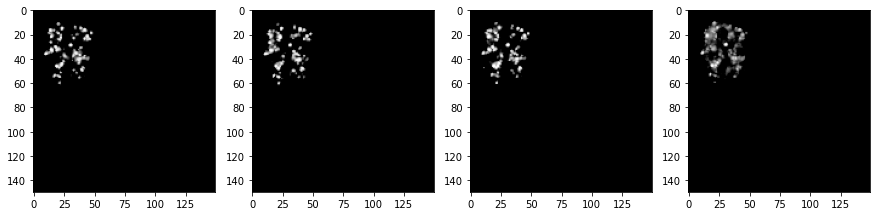


[Image] number 113 	Prediction: 0.6140615 	Category: shyam04_w1
			Observed: 0.5


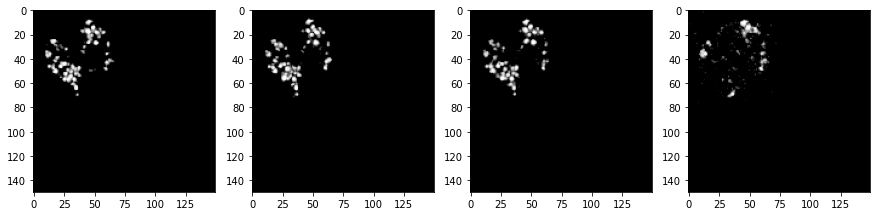


[Image] number 114 	Prediction: 0.61953104 	Category: OFQv69_w1
			Observed: 0.6212121212121212


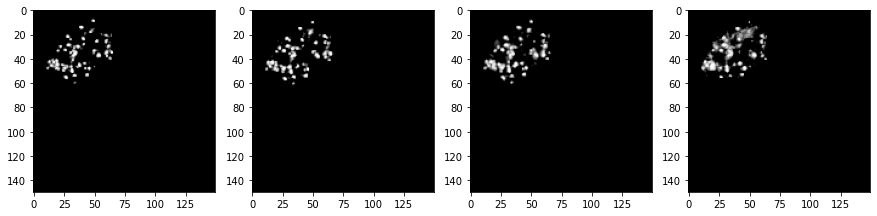


[Image] number 115 	Prediction: 0.6216315 	Category: OFQv65_w2
			Observed: 0.6666666666666666


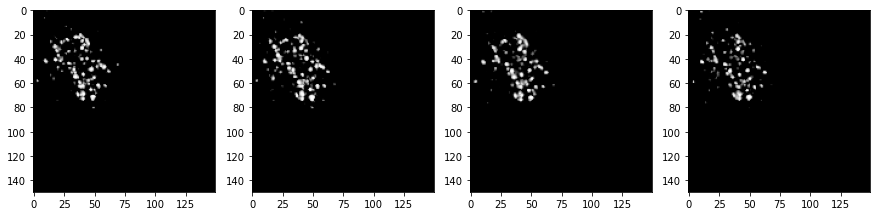


[Image] number 116 	Prediction: 0.6257397 	Category: shyam01_ch2
			Observed: 0.5909090909090909


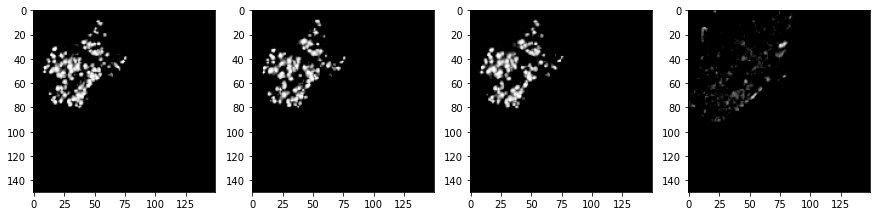


[Image] number 117 	Prediction: 0.6258763 	Category: shyam04_w2
			Observed: 0.45454545454545453


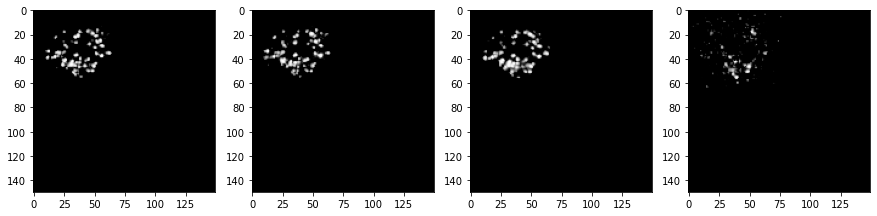


[Image] number 118 	Prediction: 0.6259066 	Category: OFQv69_w2
			Observed: 0.6666666666666666


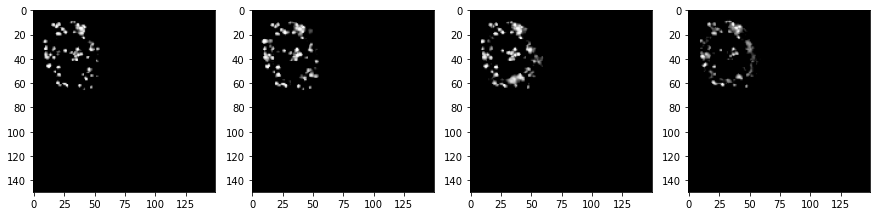


[Image] number 119 	Prediction: 0.6269218 	Category: shyam04_w2
			Observed: 0.6818181818181818


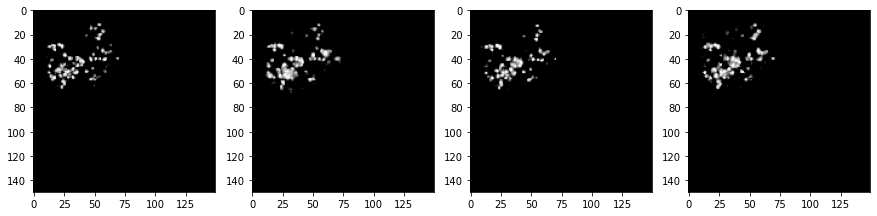


[Image] number 120 	Prediction: 0.6289124 	Category: shyam01_ch2
			Observed: 0.7878787878787878


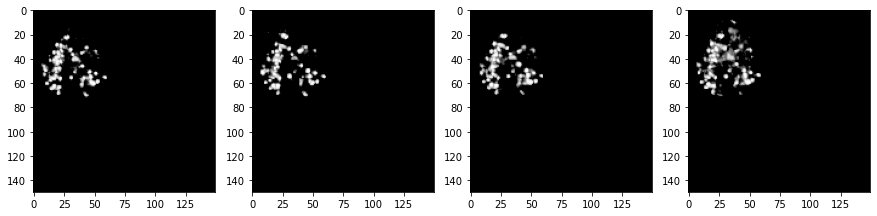


[Image] number 121 	Prediction: 0.63105446 	Category: OFQv65_w4
			Observed: 0.6363636363636364


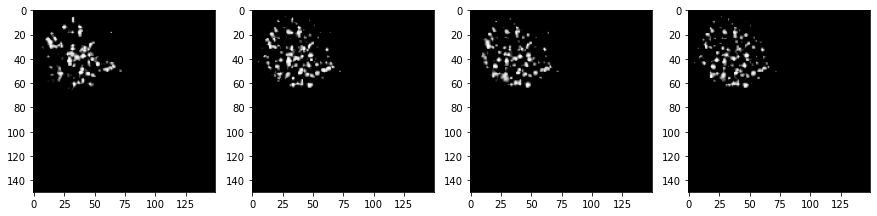


[Image] number 122 	Prediction: 0.63247544 	Category: OFQv68_w4
			Observed: 0.6363636363636364


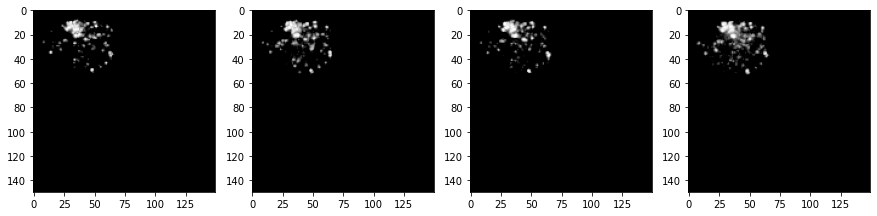


[Image] number 123 	Prediction: 0.63291687 	Category: shyam04_w1
			Observed: 0.5909090909090909


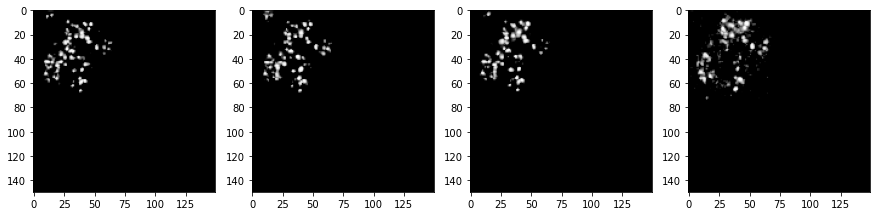


[Image] number 124 	Prediction: 0.63308644 	Category: OFQv69_w1
			Observed: 0.6212121212121212


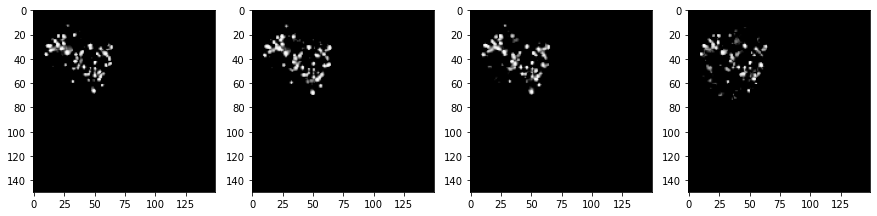


[Image] number 125 	Prediction: 0.6332731 	Category: OFQv69_w2
			Observed: 0.6363636363636364


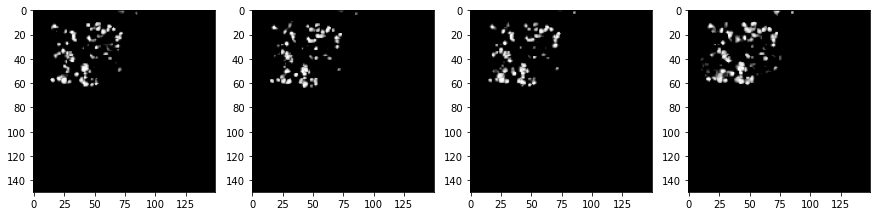


[Image] number 126 	Prediction: 0.63487977 	Category: shyam04_w1
			Observed: 0.6212121212121212


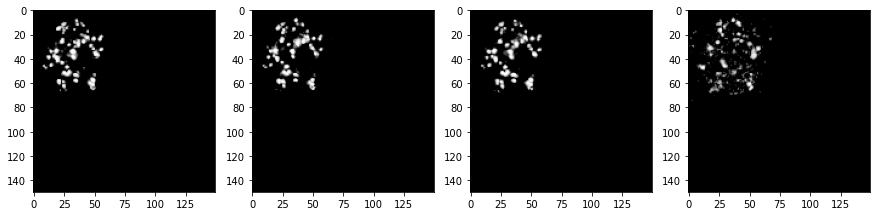


[Image] number 127 	Prediction: 0.63499635 	Category: OFQv65_w4
			Observed: 0.5757575757575758


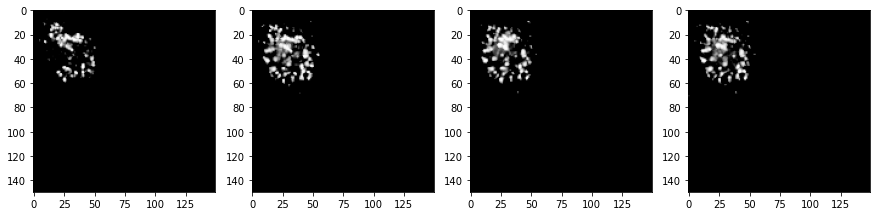


[Image] number 128 	Prediction: 0.63514996 	Category: OFQv61_w4
			Observed: 0.5909090909090909


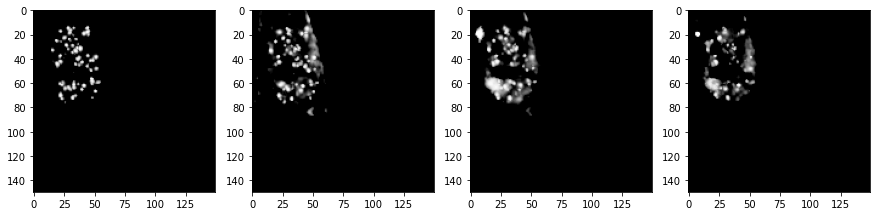


[Image] number 129 	Prediction: 0.636469 	Category: OFQv69_w4
			Observed: 0.696969696969697


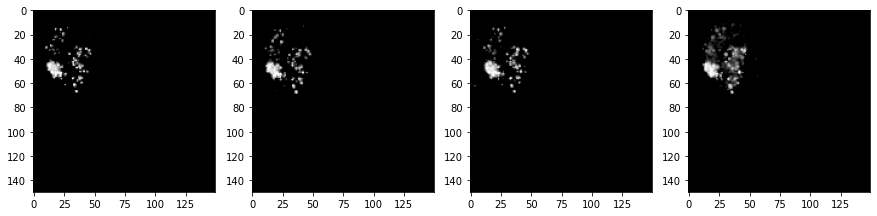


[Image] number 130 	Prediction: 0.6369238 	Category: OFQv69_w3
			Observed: 0.7878787878787878


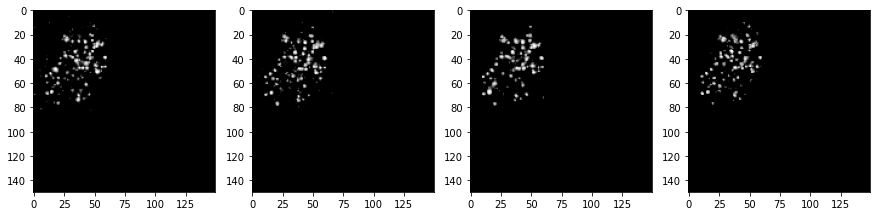


[Image] number 131 	Prediction: 0.6399567 	Category: OFQv69_w4
			Observed: 0.5303030303030303


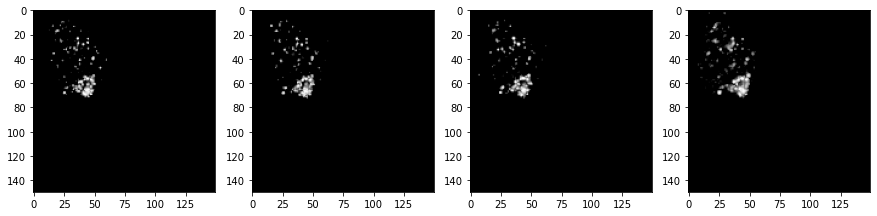


[Image] number 132 	Prediction: 0.6410891 	Category: OFQv69_w4
			Observed: 0.8181818181818182


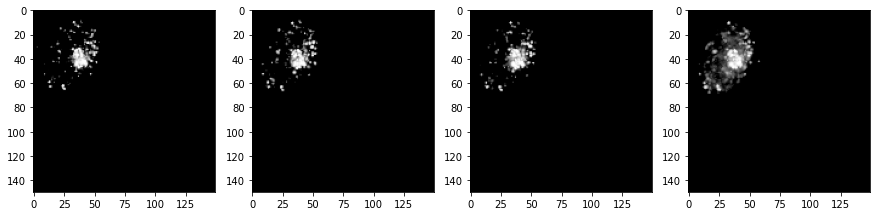


[Image] number 133 	Prediction: 0.6455392 	Category: shyam01_ch2
			Observed: 0.4393939393939394


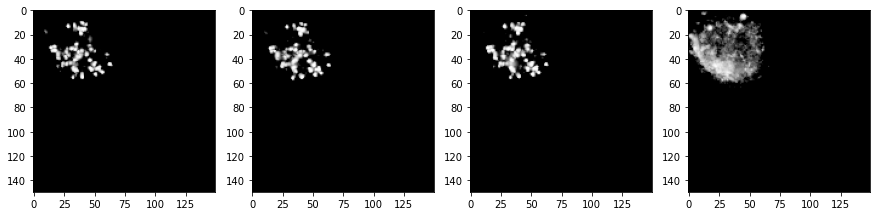


[Image] number 134 	Prediction: 0.6465505 	Category: OFQv69_w1
			Observed: 0.5909090909090909


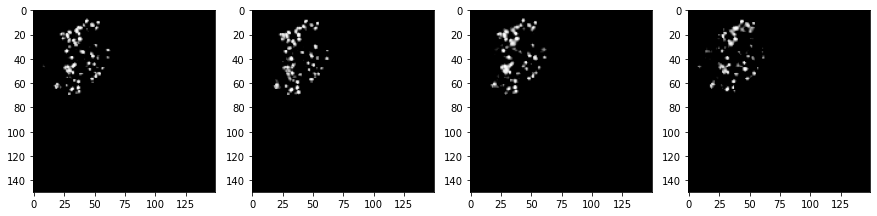


[Image] number 135 	Prediction: 0.6471241 	Category: OFQv69_w1
			Observed: 0.696969696969697


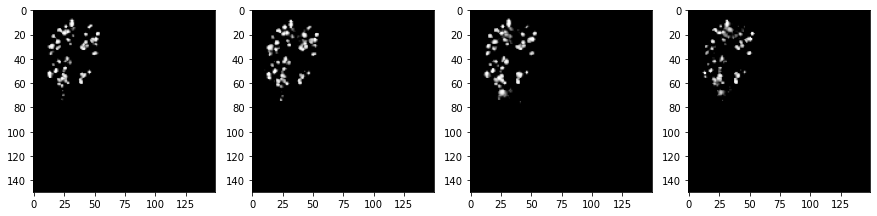


[Image] number 136 	Prediction: 0.647634 	Category: OFQv69_w1
			Observed: 0.5


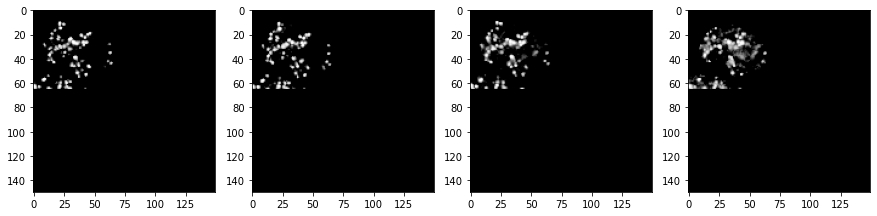


[Image] number 137 	Prediction: 0.6481213 	Category: OFQv69_w1
			Observed: 0.7121212121212122


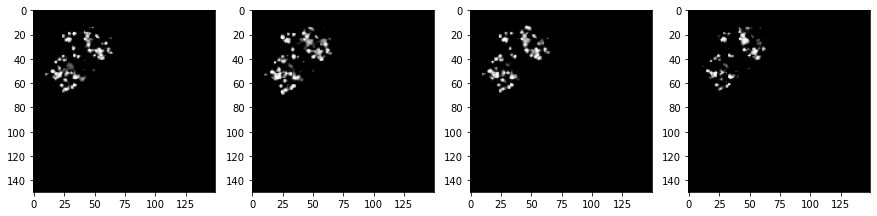


[Image] number 138 	Prediction: 0.65061224 	Category: OFQv69_w1
			Observed: 0.6666666666666666


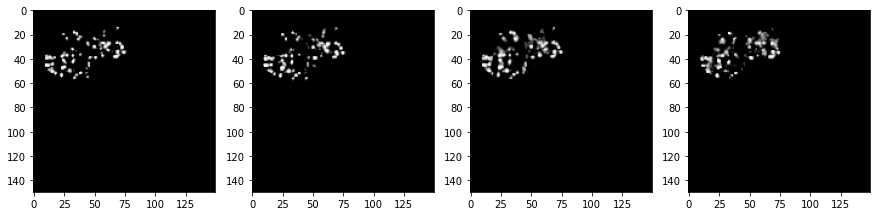


[Image] number 139 	Prediction: 0.65276444 	Category: OFQv68_w3
			Observed: 0.7575757575757576


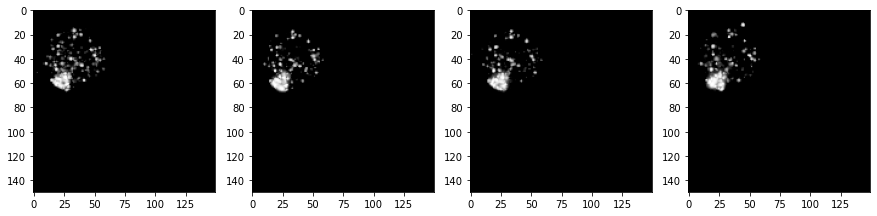


[Image] number 140 	Prediction: 0.65287644 	Category: OFQv65_w3
			Observed: 0.6060606060606061


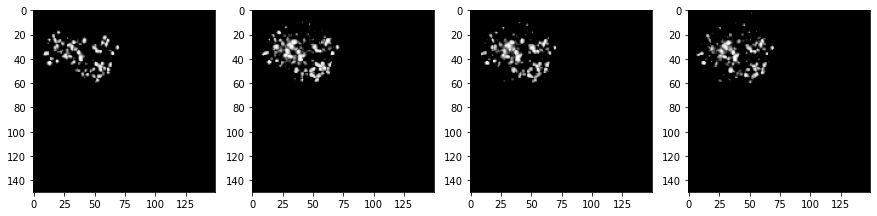


[Image] number 141 	Prediction: 0.6541095 	Category: shyam01_ch5
			Observed: 0.5303030303030303


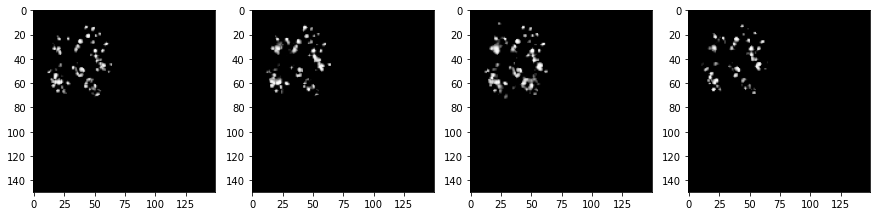


[Image] number 142 	Prediction: 0.6543192 	Category: OFQv69_w4
			Observed: 0.6060606060606061


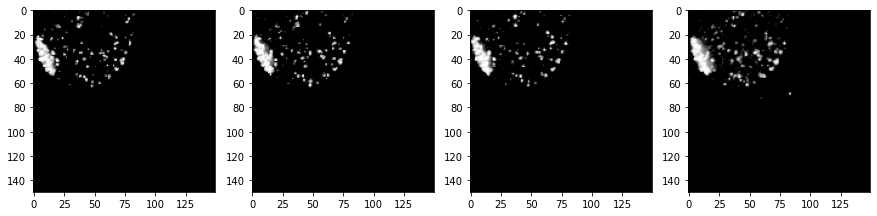


[Image] number 143 	Prediction: 0.6546483 	Category: shyam01_ch3
			Observed: 0.7121212121212122


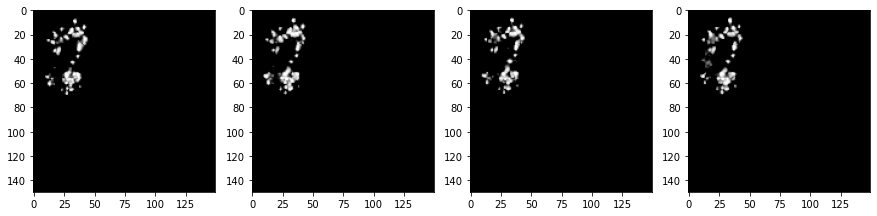


[Image] number 144 	Prediction: 0.6585556 	Category: OFQv69_w2
			Observed: 0.7727272727272727


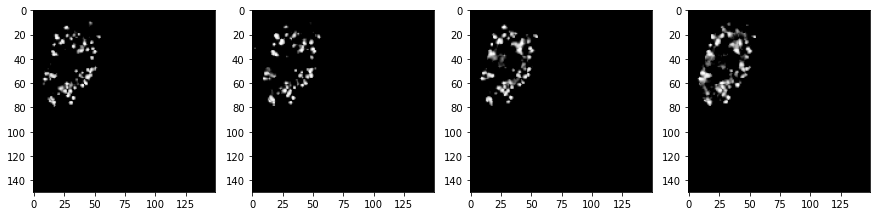


[Image] number 145 	Prediction: 0.6589402 	Category: OFQv69_w4
			Observed: 0.7272727272727273


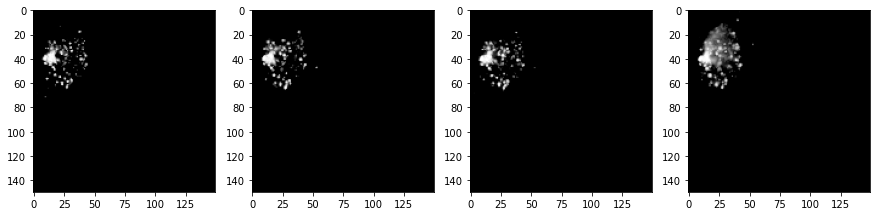


[Image] number 146 	Prediction: 0.6592693 	Category: OFQv69_w1
			Observed: 0.7121212121212122


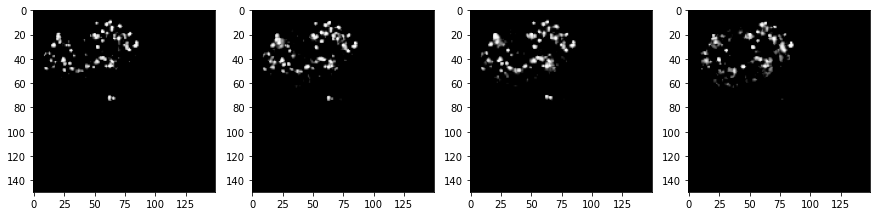


[Image] number 147 	Prediction: 0.6594064 	Category: OFQv61_w4
			Observed: 0.6060606060606061


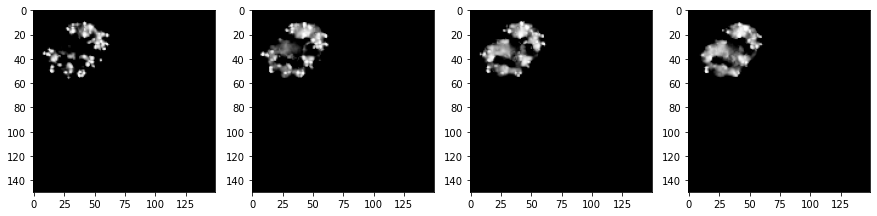


[Image] number 148 	Prediction: 0.6604041 	Category: OFQv69_w2
			Observed: 0.5606060606060606


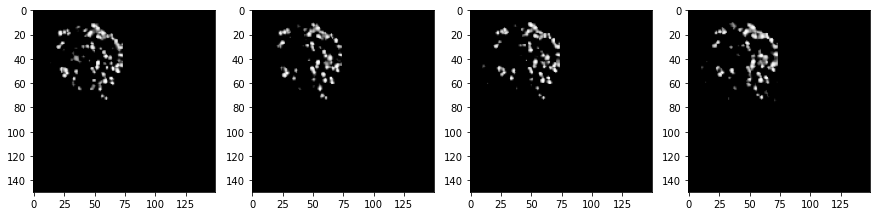


[Image] number 149 	Prediction: 0.66082126 	Category: shyam04_w4
			Observed: 0.8333333333333334


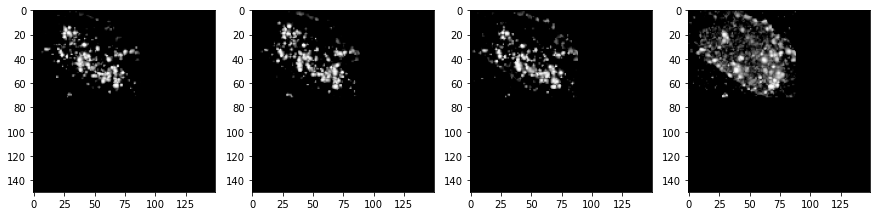


[Image] number 150 	Prediction: 0.6610502 	Category: OFQv65_w1
			Observed: 0.5909090909090909


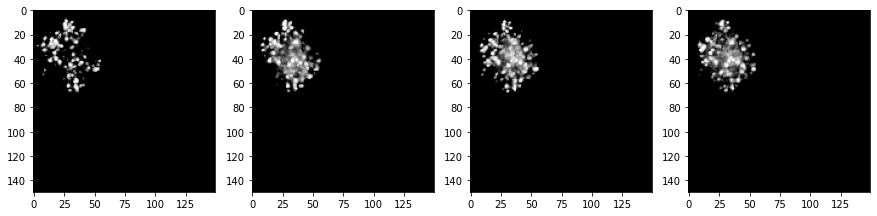


[Image] number 151 	Prediction: 0.6682048 	Category: OFQv65_w4
			Observed: 0.6363636363636364


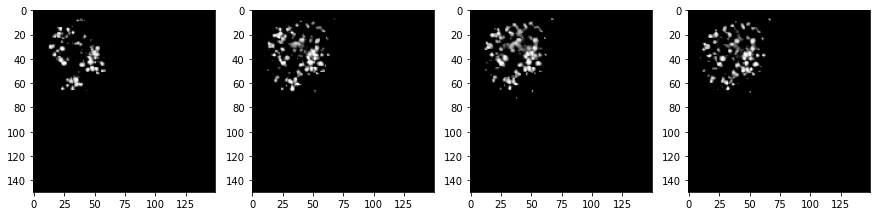


[Image] number 152 	Prediction: 0.6695739 	Category: OFQv61_w3
			Observed: 0.696969696969697


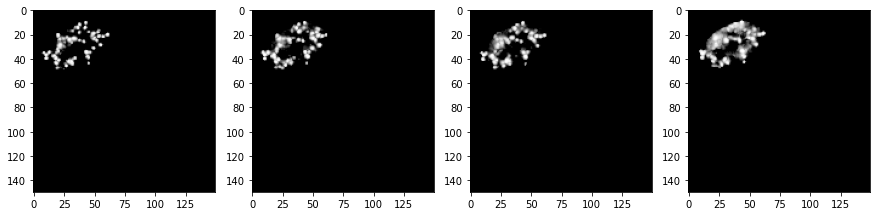


[Image] number 153 	Prediction: 0.6708128 	Category: OFQv69_w2
			Observed: 0.6363636363636364


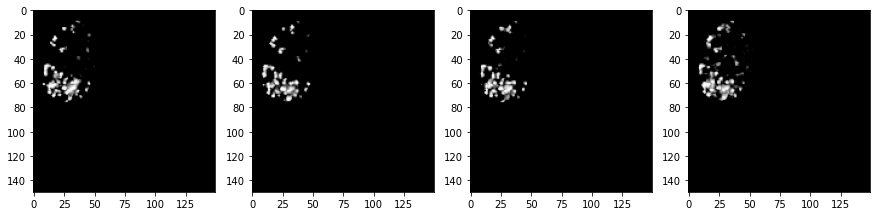


[Image] number 154 	Prediction: 0.67094064 	Category: OFQv69_w3
			Observed: 0.9393939393939394


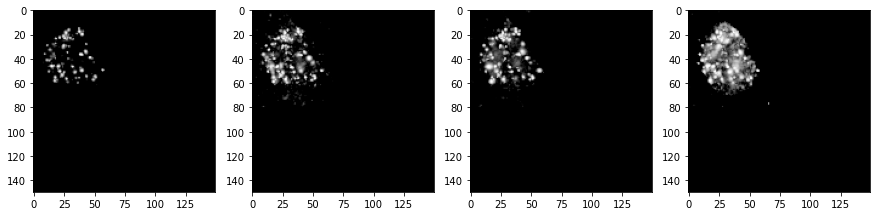


[Image] number 155 	Prediction: 0.6709533 	Category: shyam01_ch3
			Observed: 0.6060606060606061


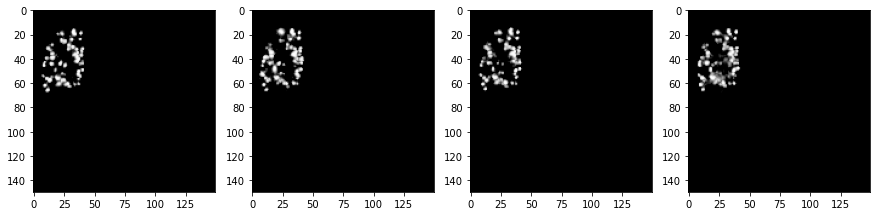


[Image] number 156 	Prediction: 0.6710736 	Category: OFQv69_w2
			Observed: 0.696969696969697


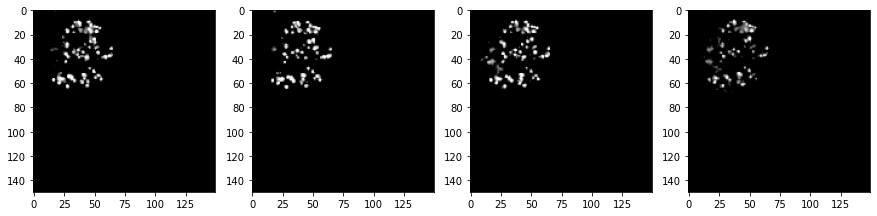


[Image] number 157 	Prediction: 0.67110366 	Category: shyam04_w5
			Observed: 0.6515151515151515


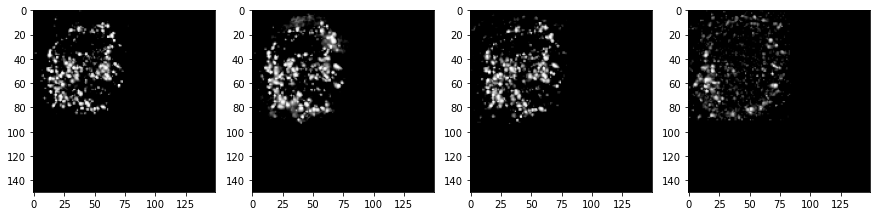


[Image] number 158 	Prediction: 0.674867 	Category: OFQv68_w3
			Observed: 0.6515151515151515


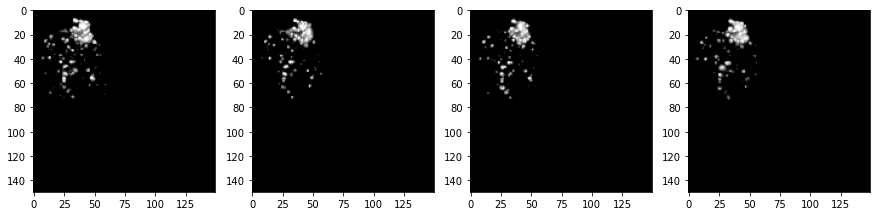


[Image] number 159 	Prediction: 0.67532915 	Category: OFQv69_w4
			Observed: 0.696969696969697


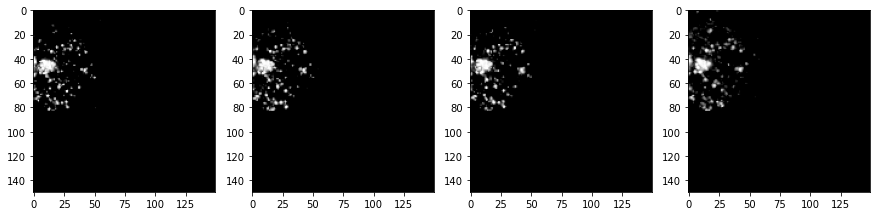


[Image] number 160 	Prediction: 0.67594236 	Category: OFQv69_w2
			Observed: 0.7272727272727273


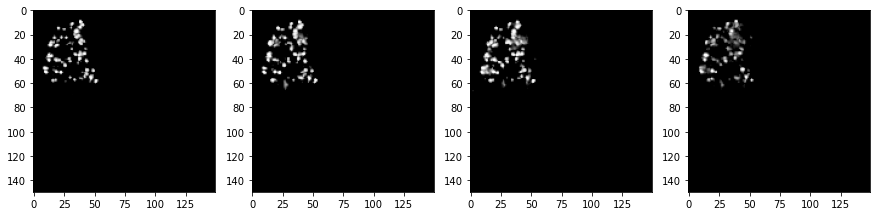


[Image] number 161 	Prediction: 0.6762897 	Category: OFQv69_w2
			Observed: 0.6666666666666666


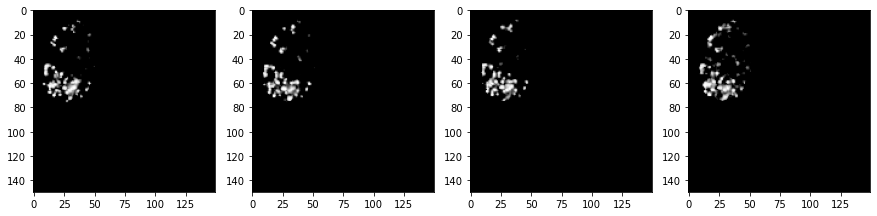


[Image] number 162 	Prediction: 0.6764189 	Category: OFQv69_w2
			Observed: 0.7121212121212122


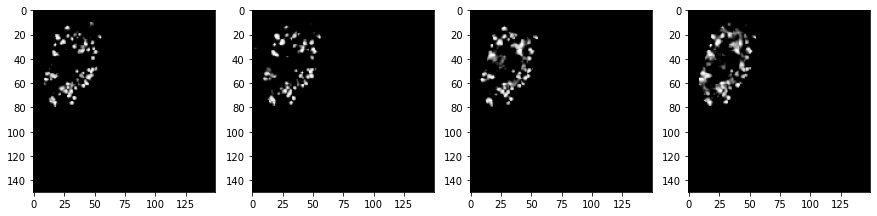


[Image] number 163 	Prediction: 0.6783824 	Category: shyam04_w2
			Observed: 0.6060606060606061


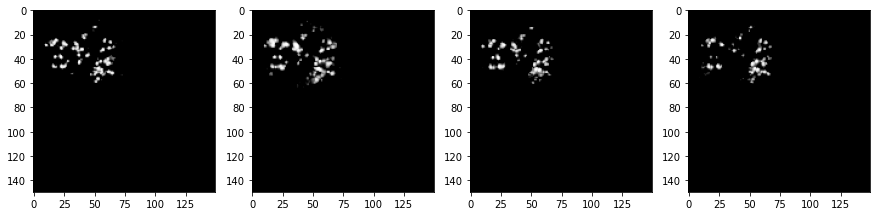


[Image] number 164 	Prediction: 0.6800902 	Category: OFQv69_w1
			Observed: 0.7272727272727273


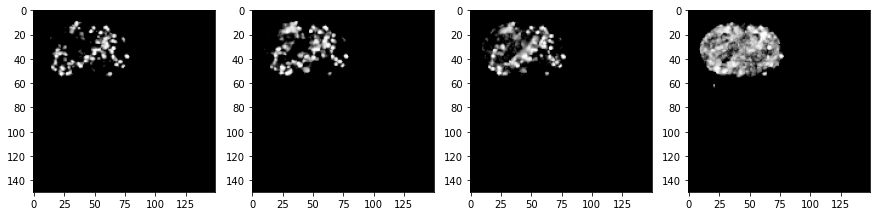


[Image] number 165 	Prediction: 0.6808304 	Category: OFQv69_w2
			Observed: 0.5909090909090909


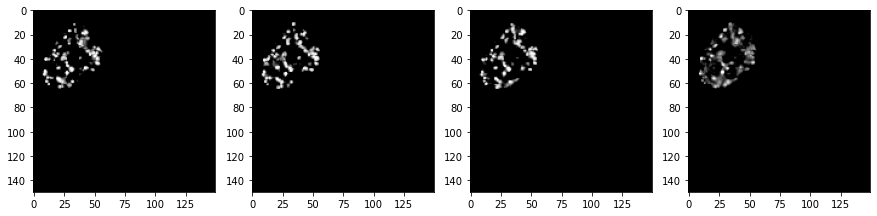


[Image] number 166 	Prediction: 0.6809235 	Category: shyam04_w5
			Observed: 0.7727272727272727


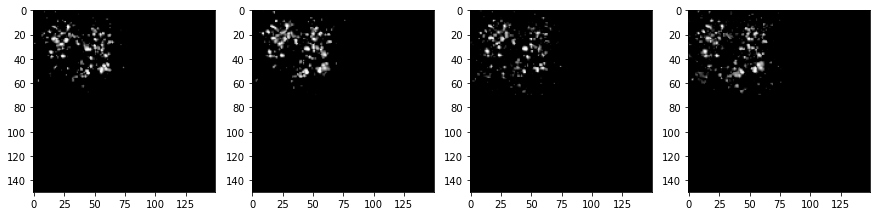


[Image] number 167 	Prediction: 0.6812778 	Category: shyam01_ch2
			Observed: 0.7575757575757576


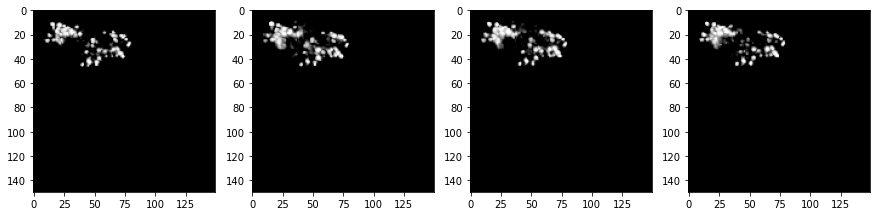


[Image] number 168 	Prediction: 0.6814286 	Category: OFQv69_w1
			Observed: 0.696969696969697


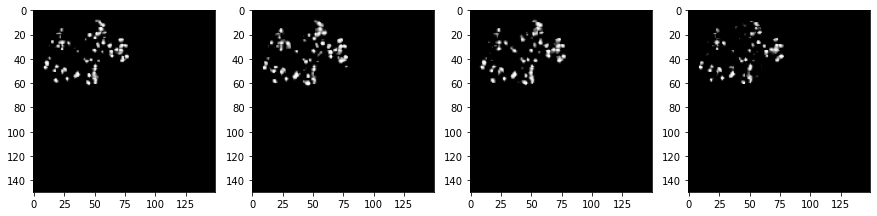


[Image] number 169 	Prediction: 0.683136 	Category: shyam04_w5
			Observed: 0.8333333333333334


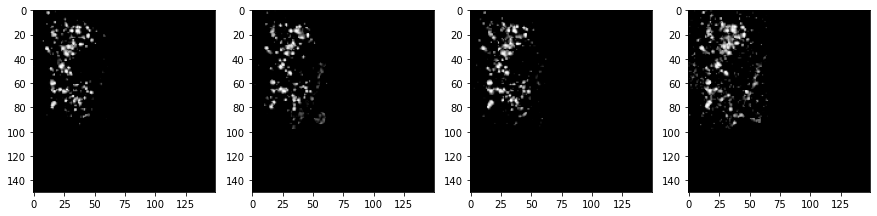


[Image] number 170 	Prediction: 0.684766 	Category: shyam04_w5
			Observed: 0.8939393939393939


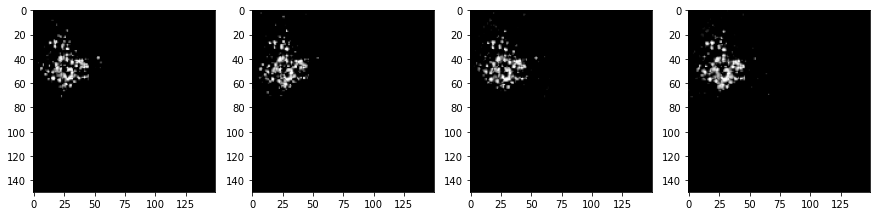


[Image] number 171 	Prediction: 0.6851645 	Category: shyam04_w5
			Observed: 0.7575757575757576


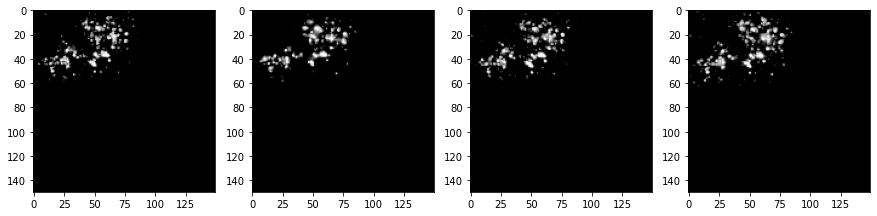


[Image] number 172 	Prediction: 0.6852015 	Category: OFQv69_w2
			Observed: 0.6363636363636364


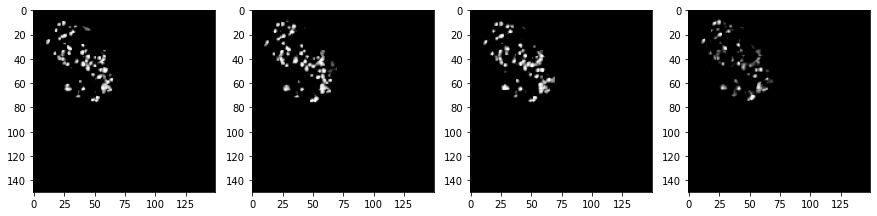


[Image] number 173 	Prediction: 0.6865184 	Category: OFQv65_w2
			Observed: 0.5909090909090909


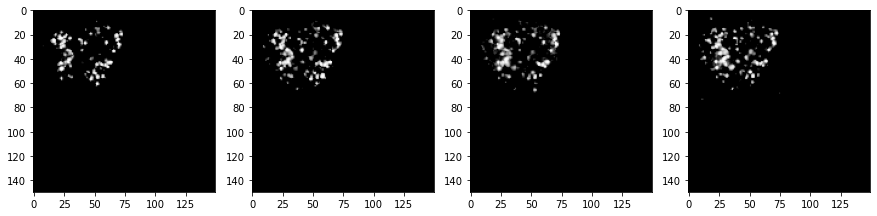


[Image] number 174 	Prediction: 0.68677276 	Category: OFQv61_w4
			Observed: 0.7727272727272727


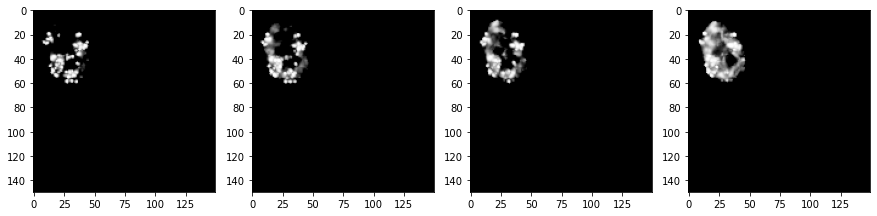


[Image] number 175 	Prediction: 0.68768394 	Category: shyam04_w2
			Observed: 0.5606060606060606


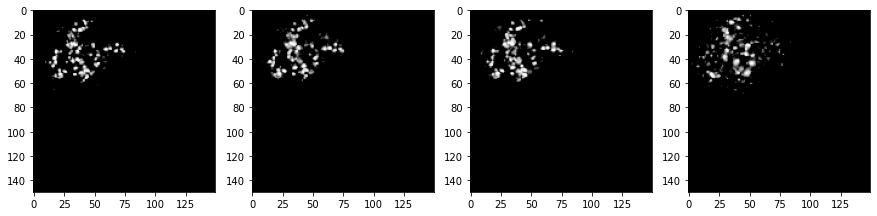


[Image] number 176 	Prediction: 0.6887386 	Category: shyam01_ch5
			Observed: 0.5606060606060606


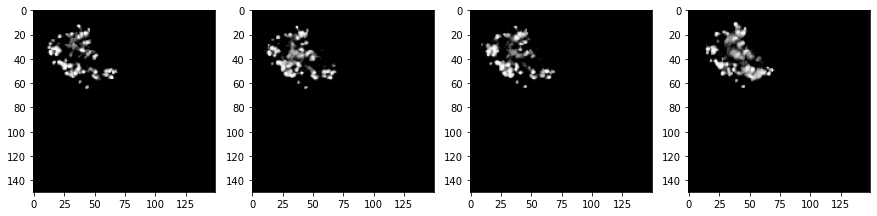


[Image] number 177 	Prediction: 0.69099617 	Category: OFQv69_w4
			Observed: 0.7878787878787878


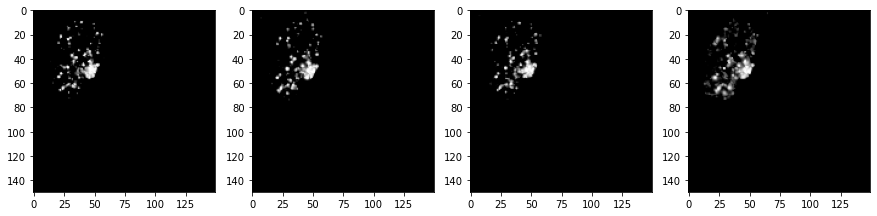


[Image] number 178 	Prediction: 0.6910418 	Category: OFQv61_w3
			Observed: 0.8484848484848485


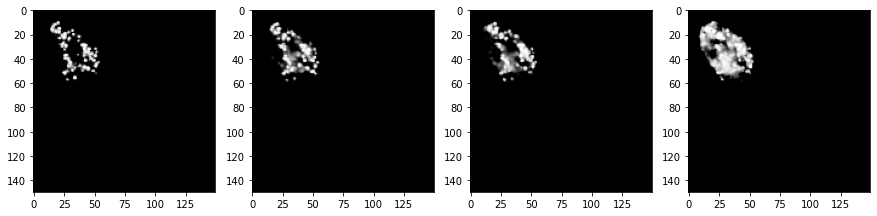


[Image] number 179 	Prediction: 0.6947365 	Category: OFQv69_w1
			Observed: 0.8484848484848485


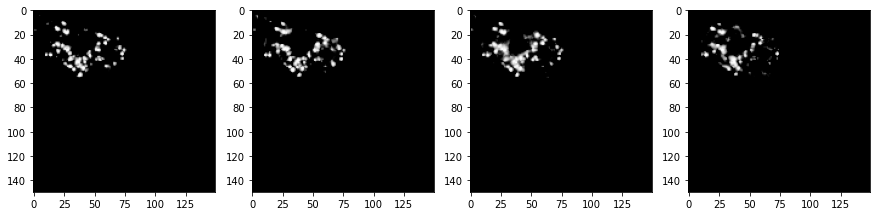


[Image] number 180 	Prediction: 0.6984529 	Category: OFQv68_w3
			Observed: 0.7424242424242424


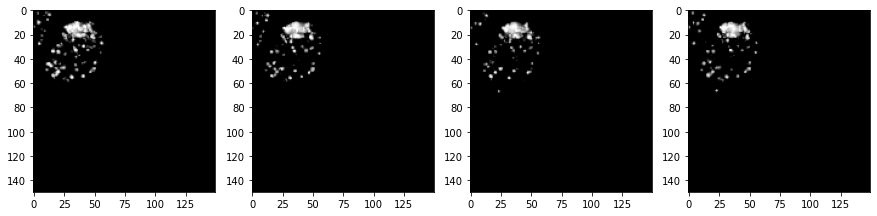


[Image] number 181 	Prediction: 0.69869524 	Category: OFQv69_w1
			Observed: 0.6818181818181818


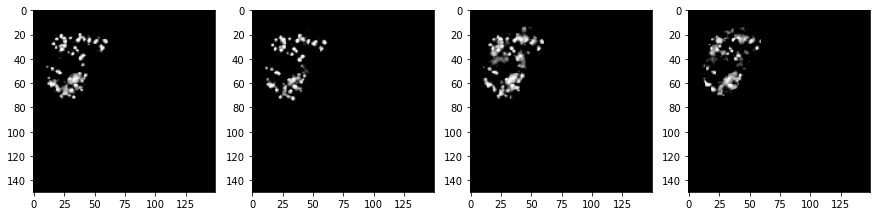


[Image] number 182 	Prediction: 0.69930905 	Category: OFQv67_w4
			Observed: 0.7272727272727273


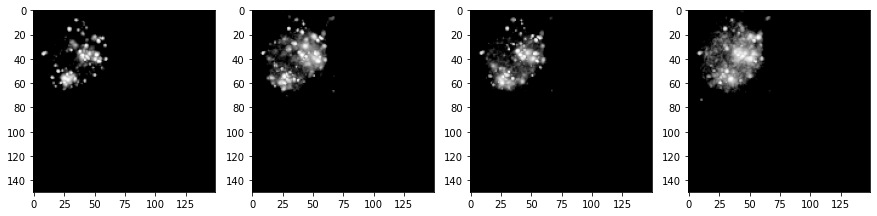


[Image] number 183 	Prediction: 0.70039105 	Category: shyam01_ch1
			Observed: 0.7878787878787878


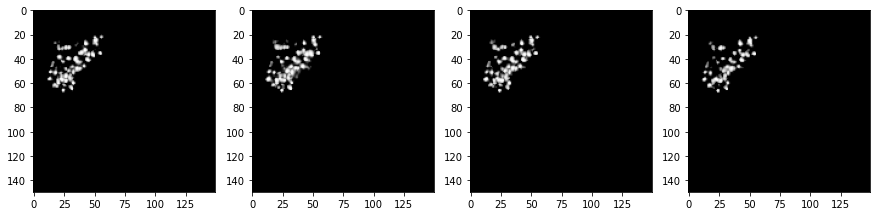


[Image] number 184 	Prediction: 0.70155686 	Category: shyam04_w1
			Observed: 0.7121212121212122


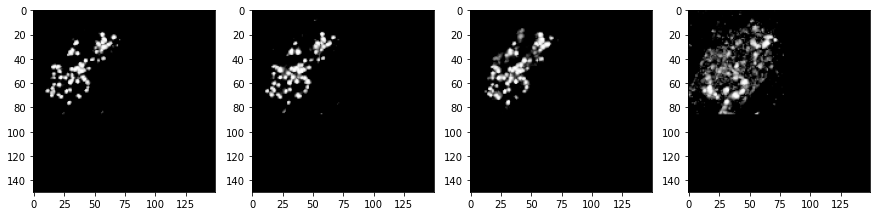


[Image] number 185 	Prediction: 0.7034773 	Category: OFQv69_w1
			Observed: 0.6666666666666666


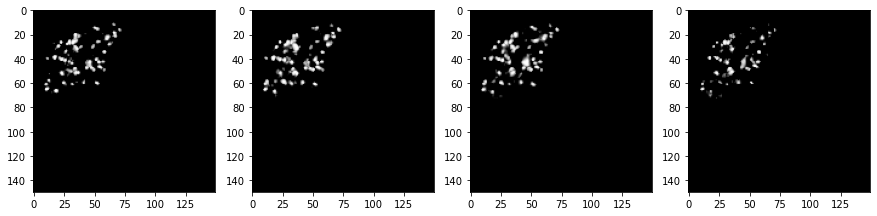


[Image] number 186 	Prediction: 0.7034827 	Category: OFQv61_w2
			Observed: 0.6666666666666666


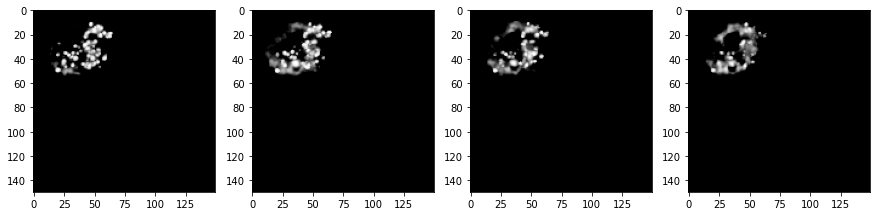


[Image] number 187 	Prediction: 0.7038811 	Category: OFQv69_w1
			Observed: 0.7575757575757576


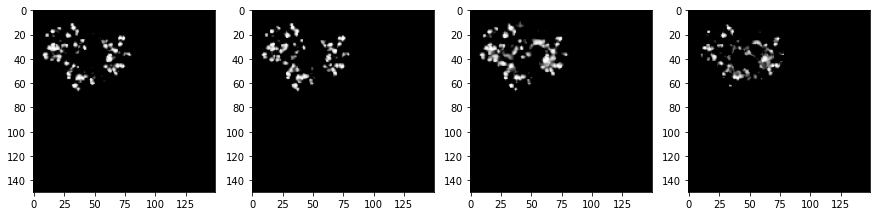


[Image] number 188 	Prediction: 0.7062508 	Category: shyam01_ch1
			Observed: 0.6666666666666666


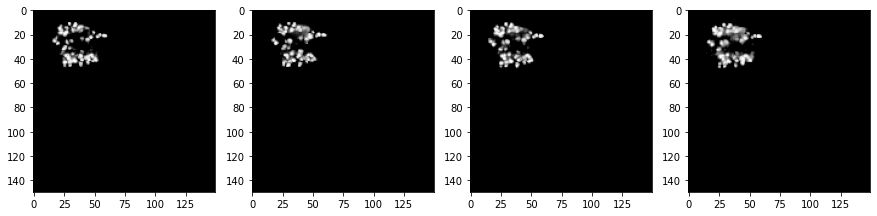


[Image] number 189 	Prediction: 0.70652807 	Category: shyam04_w4
			Observed: 0.4696969696969697


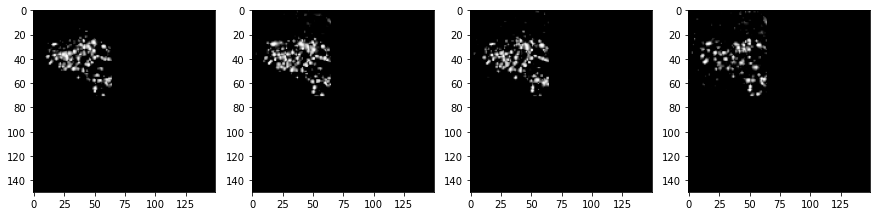


[Image] number 190 	Prediction: 0.7081259 	Category: OFQv69_w2
			Observed: 0.7424242424242424


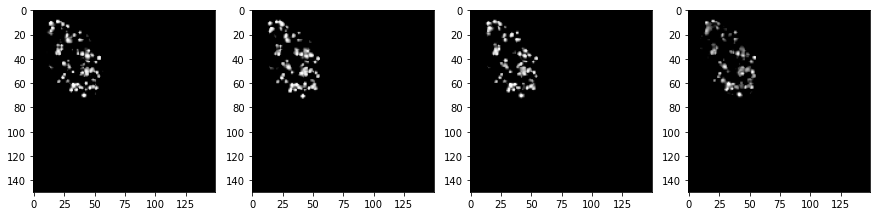


[Image] number 191 	Prediction: 0.7125208 	Category: shyam04_w4
			Observed: 0.5


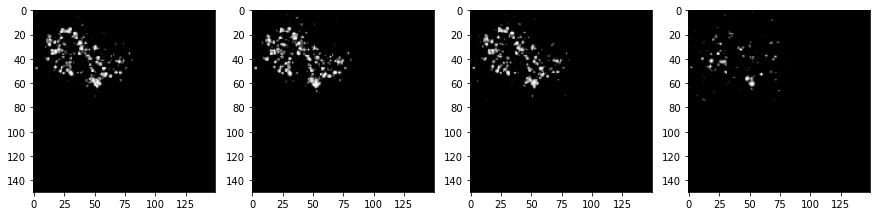


[Image] number 192 	Prediction: 0.7128893 	Category: OFQv69_w1
			Observed: 0.6363636363636364


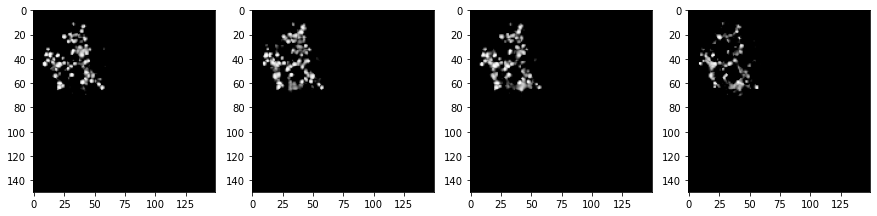


[Image] number 193 	Prediction: 0.7138201 	Category: shyam01_ch2
			Observed: 0.3484848484848485


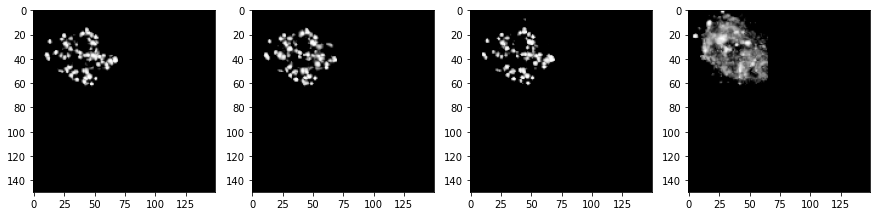


[Image] number 194 	Prediction: 0.71516186 	Category: OFQv61_w3
			Observed: 0.6212121212121212


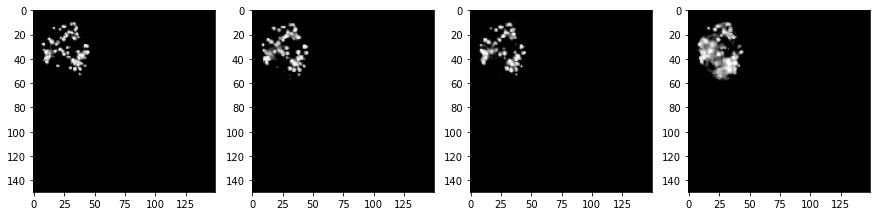


[Image] number 195 	Prediction: 0.716108 	Category: OFQv65_w2
			Observed: 0.48484848484848486


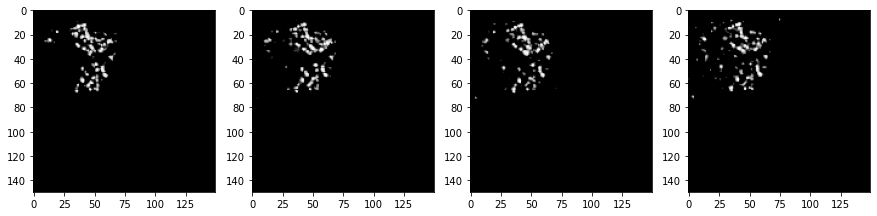


[Image] number 196 	Prediction: 0.7174798 	Category: OFQv69_w2
			Observed: 0.6515151515151515


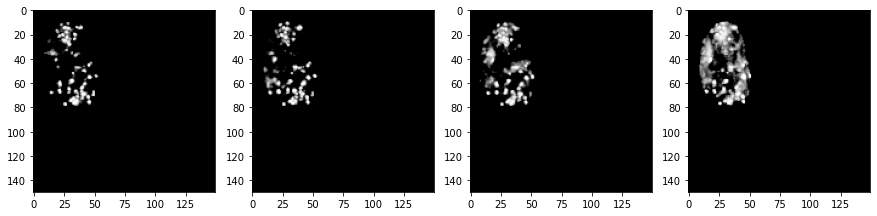


[Image] number 197 	Prediction: 0.7183309 	Category: OFQv61_w2
			Observed: 0.3181818181818182


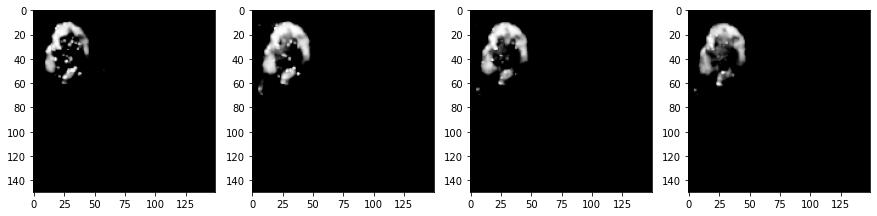


[Image] number 198 	Prediction: 0.71835256 	Category: OFQv69_w4
			Observed: 0.8484848484848485


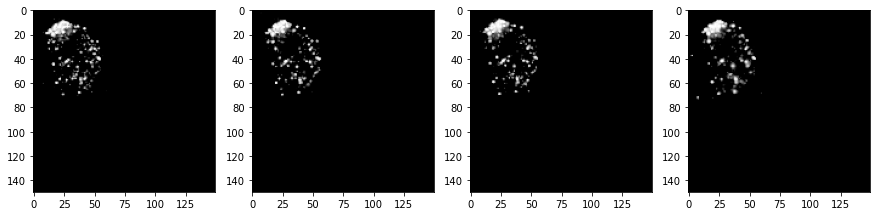


[Image] number 199 	Prediction: 0.71997494 	Category: OFQv69_w1
			Observed: 0.6818181818181818


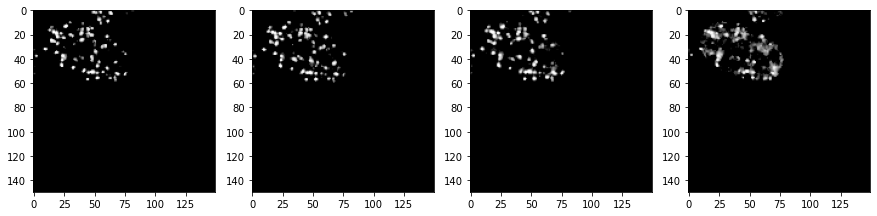


[Image] number 200 	Prediction: 0.7209707 	Category: OFQv67_w5
			Observed: 0.3787878787878788


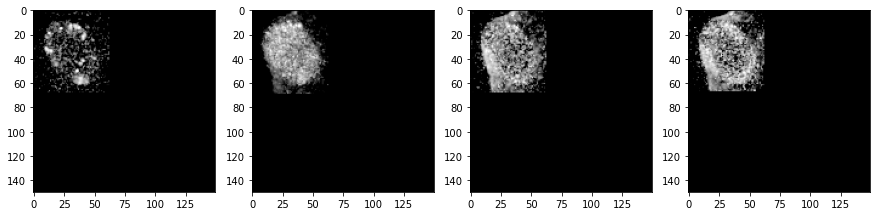


[Image] number 201 	Prediction: 0.72156876 	Category: OFQv69_w1
			Observed: 0.803030303030303


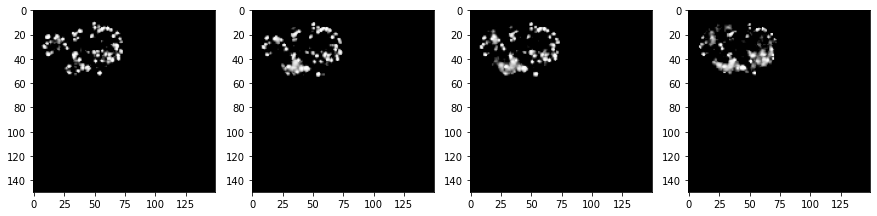


[Image] number 202 	Prediction: 0.72161776 	Category: OFQv61_w4
			Observed: 0.7424242424242424


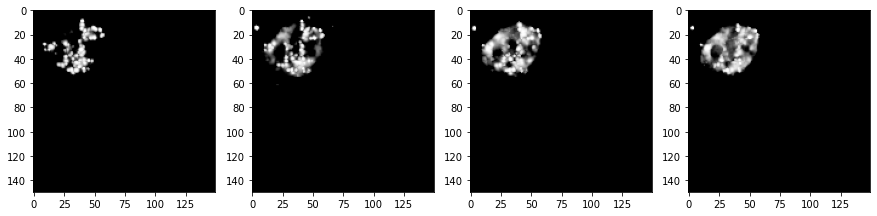


[Image] number 203 	Prediction: 0.72172284 	Category: OFQv69_w2
			Observed: 0.7424242424242424


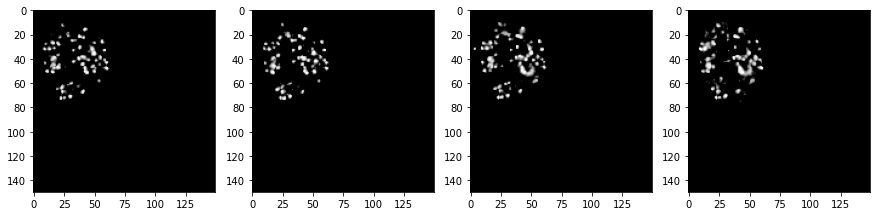


[Image] number 204 	Prediction: 0.72275996 	Category: OFQv69_w2
			Observed: 0.7424242424242424


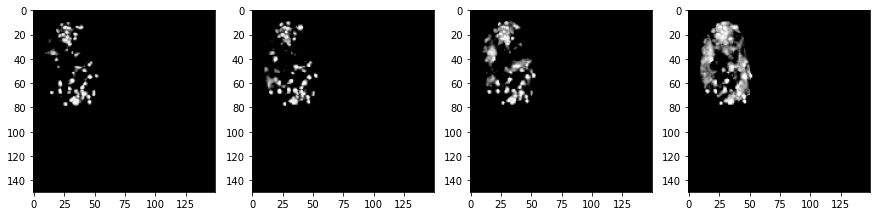


[Image] number 205 	Prediction: 0.72307515 	Category: OFQv68_w3
			Observed: 0.6666666666666666


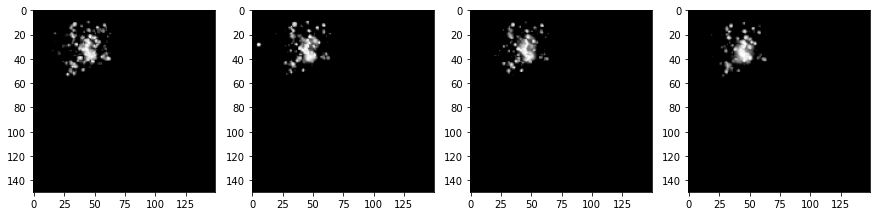


[Image] number 206 	Prediction: 0.7233213 	Category: shyam04_w2
			Observed: 0.36363636363636365


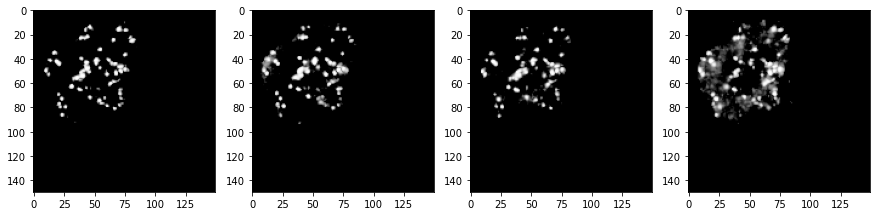


[Image] number 207 	Prediction: 0.72417593 	Category: OFQv61_w3
			Observed: 0.7575757575757576


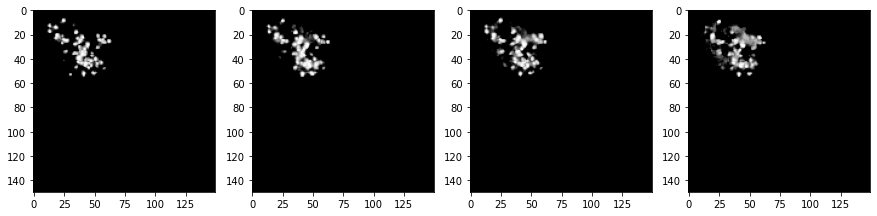


[Image] number 208 	Prediction: 0.727359 	Category: shyam04_w4
			Observed: 0.6212121212121212


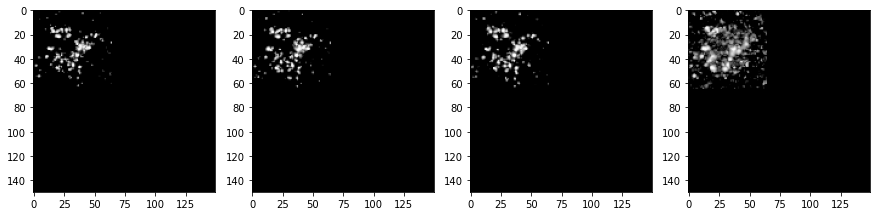


[Image] number 209 	Prediction: 0.72775275 	Category: shyam01_ch5
			Observed: 0.48484848484848486


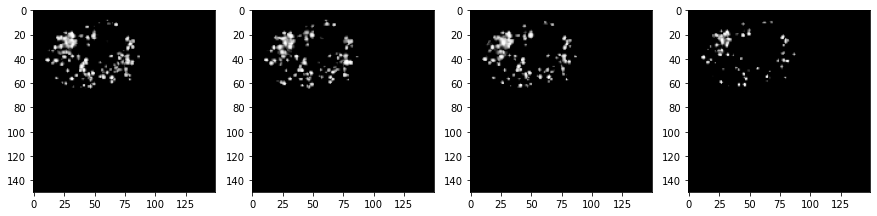


[Image] number 210 	Prediction: 0.7299428 	Category: shyam04_w4
			Observed: 0.6060606060606061


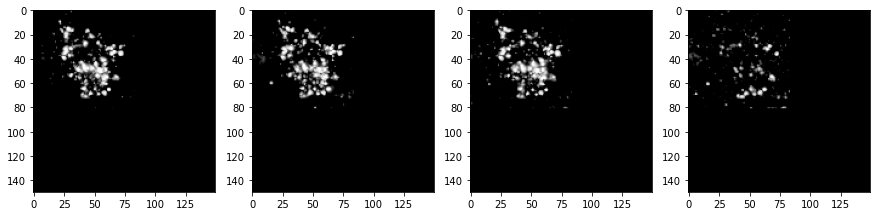


[Image] number 211 	Prediction: 0.7302284 	Category: OFQv65_w2
			Observed: 0.7272727272727273


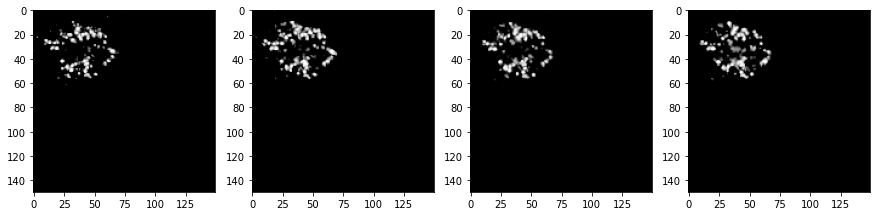


[Image] number 212 	Prediction: 0.73027146 	Category: shyam04_w5
			Observed: 0.7575757575757576


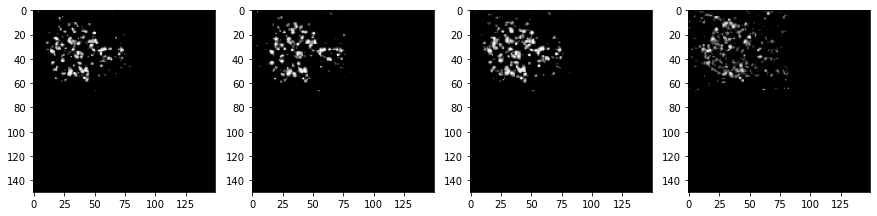


[Image] number 213 	Prediction: 0.73060864 	Category: OFQv65_w3
			Observed: 0.7121212121212122


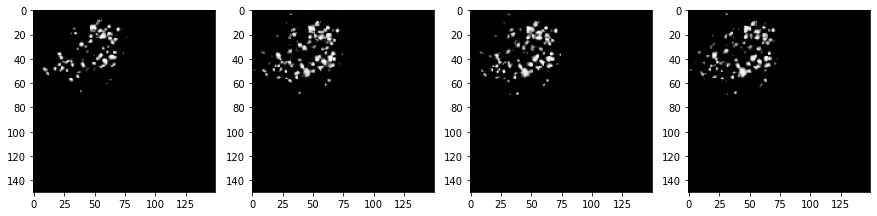


[Image] number 214 	Prediction: 0.73162776 	Category: OFQv69_w3
			Observed: 0.7575757575757576


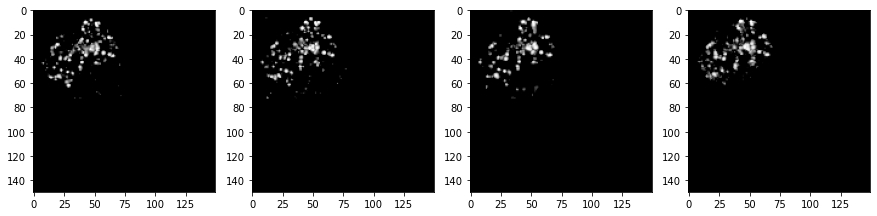


[Image] number 215 	Prediction: 0.7325232 	Category: OFQv69_w4
			Observed: 0.5909090909090909


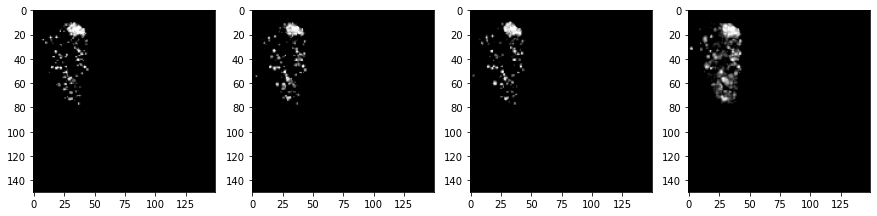


[Image] number 216 	Prediction: 0.7336646 	Category: OFQv69_w1
			Observed: 0.7878787878787878


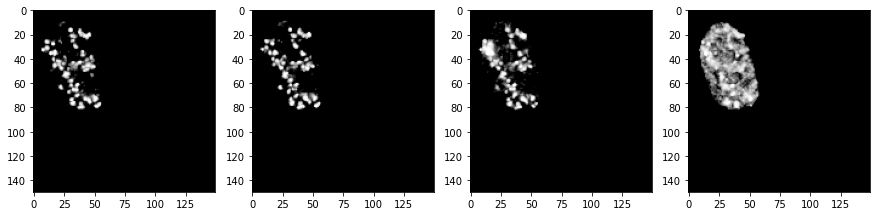


[Image] number 217 	Prediction: 0.73409617 	Category: OFQv69_w4
			Observed: 0.696969696969697


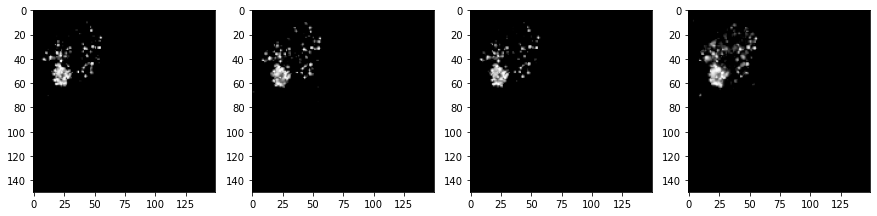


[Image] number 218 	Prediction: 0.7346411 	Category: OFQv69_w3
			Observed: 0.7272727272727273


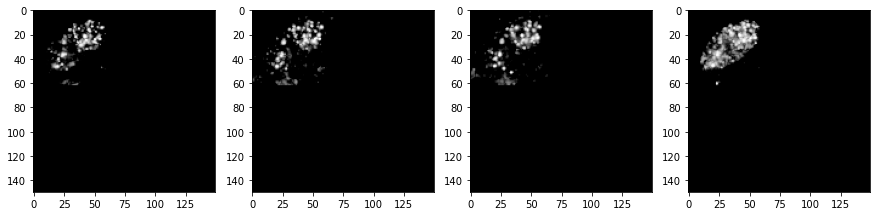


[Image] number 219 	Prediction: 0.73859864 	Category: shyam04_w4
			Observed: 0.8181818181818182


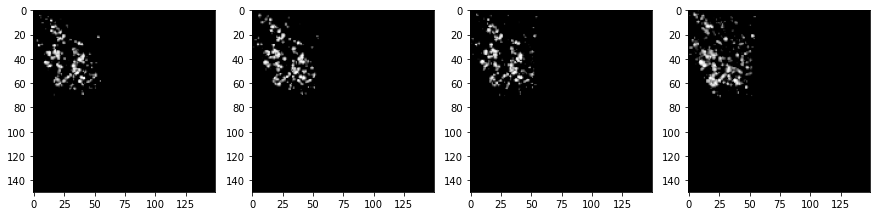


[Image] number 220 	Prediction: 0.7386532 	Category: OFQv65_w4
			Observed: 0.6818181818181818


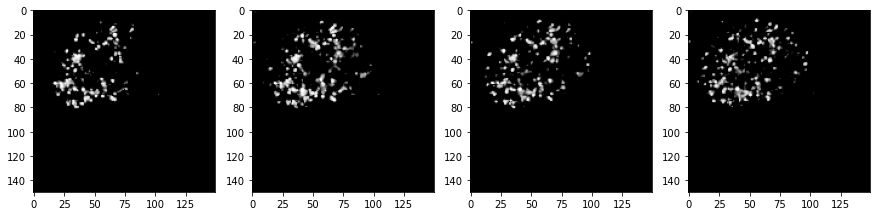


[Image] number 221 	Prediction: 0.7394869 	Category: OFQv61_w4
			Observed: 0.5606060606060606


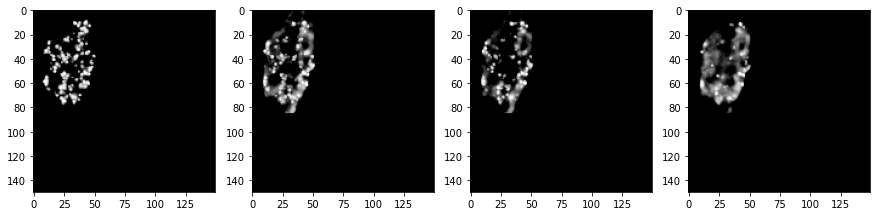


[Image] number 222 	Prediction: 0.7404799 	Category: OFQv69_w2
			Observed: 0.7878787878787878


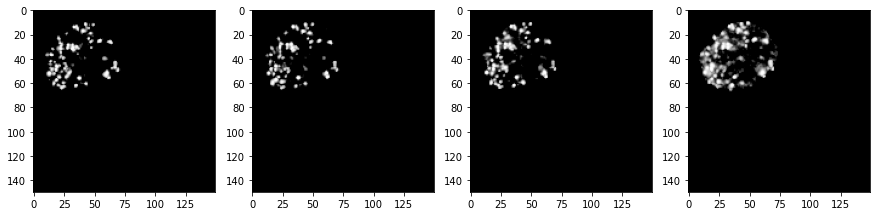


[Image] number 223 	Prediction: 0.74297476 	Category: shyam04_w2
			Observed: 0.6666666666666666


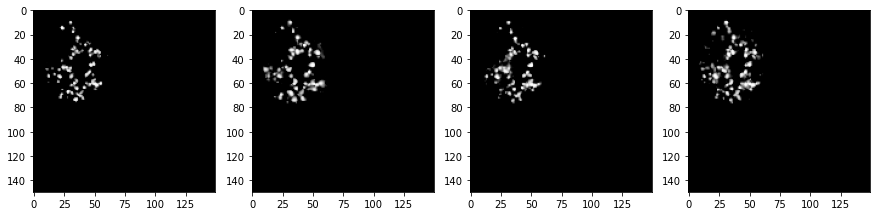


[Image] number 224 	Prediction: 0.74323153 	Category: OFQv61_w4
			Observed: 0.7272727272727273


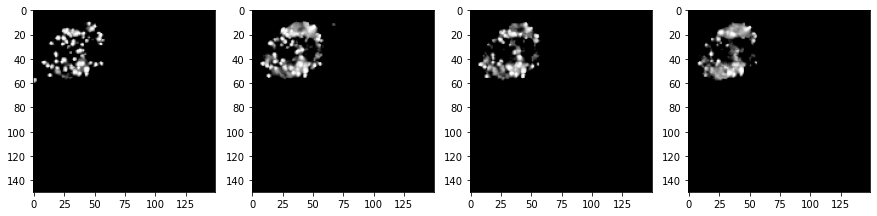


[Image] number 225 	Prediction: 0.7439523 	Category: shyam04_w5
			Observed: 0.696969696969697


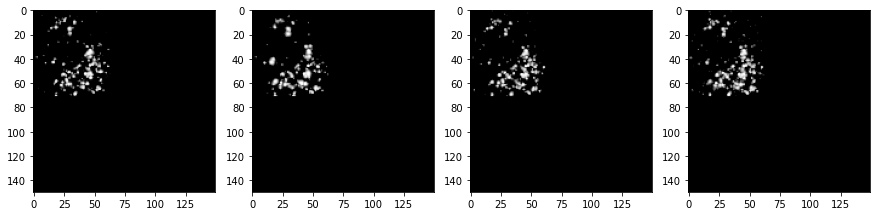


[Image] number 226 	Prediction: 0.74442464 	Category: shyam01_ch1
			Observed: 0.6818181818181818


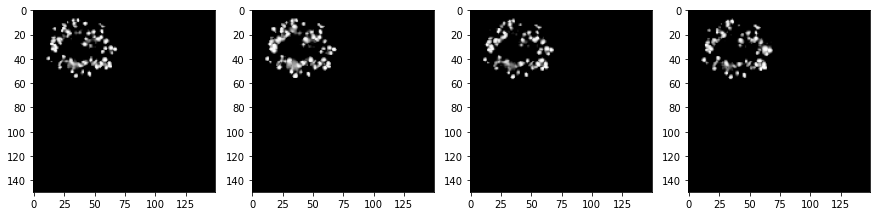


[Image] number 227 	Prediction: 0.7463362 	Category: OFQv69_w3
			Observed: 0.6666666666666666


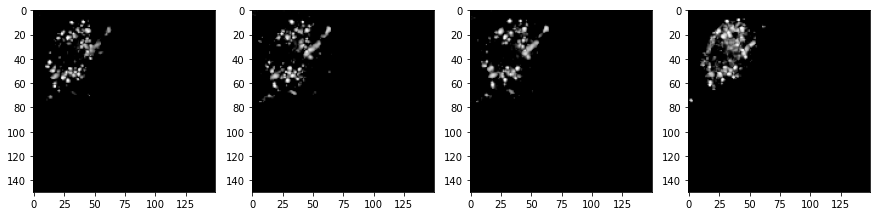


[Image] number 228 	Prediction: 0.7471697 	Category: shyam01_ch3
			Observed: 0.5606060606060606


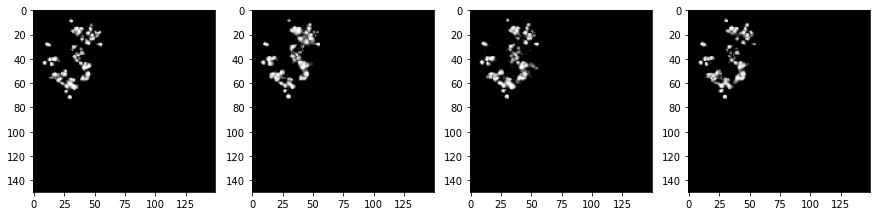


[Image] number 229 	Prediction: 0.7476311 	Category: shyam01_ch3
			Observed: 0.8636363636363636


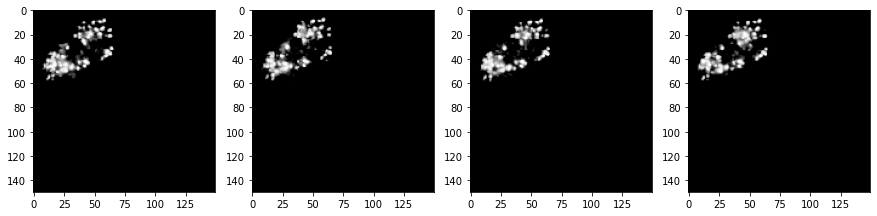


[Image] number 230 	Prediction: 0.74791914 	Category: shyam04_w5
			Observed: 0.8787878787878788


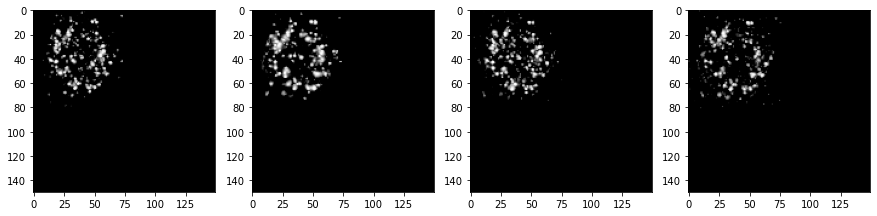


[Image] number 231 	Prediction: 0.748715 	Category: OFQv69_w4
			Observed: 0.6818181818181818


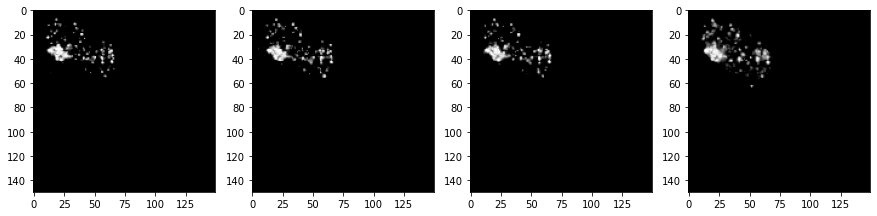


[Image] number 232 	Prediction: 0.75022554 	Category: OFQv65_w3
			Observed: 0.7272727272727273


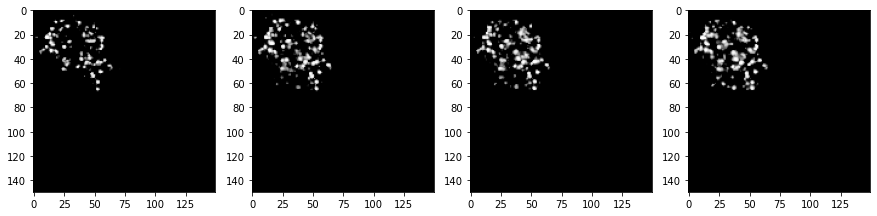


[Image] number 233 	Prediction: 0.7508182 	Category: OFQv69_w2
			Observed: 0.7878787878787878


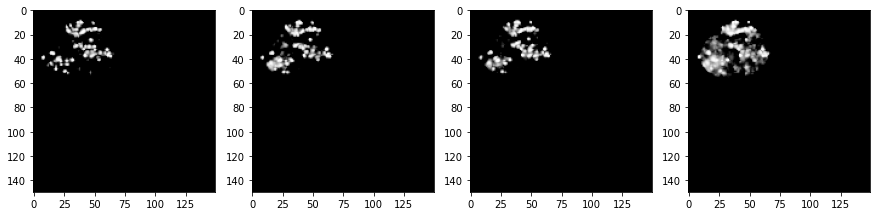


[Image] number 234 	Prediction: 0.7523731 	Category: OFQv67_w5
			Observed: 0.6818181818181818


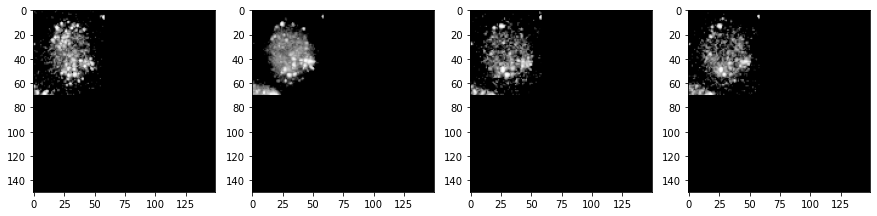


[Image] number 235 	Prediction: 0.7552395 	Category: OFQv61_w2
			Observed: 0.7272727272727273


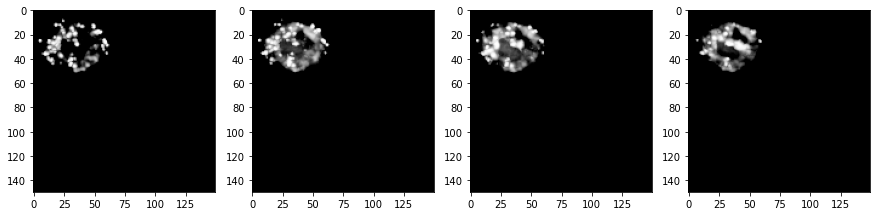


[Image] number 236 	Prediction: 0.755753 	Category: OFQv61_w4
			Observed: 0.7424242424242424


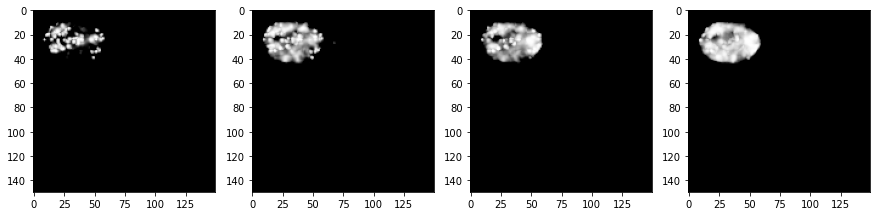


[Image] number 237 	Prediction: 0.7563309 	Category: OFQv65_w3
			Observed: 0.696969696969697


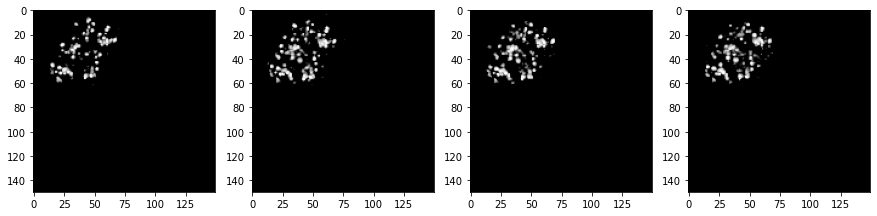


[Image] number 238 	Prediction: 0.7569508 	Category: shyam04_w5
			Observed: 0.8636363636363636


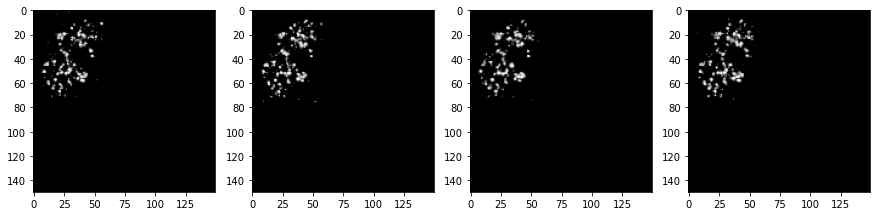


[Image] number 239 	Prediction: 0.75779796 	Category: OFQv69_w2
			Observed: 0.7272727272727273


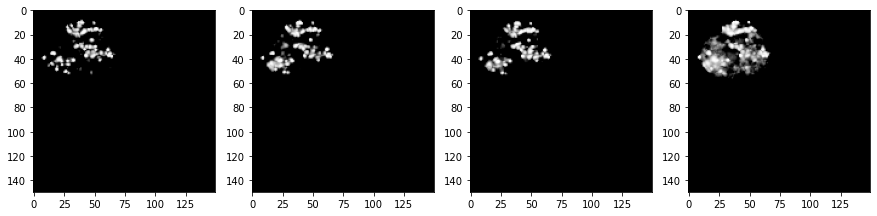


[Image] number 240 	Prediction: 0.7584472 	Category: OFQv65_w2
			Observed: 0.7272727272727273


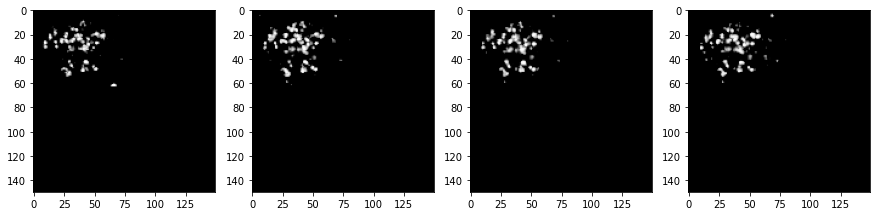


[Image] number 241 	Prediction: 0.7590458 	Category: OFQv69_w1
			Observed: 0.7575757575757576


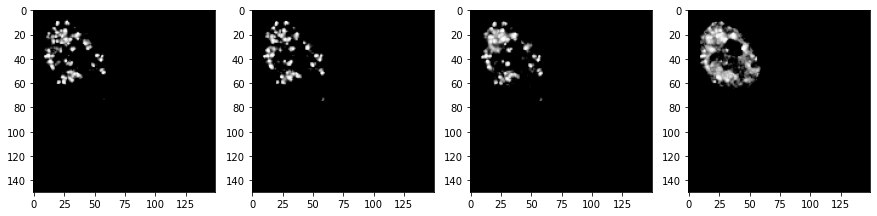


[Image] number 242 	Prediction: 0.7593055 	Category: OFQv69_w1
			Observed: 0.7272727272727273


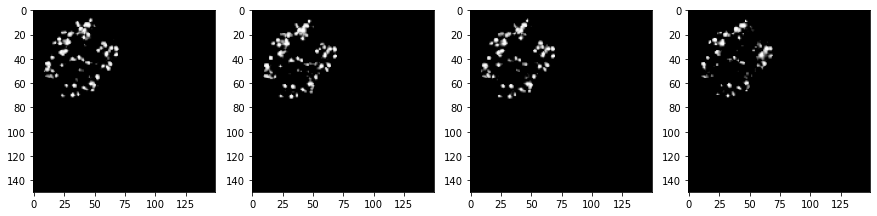


[Image] number 243 	Prediction: 0.759622 	Category: OFQv69_w4
			Observed: 0.7121212121212122


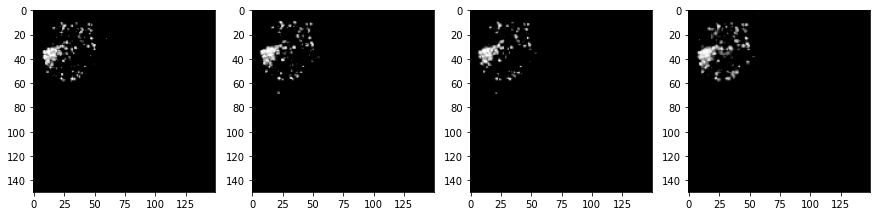


[Image] number 244 	Prediction: 0.75980836 	Category: OFQv68_w3
			Observed: 0.696969696969697


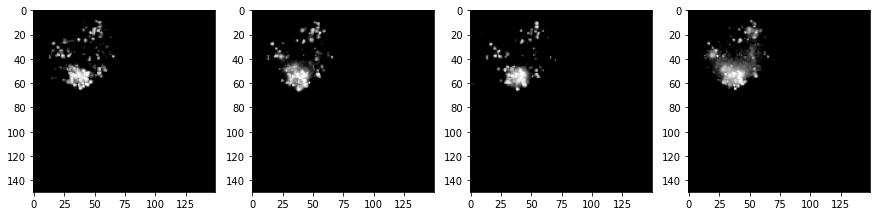


[Image] number 245 	Prediction: 0.7600064 	Category: OFQv68_w4
			Observed: 0.6818181818181818


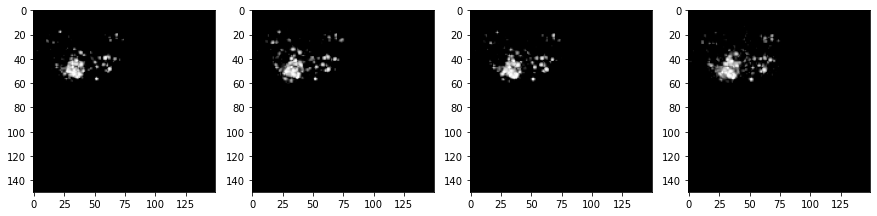


[Image] number 246 	Prediction: 0.7607383 	Category: OFQv69_w2
			Observed: 0.6818181818181818


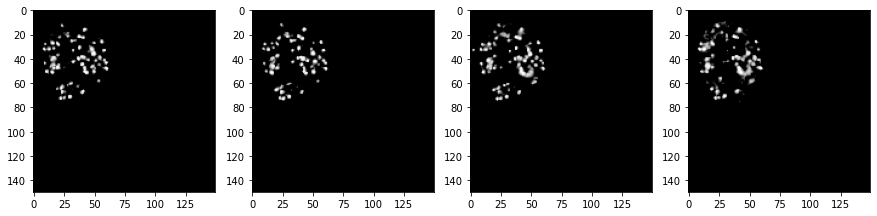


[Image] number 247 	Prediction: 0.76093376 	Category: OFQv69_w2
			Observed: 0.8484848484848485


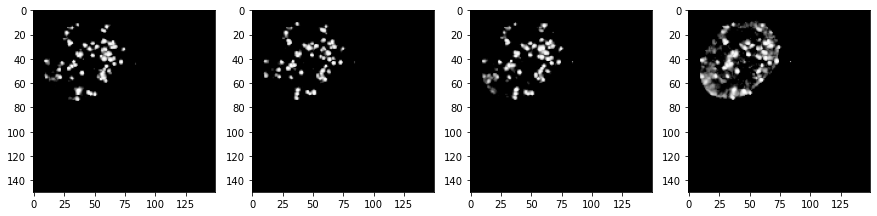


[Image] number 248 	Prediction: 0.7609884 	Category: OFQv69_w4
			Observed: 0.696969696969697


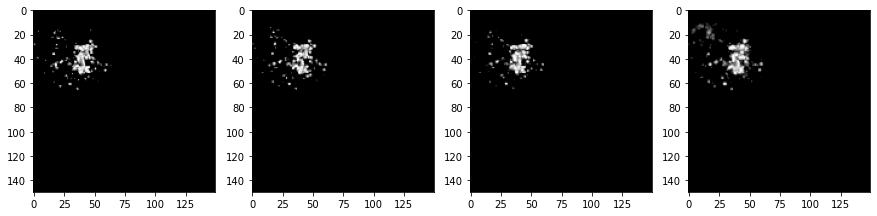


[Image] number 249 	Prediction: 0.7611218 	Category: shyam04_w1
			Observed: 0.6515151515151515


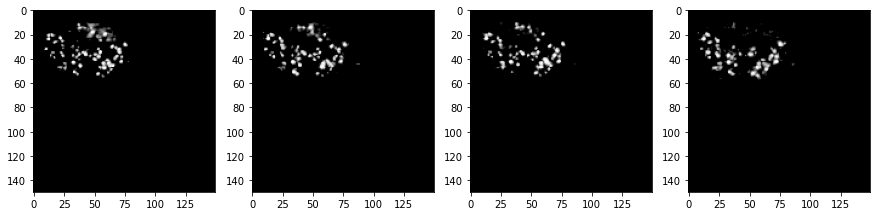


[Image] number 250 	Prediction: 0.76132834 	Category: shyam04_w1
			Observed: 0.7575757575757576


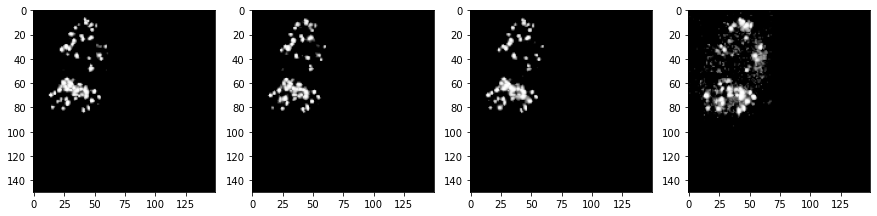


[Image] number 251 	Prediction: 0.76163214 	Category: shyam04_w1
			Observed: 0.6666666666666666


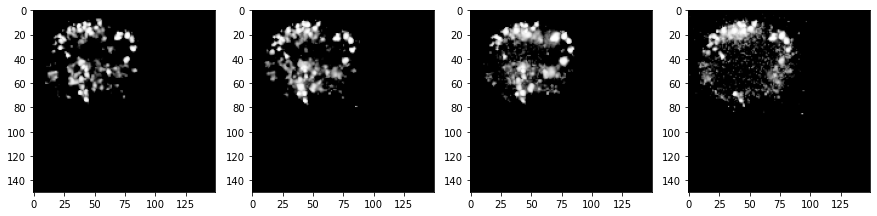


[Image] number 252 	Prediction: 0.7624092 	Category: OFQv61_w3
			Observed: 0.8939393939393939


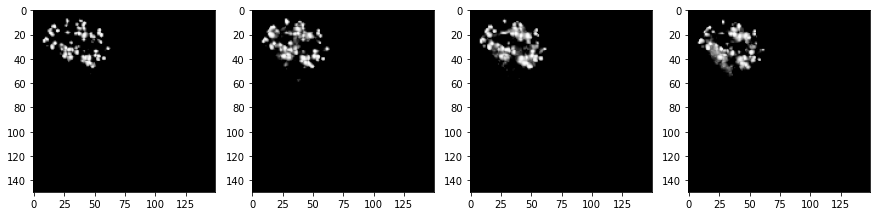


[Image] number 253 	Prediction: 0.76267016 	Category: OFQv69_w2
			Observed: 0.7424242424242424


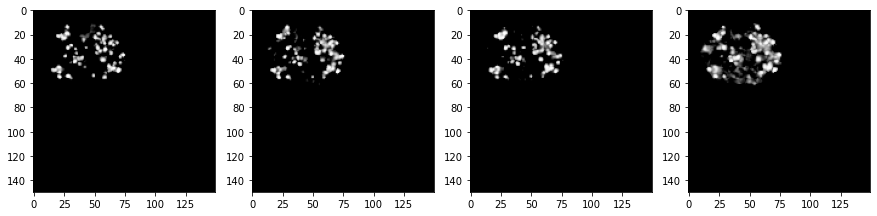


[Image] number 254 	Prediction: 0.7642991 	Category: OFQv69_w1
			Observed: 0.6060606060606061


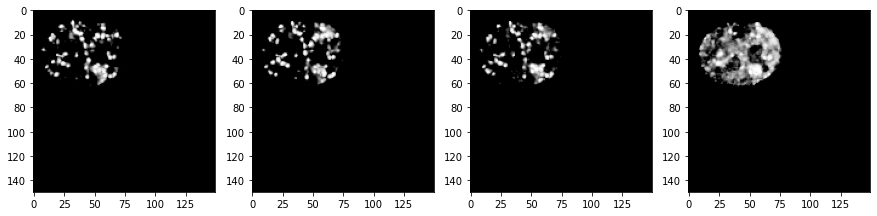


[Image] number 255 	Prediction: 0.7650299 	Category: OFQv68_w4
			Observed: 0.8484848484848485


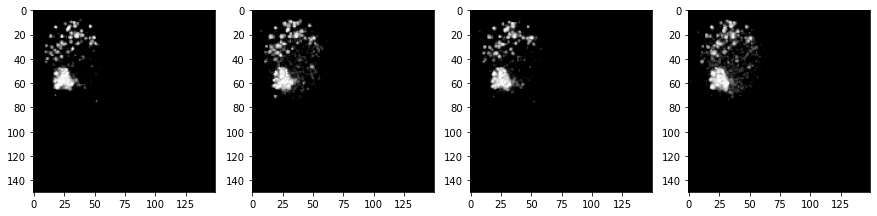


[Image] number 256 	Prediction: 0.76519895 	Category: OFQv69_w1
			Observed: 0.7878787878787878


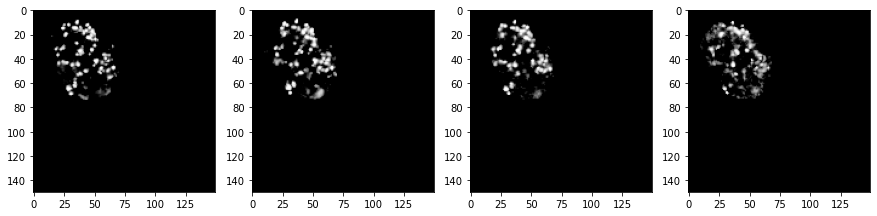


[Image] number 257 	Prediction: 0.7660145 	Category: OFQv69_w3
			Observed: 0.6818181818181818


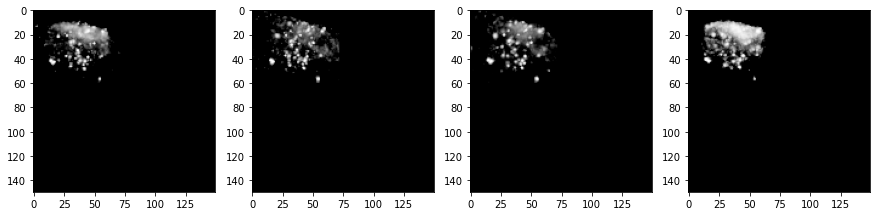


[Image] number 258 	Prediction: 0.76609594 	Category: OFQv67_w5
			Observed: 0.9242424242424242


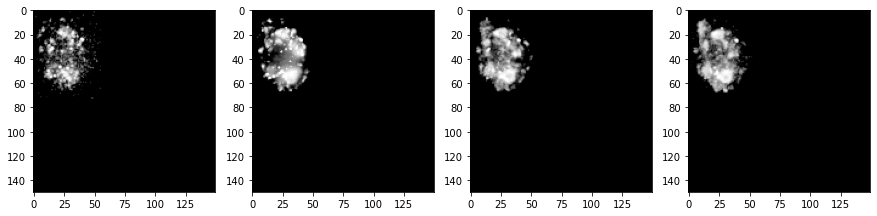


[Image] number 259 	Prediction: 0.7672128 	Category: OFQv67_w5
			Observed: 0.7424242424242424


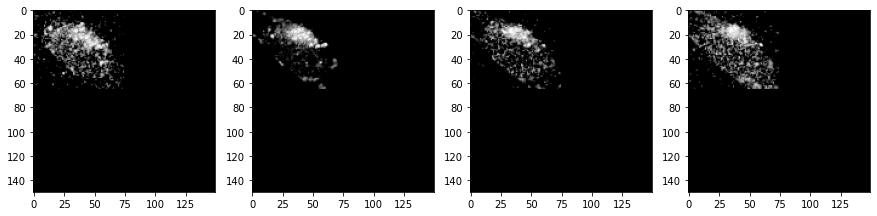


[Image] number 260 	Prediction: 0.76769906 	Category: OFQv68_w4
			Observed: 0.7575757575757576


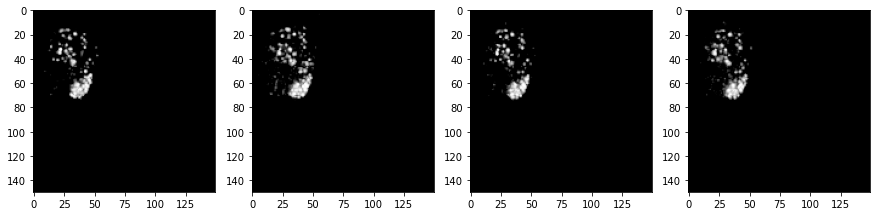


[Image] number 261 	Prediction: 0.768357 	Category: OFQv68_w4
			Observed: 0.5909090909090909


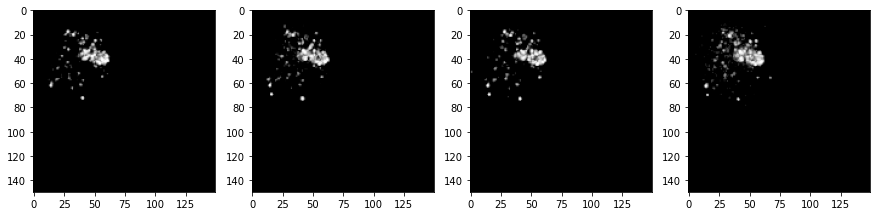


[Image] number 262 	Prediction: 0.769358 	Category: OFQv67_w4
			Observed: 0.7727272727272727


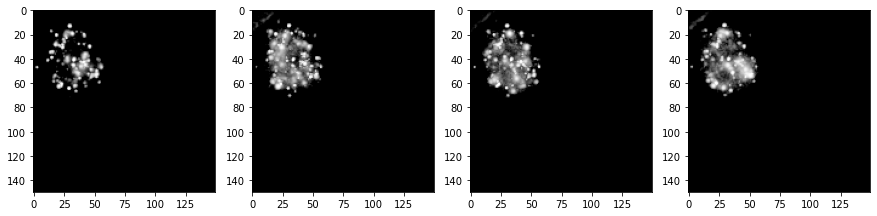


[Image] number 263 	Prediction: 0.76948303 	Category: OFQv69_w1
			Observed: 0.8181818181818182


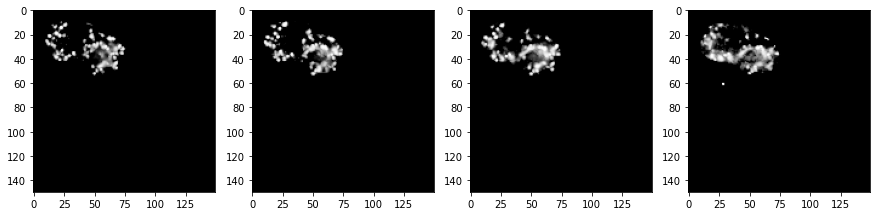


[Image] number 264 	Prediction: 0.7699202 	Category: OFQv69_w2
			Observed: 0.5454545454545454


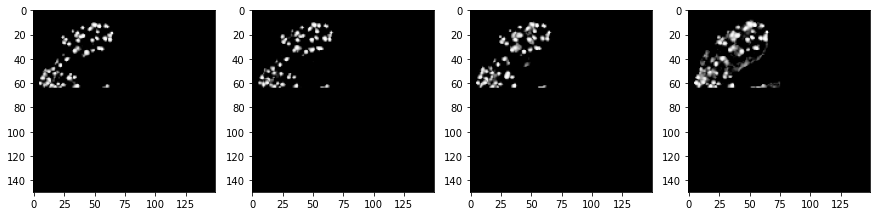


[Image] number 265 	Prediction: 0.770164 	Category: shyam01_ch2
			Observed: 0.7272727272727273


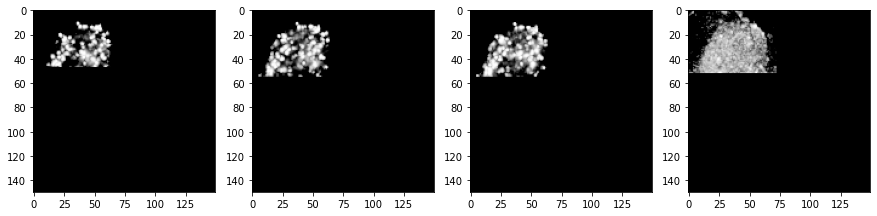


[Image] number 266 	Prediction: 0.7701704 	Category: OFQv69_w4
			Observed: 0.8636363636363636


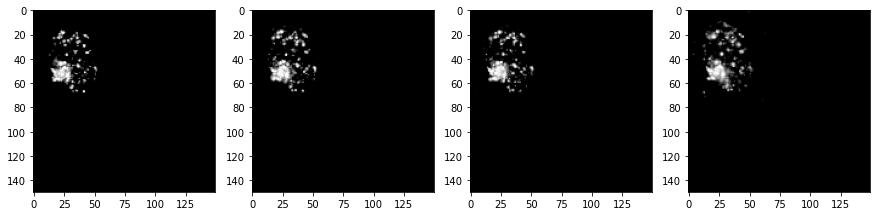


[Image] number 267 	Prediction: 0.7702997 	Category: OFQv69_w1
			Observed: 0.7272727272727273


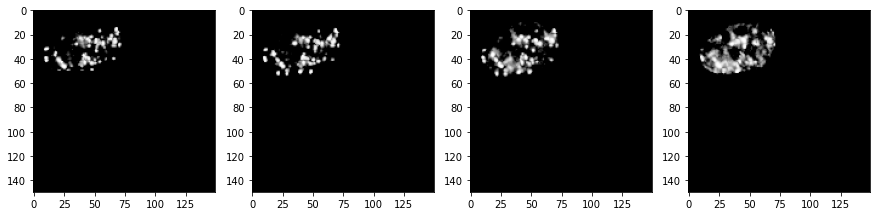


[Image] number 268 	Prediction: 0.7703529 	Category: shyam01_ch1
			Observed: 0.803030303030303


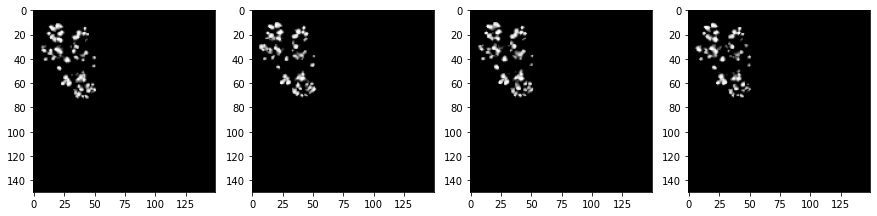


[Image] number 269 	Prediction: 0.77035356 	Category: OFQv65_w3
			Observed: 0.7424242424242424


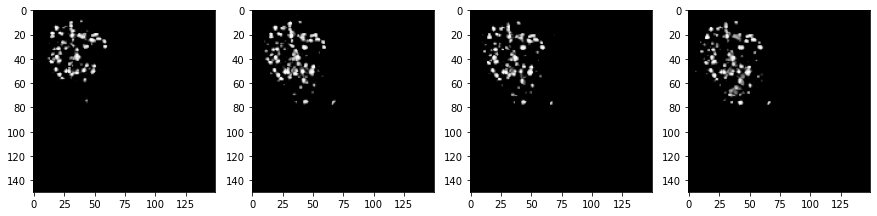


[Image] number 270 	Prediction: 0.77149254 	Category: OFQv67_w5
			Observed: 0.9242424242424242


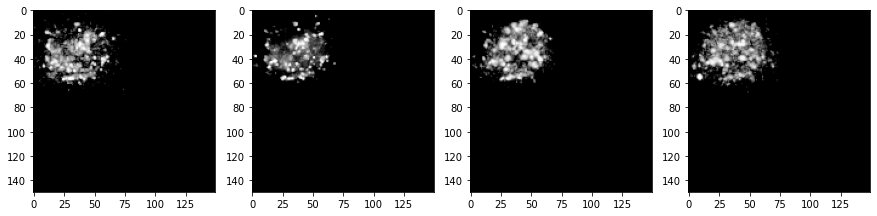


[Image] number 271 	Prediction: 0.77423793 	Category: OFQv69_w1
			Observed: 0.7424242424242424


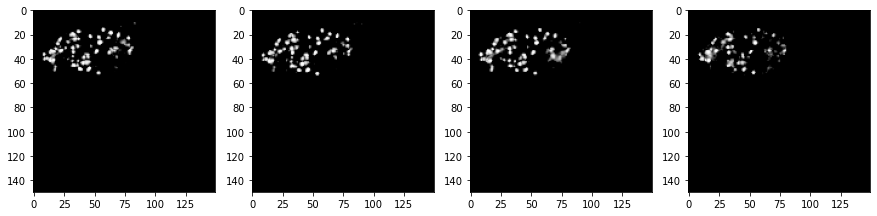


[Image] number 272 	Prediction: 0.774485 	Category: shyam04_w4
			Observed: 0.7121212121212122


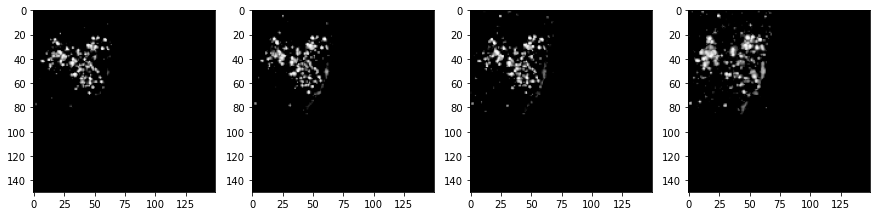


[Image] number 273 	Prediction: 0.77654713 	Category: OFQv61_w2
			Observed: 0.7575757575757576


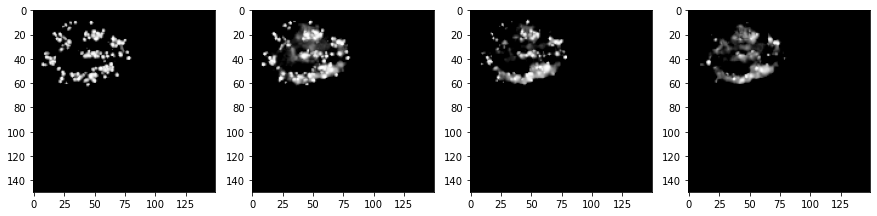


[Image] number 274 	Prediction: 0.7767677 	Category: OFQv65_w3
			Observed: 0.6060606060606061


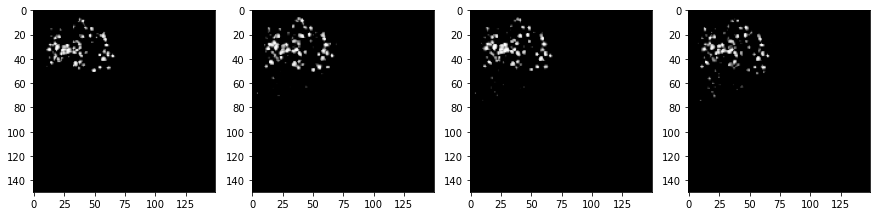


[Image] number 275 	Prediction: 0.7772191 	Category: OFQv69_w3
			Observed: 0.8181818181818182


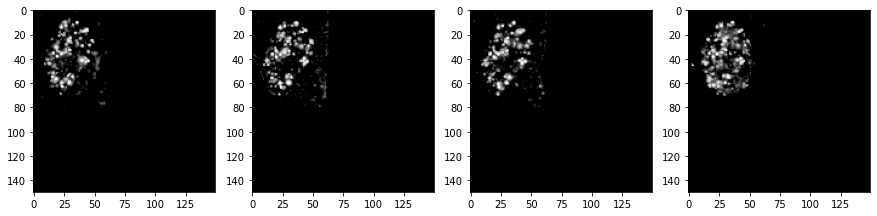


[Image] number 276 	Prediction: 0.7798001 	Category: shyam04_w4
			Observed: 0.8181818181818182


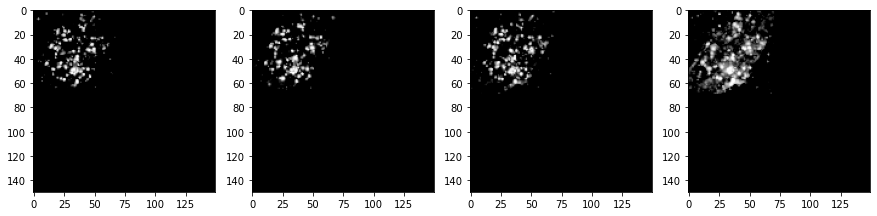


[Image] number 277 	Prediction: 0.78131306 	Category: shyam04_w1
			Observed: 0.7424242424242424


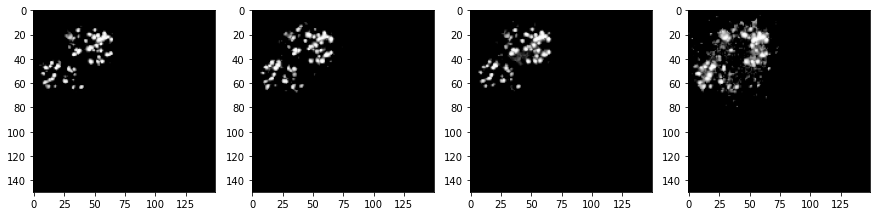


[Image] number 278 	Prediction: 0.78327274 	Category: OFQv68_w4
			Observed: 0.7575757575757576


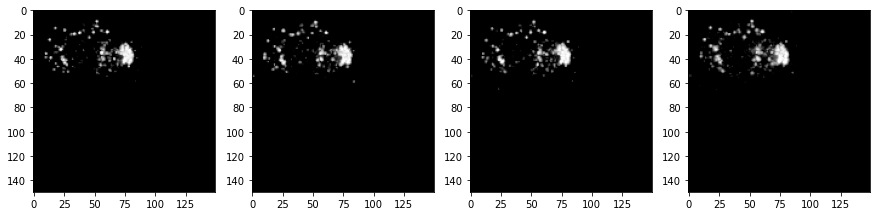


[Image] number 279 	Prediction: 0.7849158 	Category: OFQv61_w3
			Observed: 0.7575757575757576


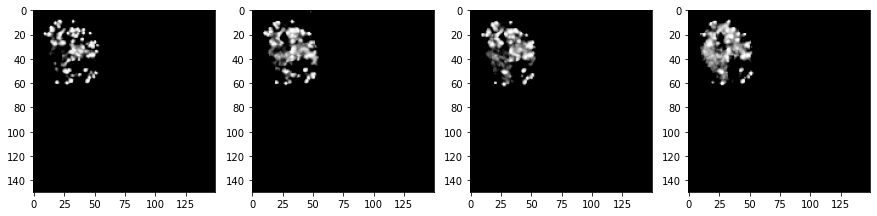


[Image] number 280 	Prediction: 0.78576094 	Category: shyam04_w1
			Observed: 0.5606060606060606


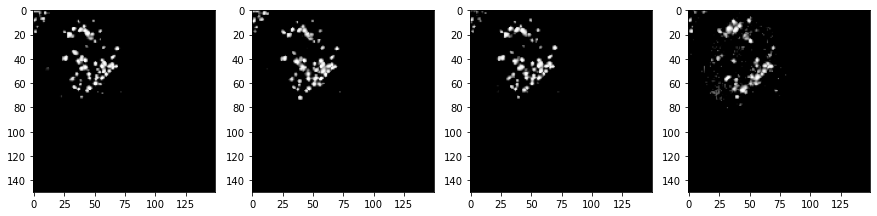


[Image] number 281 	Prediction: 0.7877202 	Category: OFQv69_w4
			Observed: 0.8939393939393939


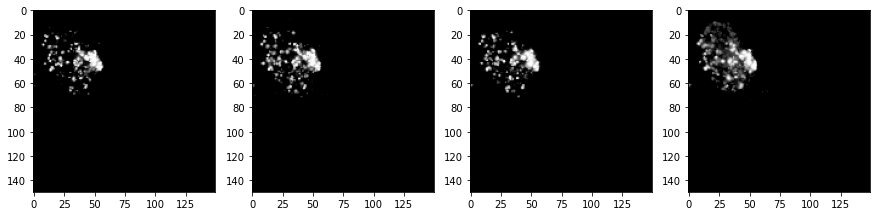


[Image] number 282 	Prediction: 0.7877886 	Category: OFQv69_w2
			Observed: 0.7878787878787878


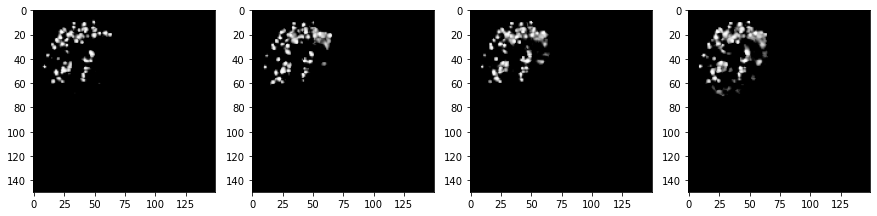


[Image] number 283 	Prediction: 0.7885827 	Category: shyam04_w4
			Observed: 0.8333333333333334


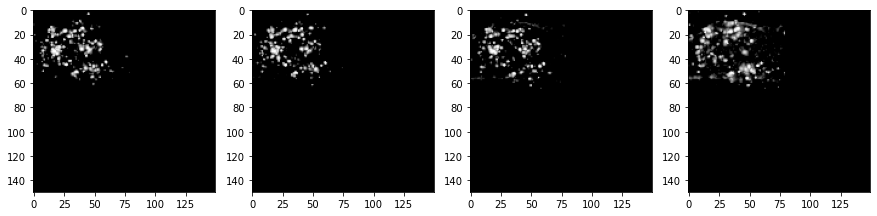


[Image] number 284 	Prediction: 0.7894627 	Category: shyam04_w5
			Observed: 0.8787878787878788


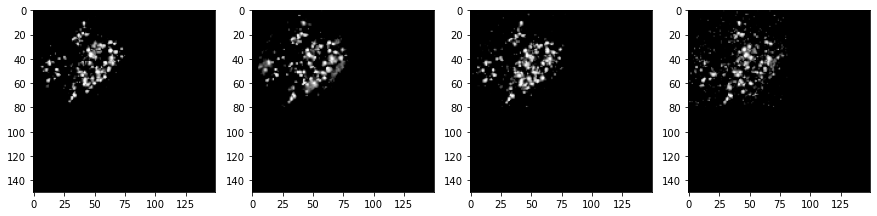


[Image] number 285 	Prediction: 0.7902013 	Category: shyam04_w2
			Observed: 0.7878787878787878


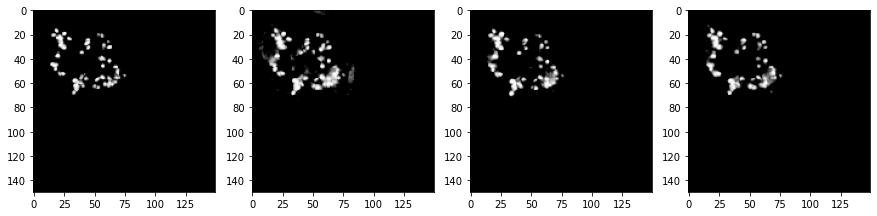


[Image] number 286 	Prediction: 0.7912836 	Category: OFQv69_w4
			Observed: 0.7272727272727273


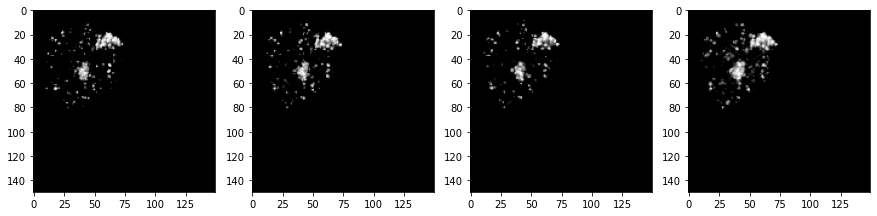


[Image] number 287 	Prediction: 0.79134566 	Category: shyam04_w4
			Observed: 0.7272727272727273


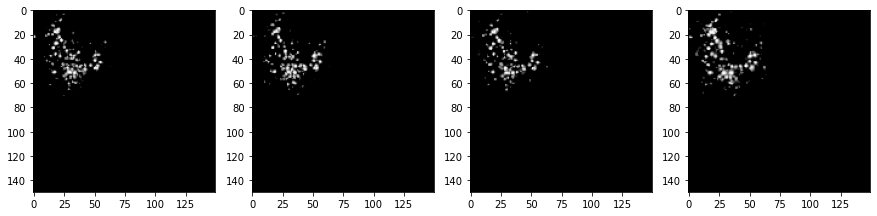


[Image] number 288 	Prediction: 0.79595155 	Category: shyam01_ch1
			Observed: 0.8787878787878788


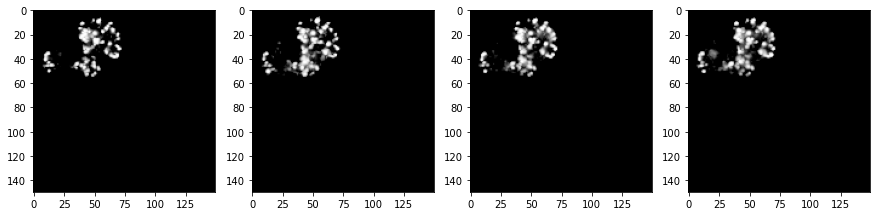


[Image] number 289 	Prediction: 0.7969712 	Category: OFQv69_w3
			Observed: 0.8484848484848485


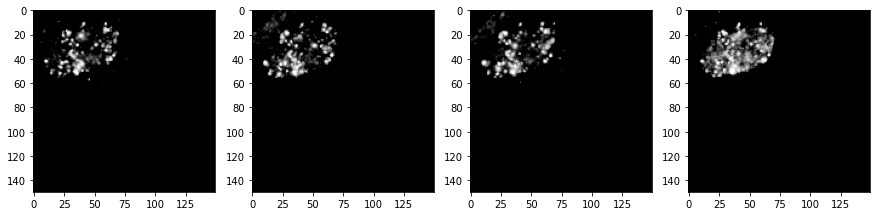


[Image] number 290 	Prediction: 0.7997347 	Category: OFQv67_w4
			Observed: 0.7727272727272727


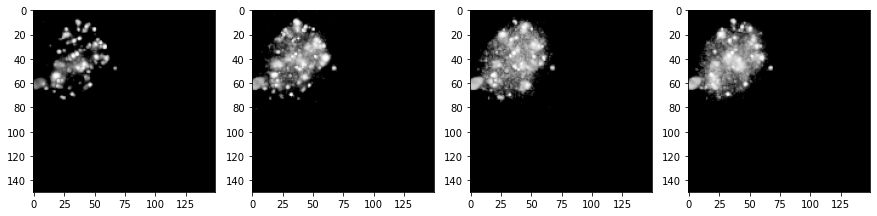


[Image] number 291 	Prediction: 0.8013736 	Category: OFQv67_w4
			Observed: 0.7727272727272727


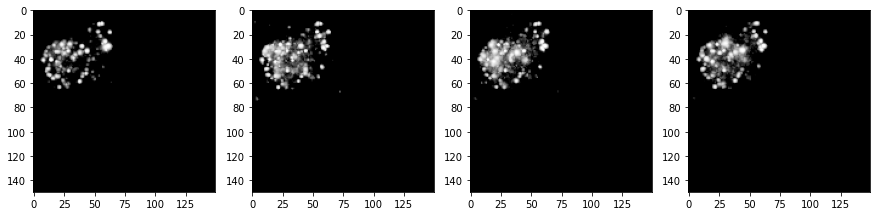


[Image] number 292 	Prediction: 0.80367464 	Category: shyam01_ch2
			Observed: 0.8181818181818182


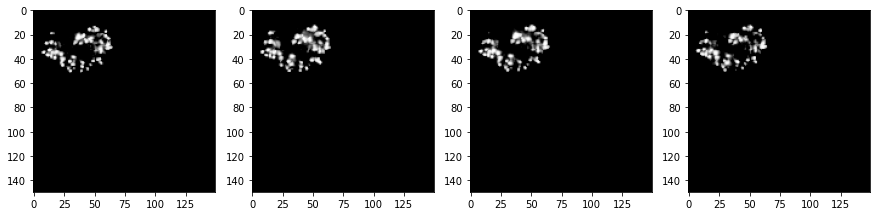


[Image] number 293 	Prediction: 0.8052243 	Category: shyam04_w5
			Observed: 0.5303030303030303


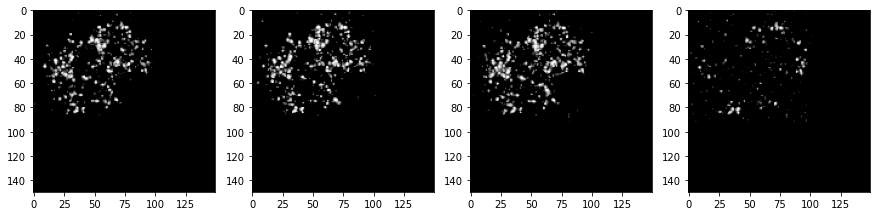


[Image] number 294 	Prediction: 0.805735 	Category: OFQv68_w3
			Observed: 0.803030303030303


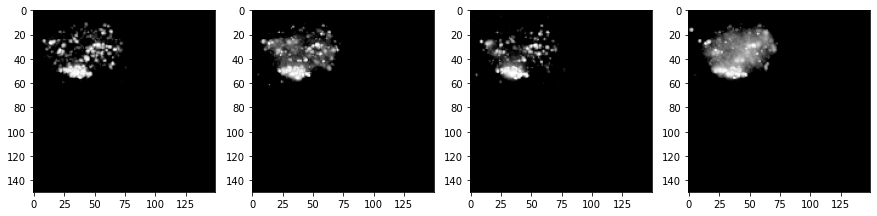


[Image] number 295 	Prediction: 0.8068676 	Category: shyam01_ch5
			Observed: 0.8939393939393939


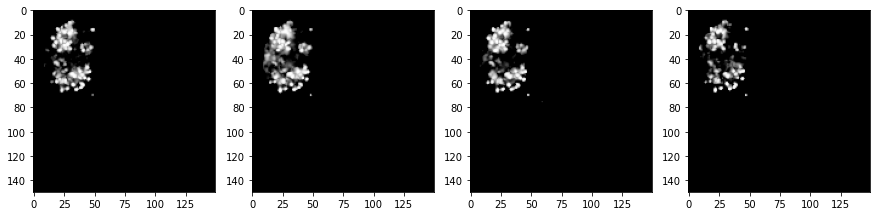


[Image] number 296 	Prediction: 0.8083596 	Category: shyam04_w4
			Observed: 0.9090909090909091


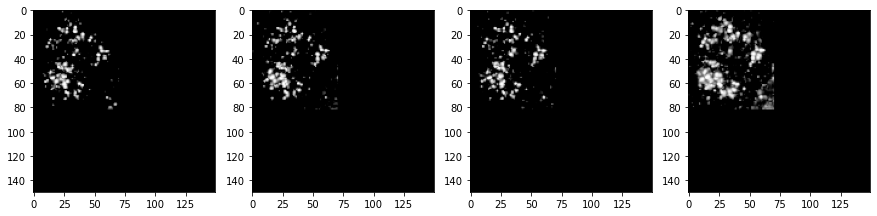


[Image] number 297 	Prediction: 0.8090989 	Category: shyam04_w2
			Observed: 0.7121212121212122


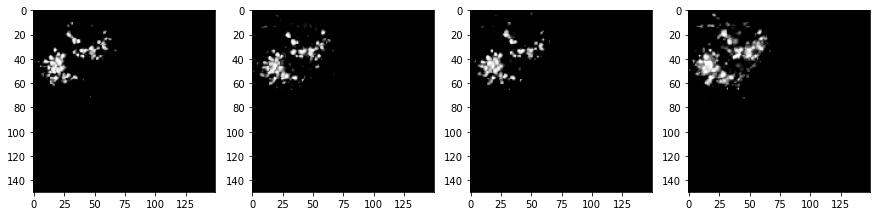


[Image] number 298 	Prediction: 0.8098963 	Category: shyam01_ch3
			Observed: 0.7727272727272727


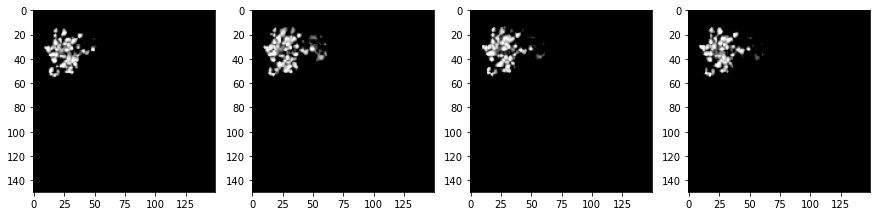


[Image] number 299 	Prediction: 0.8115363 	Category: shyam01_ch5
			Observed: 0.8181818181818182


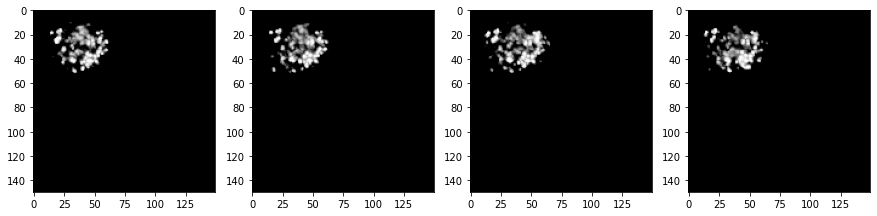


[Image] number 300 	Prediction: 0.8126929 	Category: shyam04_w4
			Observed: 0.8636363636363636


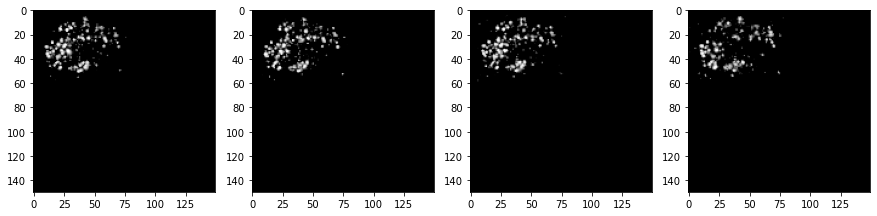


[Image] number 301 	Prediction: 0.81410736 	Category: shyam04_w5
			Observed: 0.9696969696969697


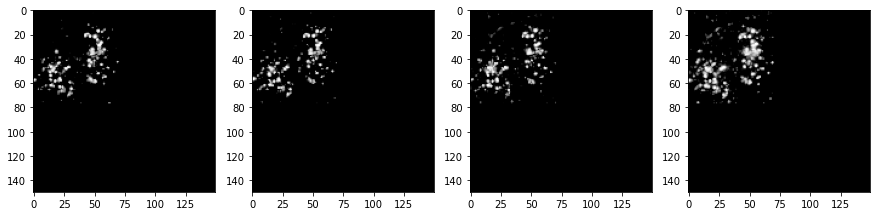


[Image] number 302 	Prediction: 0.81568885 	Category: shyam04_w5
			Observed: 0.6818181818181818


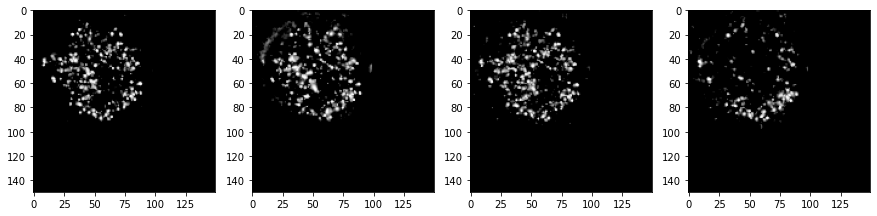


[Image] number 303 	Prediction: 0.81787306 	Category: OFQv69_w4
			Observed: 0.8636363636363636


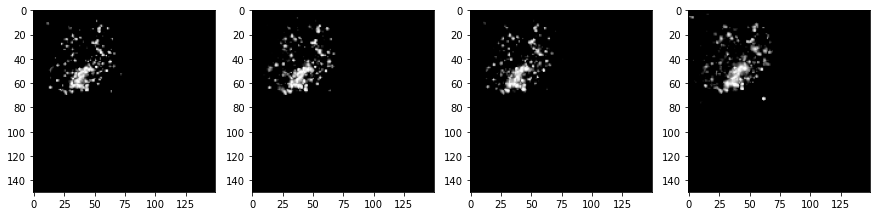


[Image] number 304 	Prediction: 0.8186396 	Category: OFQv69_w3
			Observed: 0.9242424242424242


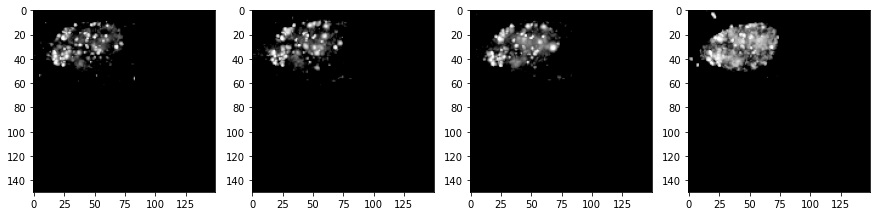


[Image] number 305 	Prediction: 0.81993896 	Category: shyam01_ch2
			Observed: 0.7575757575757576


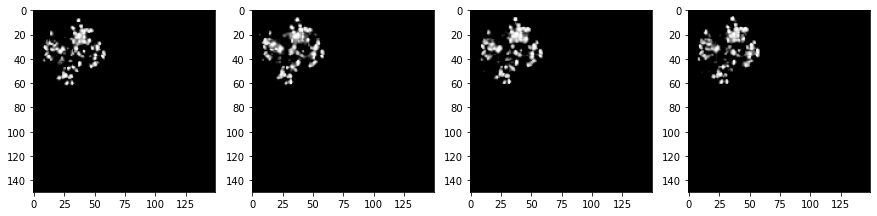


[Image] number 306 	Prediction: 0.82387054 	Category: OFQv65_w3
			Observed: 0.7878787878787878


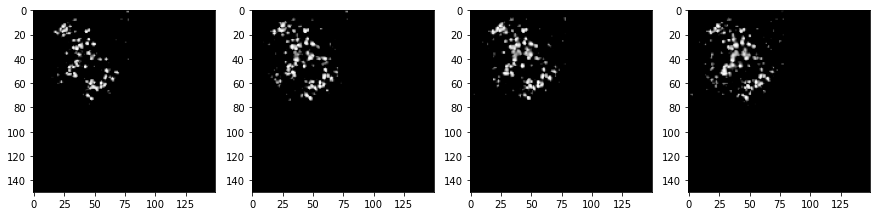


[Image] number 307 	Prediction: 0.826114 	Category: OFQv69_w4
			Observed: 0.7878787878787878


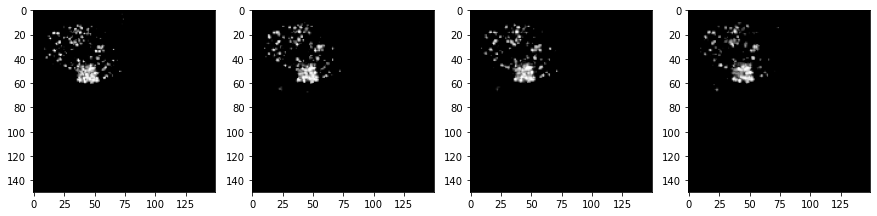


[Image] number 308 	Prediction: 0.827493 	Category: OFQv69_w1
			Observed: 0.7878787878787878


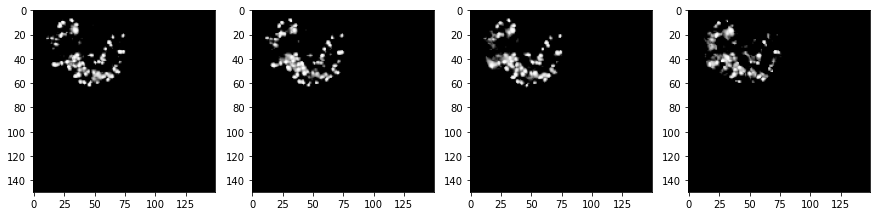


[Image] number 309 	Prediction: 0.82803065 	Category: OFQv68_w3
			Observed: 0.7878787878787878


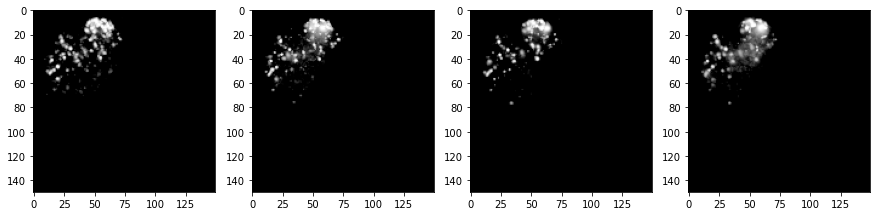


[Image] number 310 	Prediction: 0.830389 	Category: shyam04_w4
			Observed: 0.7727272727272727


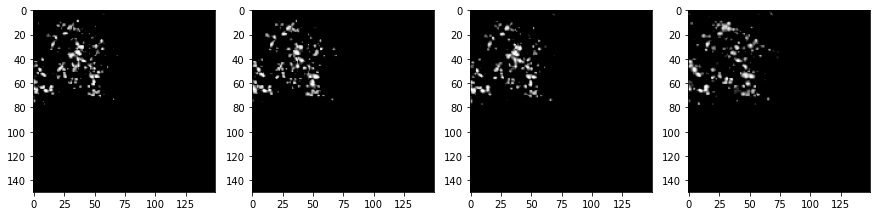


[Image] number 311 	Prediction: 0.8330674 	Category: OFQv61_w2
			Observed: 0.8333333333333334


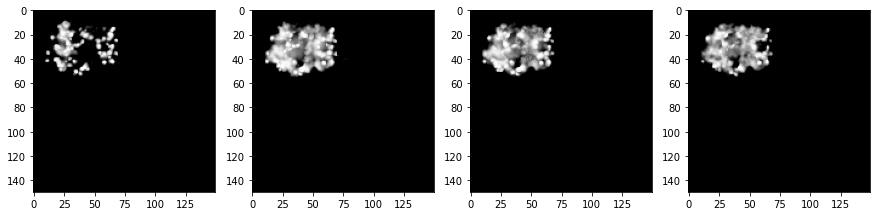


[Image] number 312 	Prediction: 0.834532 	Category: shyam01_ch3
			Observed: 0.8333333333333334


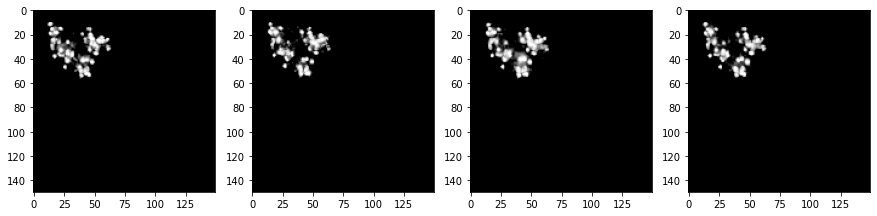


[Image] number 313 	Prediction: 0.8365538 	Category: OFQv69_w4
			Observed: 0.7121212121212122


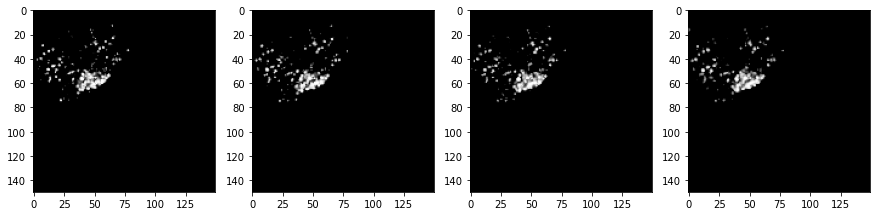


[Image] number 314 	Prediction: 0.83786774 	Category: OFQv67_w5
			Observed: 0.8636363636363636


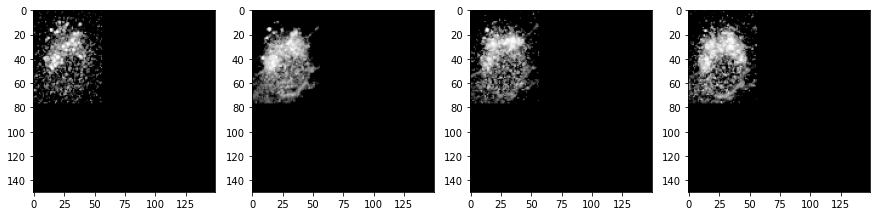


[Image] number 315 	Prediction: 0.8385568 	Category: OFQv67_w3
			Observed: 0.8636363636363636


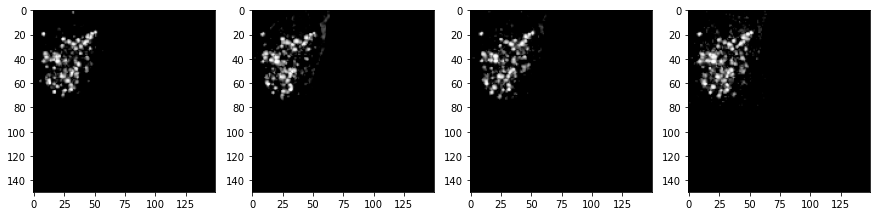


[Image] number 316 	Prediction: 0.83861893 	Category: OFQv69_w3
			Observed: 0.7727272727272727


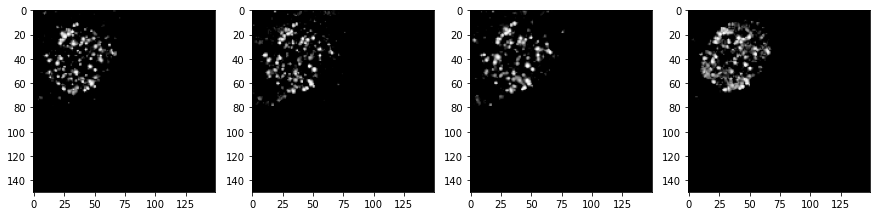


[Image] number 317 	Prediction: 0.8402509 	Category: shyam04_w4
			Observed: 0.6212121212121212


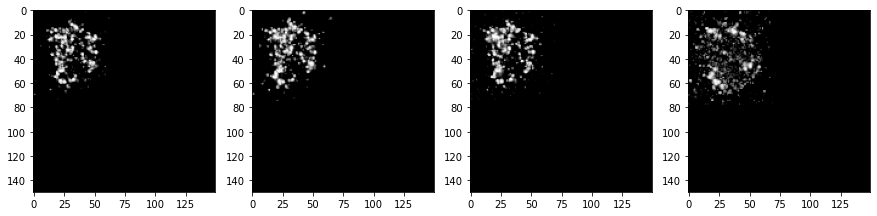


[Image] number 318 	Prediction: 0.8407915 	Category: OFQv69_w3
			Observed: 0.803030303030303


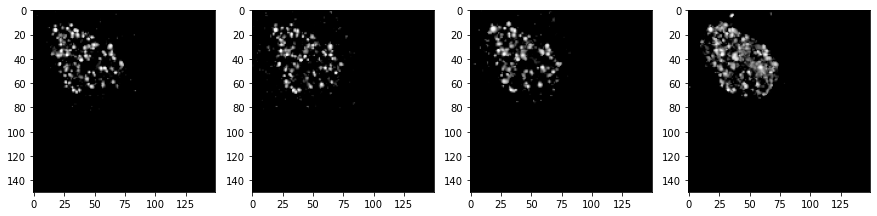


[Image] number 319 	Prediction: 0.8426118 	Category: OFQv69_w4
			Observed: 0.7121212121212122


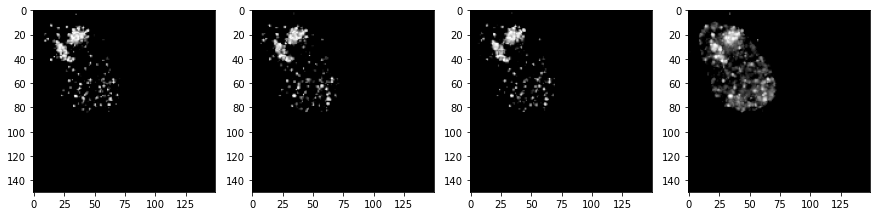


[Image] number 320 	Prediction: 0.84261644 	Category: OFQv69_w4
			Observed: 0.7575757575757576


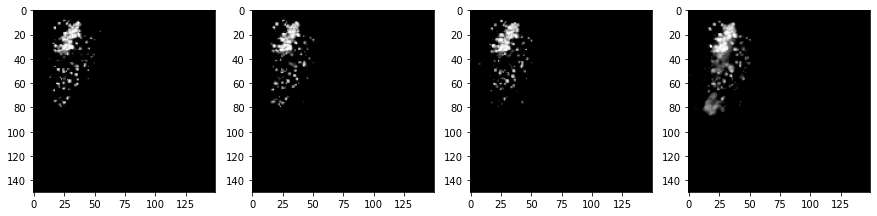


[Image] number 321 	Prediction: 0.8460411 	Category: shyam04_w5
			Observed: 0.8181818181818182


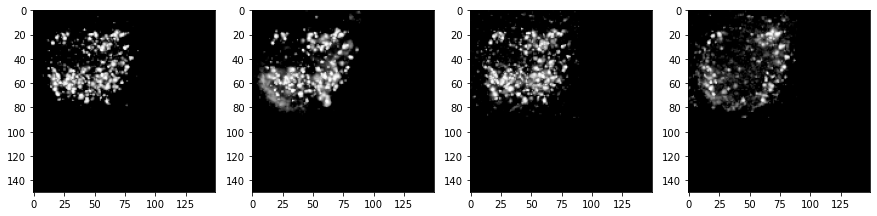


[Image] number 322 	Prediction: 0.84623563 	Category: shyam04_w4
			Observed: 0.7424242424242424


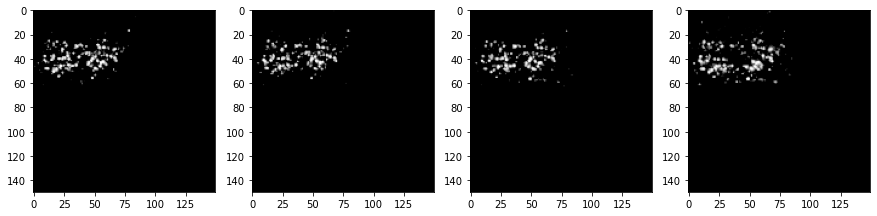


[Image] number 323 	Prediction: 0.8486889 	Category: shyam04_w5
			Observed: 0.9090909090909091


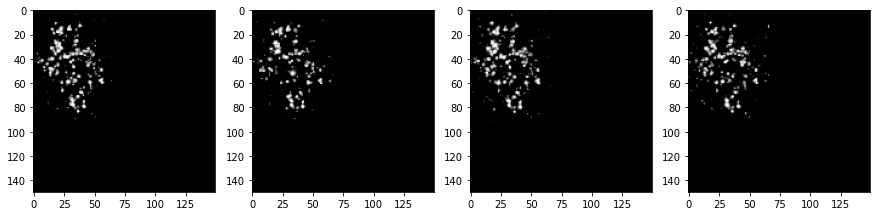


[Image] number 324 	Prediction: 0.8497765 	Category: OFQv69_w3
			Observed: 0.8484848484848485


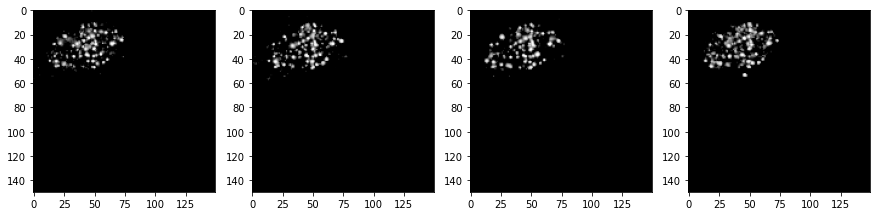


[Image] number 325 	Prediction: 0.8519076 	Category: shyam01_ch1
			Observed: 0.7878787878787878


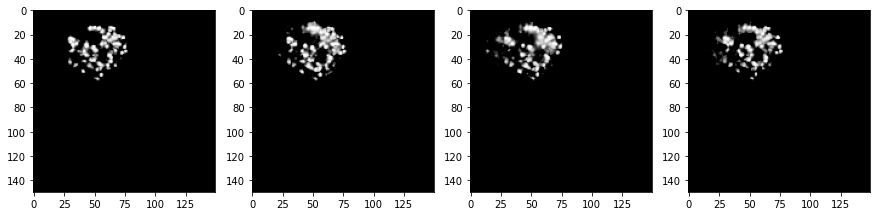


[Image] number 326 	Prediction: 0.85263306 	Category: OFQv67_w4
			Observed: 0.7878787878787878


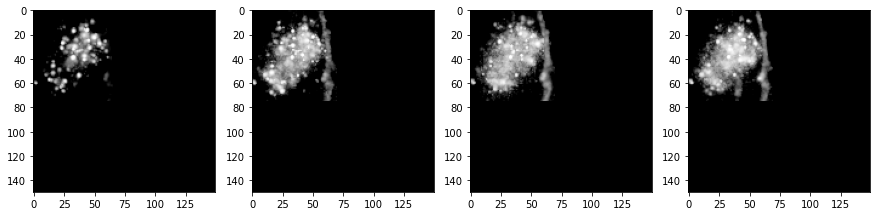


[Image] number 327 	Prediction: 0.85307574 	Category: shyam04_w5
			Observed: 0.8939393939393939


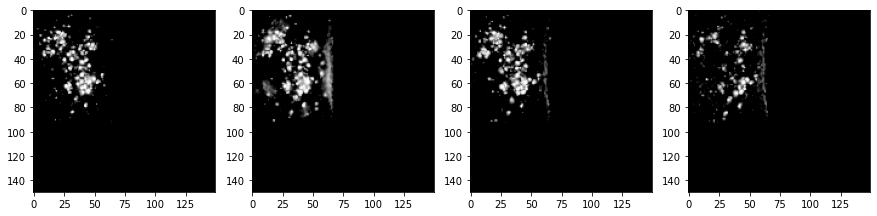


[Image] number 328 	Prediction: 0.8535733 	Category: OFQv69_w4
			Observed: 0.9242424242424242


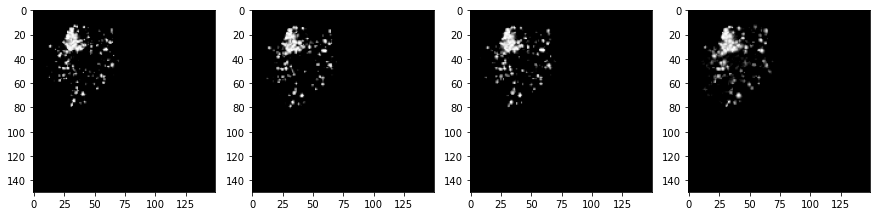


[Image] number 329 	Prediction: 0.8537467 	Category: shyam04_w5
			Observed: 0.8636363636363636


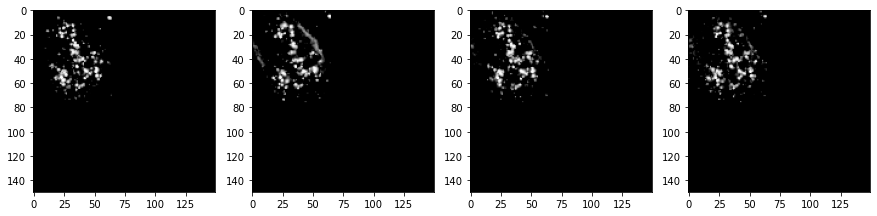


[Image] number 330 	Prediction: 0.855909 	Category: shyam04_w4
			Observed: 0.9090909090909091


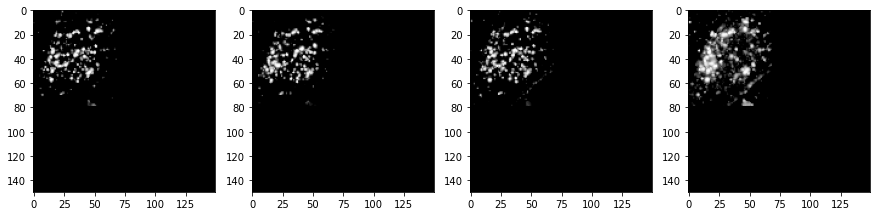


[Image] number 331 	Prediction: 0.8564839 	Category: shyam04_w5
			Observed: 0.8636363636363636


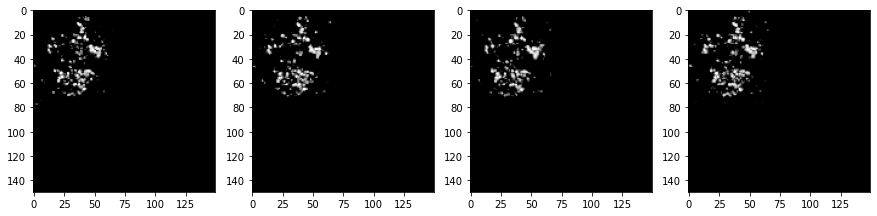


[Image] number 332 	Prediction: 0.8573869 	Category: OFQv69_w3
			Observed: 0.8484848484848485


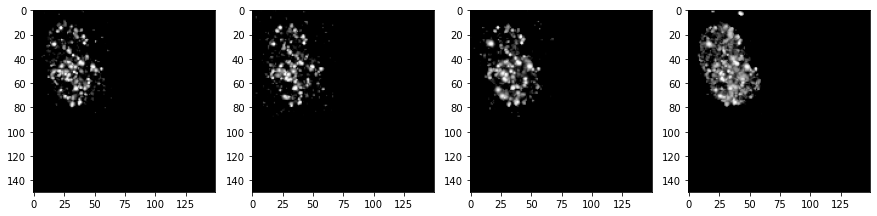


[Image] number 333 	Prediction: 0.85849017 	Category: shyam04_w4
			Observed: 0.8787878787878788


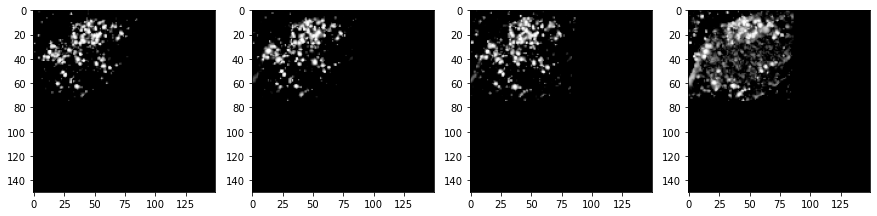


[Image] number 334 	Prediction: 0.8586559 	Category: OFQv69_w4
			Observed: 0.8484848484848485


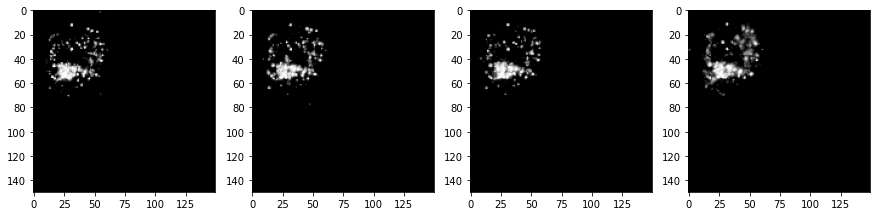


[Image] number 335 	Prediction: 0.8595203 	Category: OFQv67_w3
			Observed: 0.8484848484848485


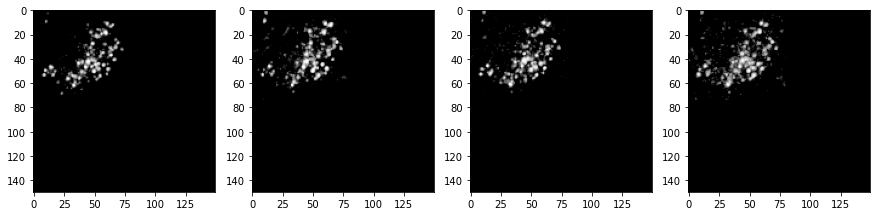


[Image] number 336 	Prediction: 0.85975325 	Category: shyam04_w5
			Observed: 0.9090909090909091


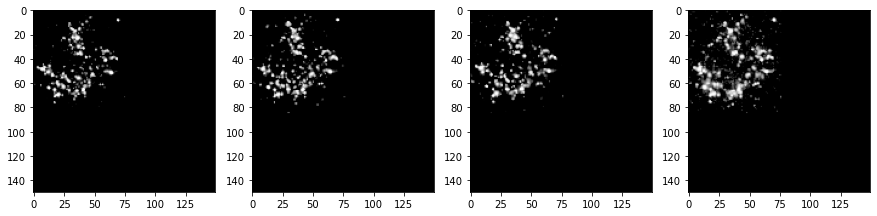


[Image] number 337 	Prediction: 0.86051416 	Category: OFQv69_w3
			Observed: 0.7424242424242424


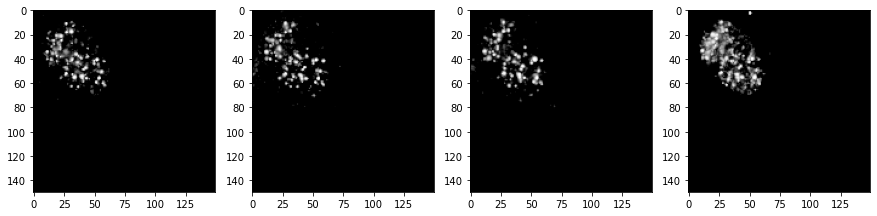


[Image] number 338 	Prediction: 0.86245894 	Category: OFQv67_w5
			Observed: 0.6212121212121212


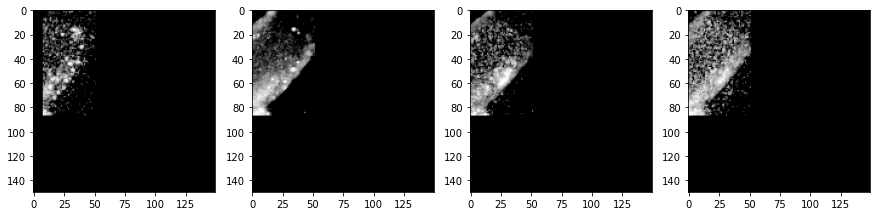


[Image] number 339 	Prediction: 0.86301875 	Category: shyam04_w5
			Observed: 0.9393939393939394


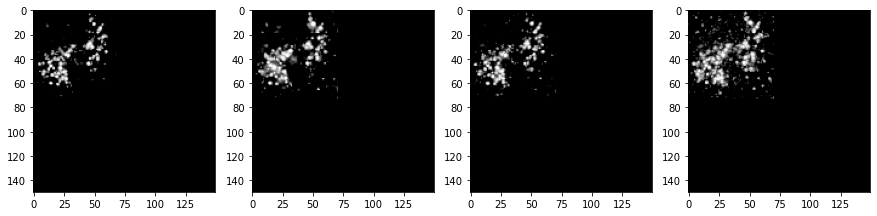


[Image] number 340 	Prediction: 0.8633802 	Category: OFQv69_w3
			Observed: 0.8787878787878788


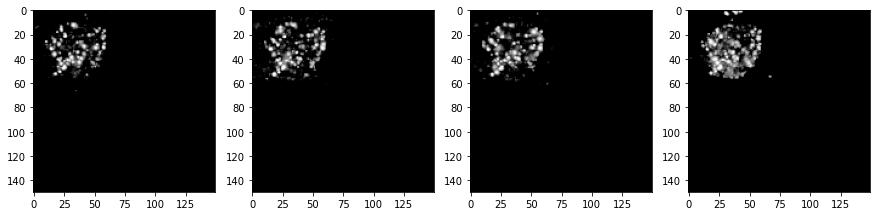


[Image] number 341 	Prediction: 0.86429954 	Category: OFQv69_w4
			Observed: 0.8787878787878788


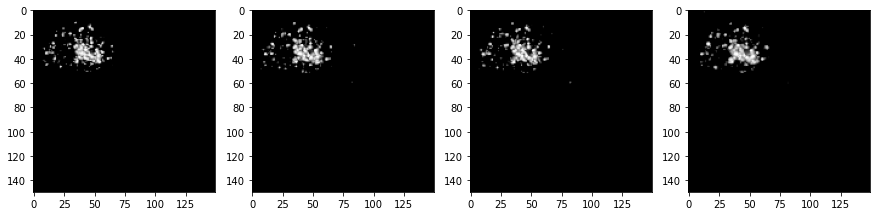


[Image] number 342 	Prediction: 0.8644165 	Category: shyam04_w5
			Observed: 0.803030303030303


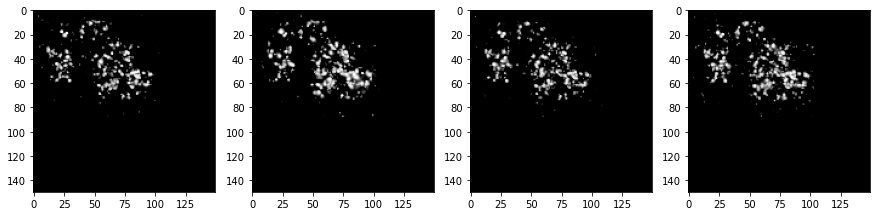


[Image] number 343 	Prediction: 0.86631376 	Category: shyam04_w5
			Observed: 0.7878787878787878


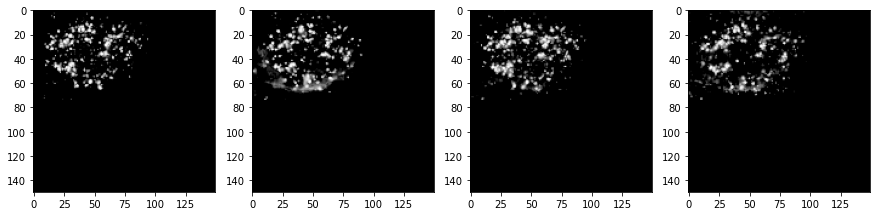


[Image] number 344 	Prediction: 0.8667024 	Category: shyam01_ch1
			Observed: 0.8636363636363636


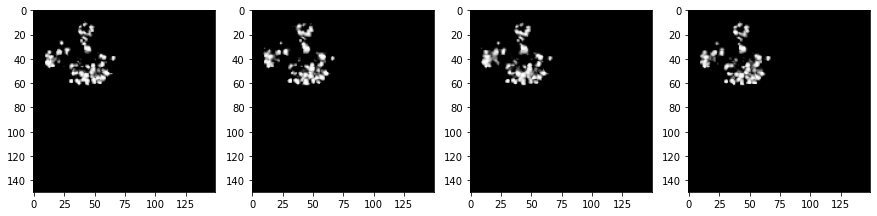


[Image] number 345 	Prediction: 0.8675915 	Category: shyam04_w5
			Observed: 0.9242424242424242


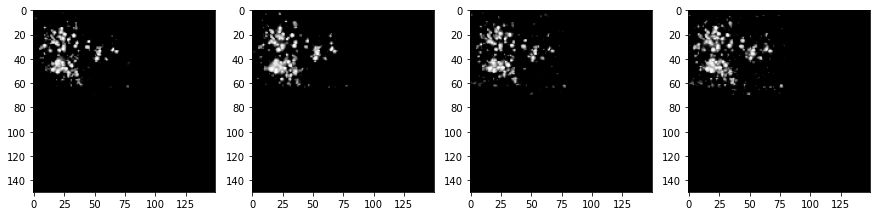


[Image] number 346 	Prediction: 0.8694069 	Category: shyam04_w4
			Observed: 0.8939393939393939


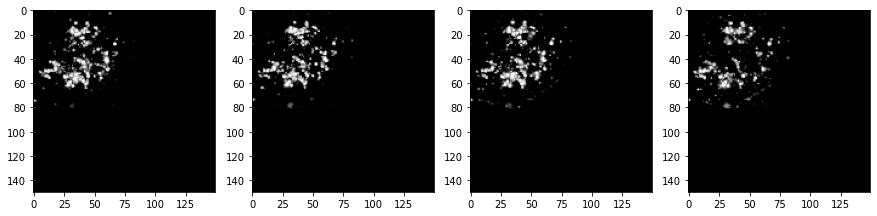


[Image] number 347 	Prediction: 0.8701517 	Category: OFQv69_w3
			Observed: 0.8484848484848485


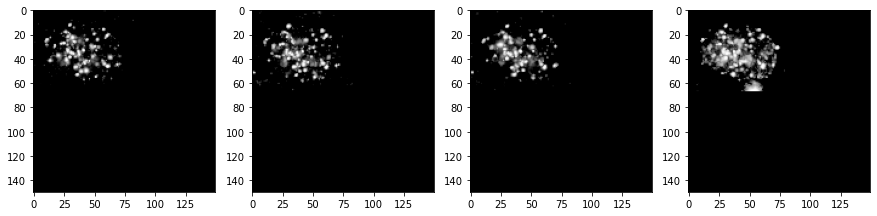


[Image] number 348 	Prediction: 0.8710241 	Category: shyam04_w5
			Observed: 0.9242424242424242


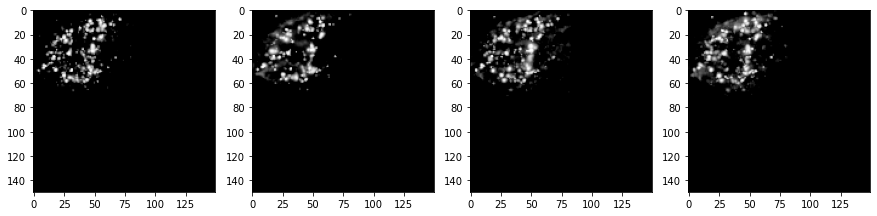


[Image] number 349 	Prediction: 0.8768313 	Category: OFQv69_w4
			Observed: 0.8181818181818182


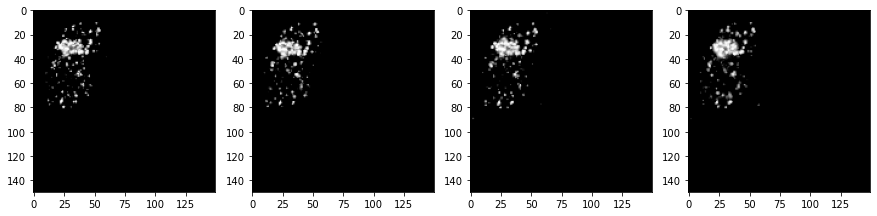


[Image] number 350 	Prediction: 0.87785065 	Category: OFQv61_w3
			Observed: 0.7121212121212122


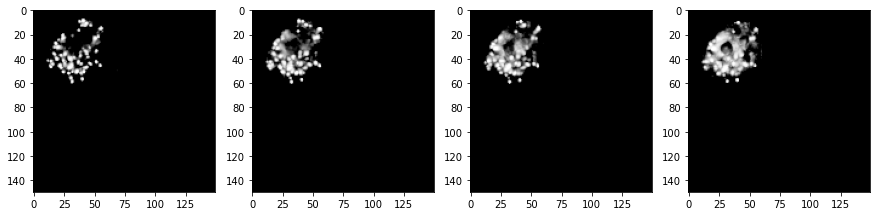


[Image] number 351 	Prediction: 0.87979347 	Category: shyam04_w4
			Observed: 0.8333333333333334


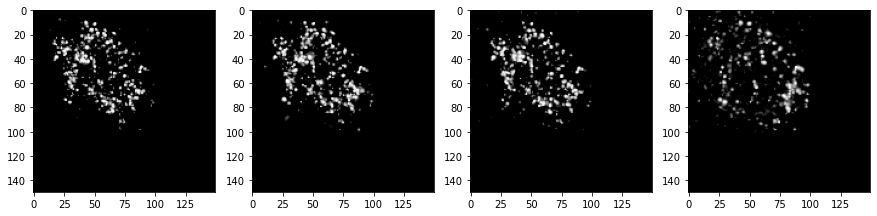


[Image] number 352 	Prediction: 0.8810338 	Category: shyam04_w4
			Observed: 0.9393939393939394


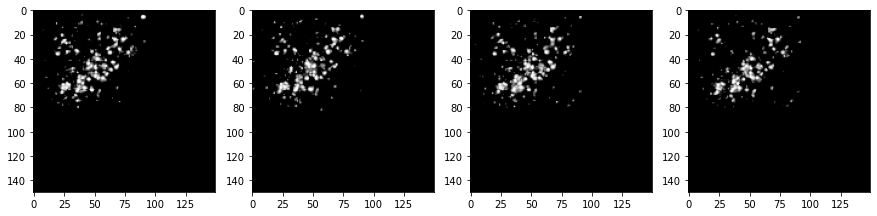


[Image] number 353 	Prediction: 0.8815814 	Category: shyam04_w4
			Observed: 0.8181818181818182


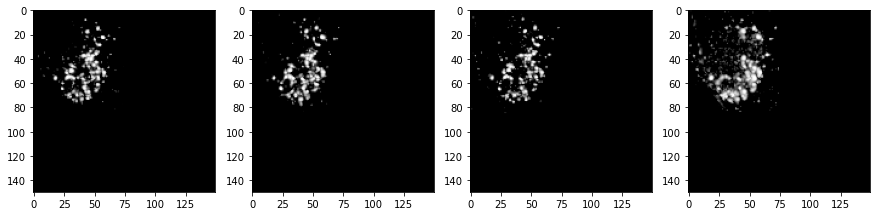


[Image] number 354 	Prediction: 0.8820466 	Category: OFQv67_w3
			Observed: 0.8787878787878788


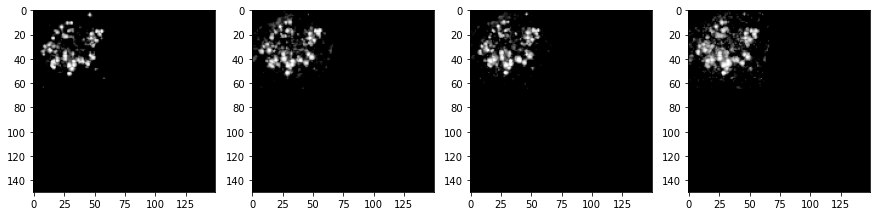


[Image] number 355 	Prediction: 0.8834865 	Category: shyam04_w4
			Observed: 0.8636363636363636


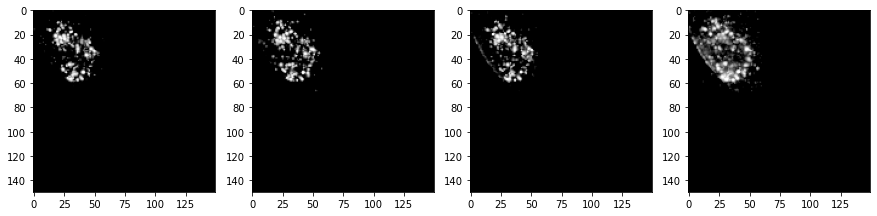


[Image] number 356 	Prediction: 0.8849694 	Category: OFQv67_w3
			Observed: 0.8181818181818182


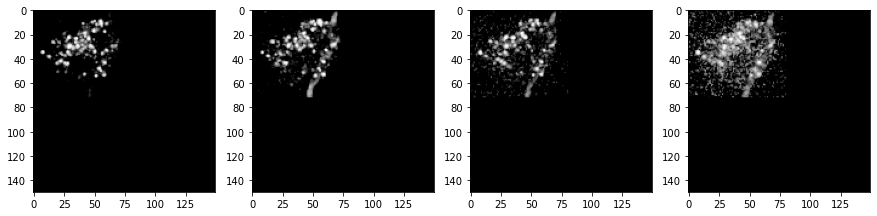


[Image] number 357 	Prediction: 0.89304537 	Category: shyam04_w5
			Observed: 0.8787878787878788


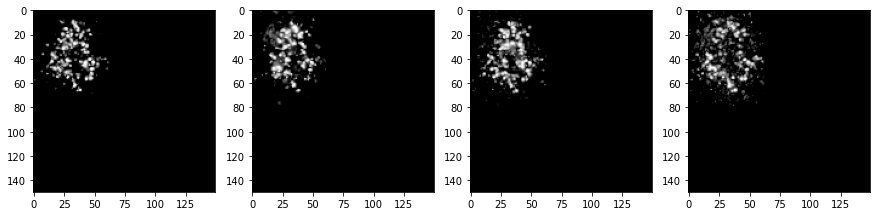


[Image] number 358 	Prediction: 0.8956323 	Category: shyam04_w4
			Observed: 0.8181818181818182


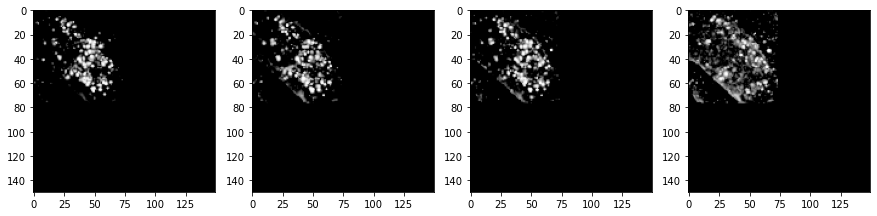


[Image] number 359 	Prediction: 0.8985198 	Category: shyam04_w4
			Observed: 0.803030303030303


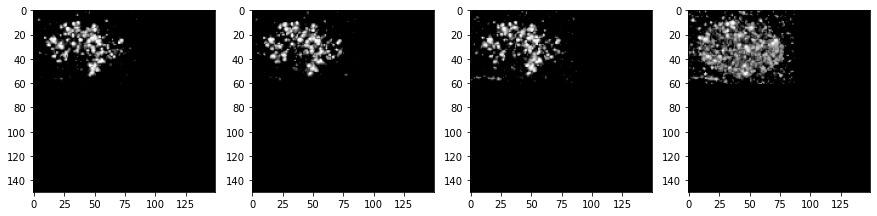


[Image] number 360 	Prediction: 0.8987011 	Category: shyam04_w5
			Observed: 0.8636363636363636


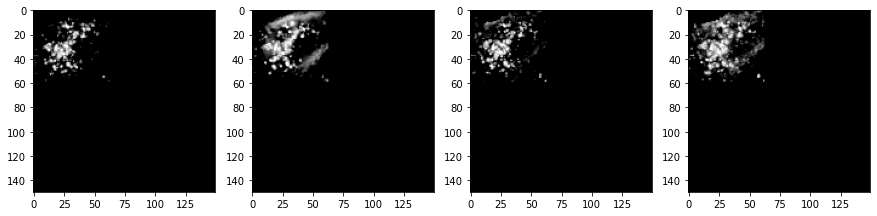


[Image] number 361 	Prediction: 0.90224195 	Category: OFQv69_w4
			Observed: 0.8636363636363636


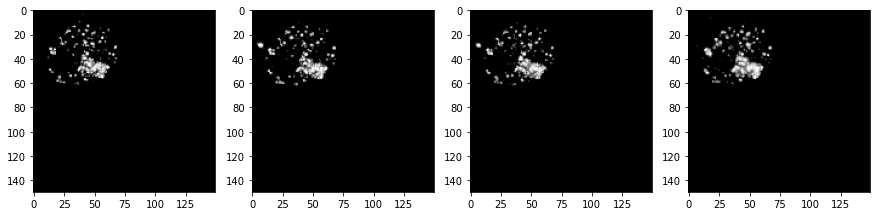


[Image] number 362 	Prediction: 0.90872896 	Category: shyam04_w4
			Observed: 0.9545454545454546


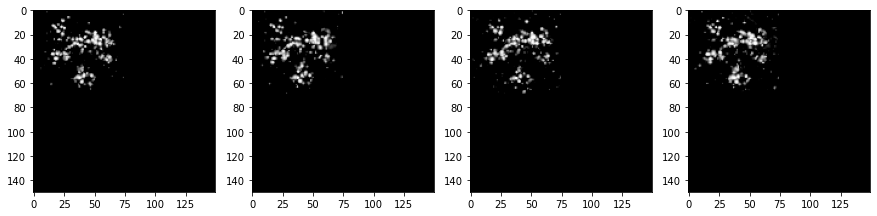


[Image] number 363 	Prediction: 0.9113687 	Category: OFQv67_w5
			Observed: 0.9393939393939394


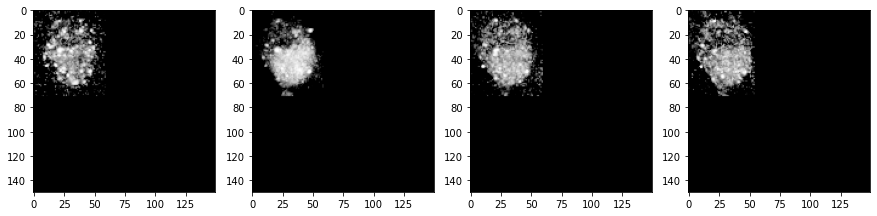


[Image] number 364 	Prediction: 0.91270256 	Category: OFQv69_w3
			Observed: 0.9090909090909091


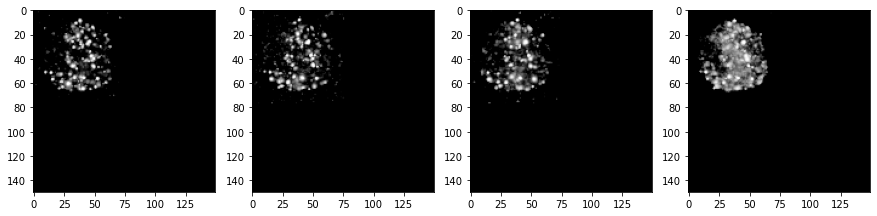


[Image] number 365 	Prediction: 0.9141623 	Category: shyam04_w4
			Observed: 0.8636363636363636


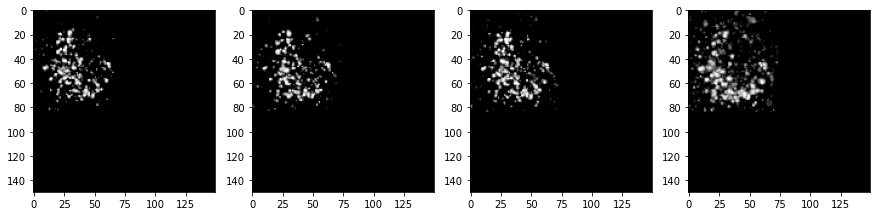


[Image] number 366 	Prediction: 0.91435856 	Category: shyam04_w5
			Observed: 0.7878787878787878


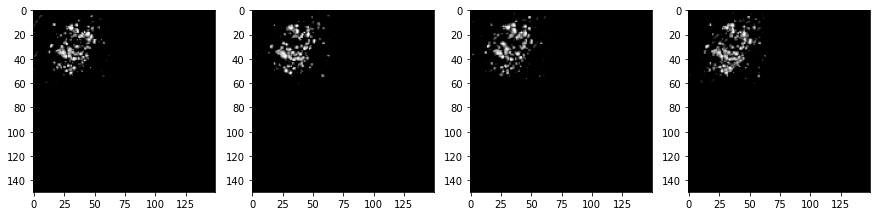


[Image] number 367 	Prediction: 0.9143645 	Category: shyam04_w5
			Observed: 0.9393939393939394


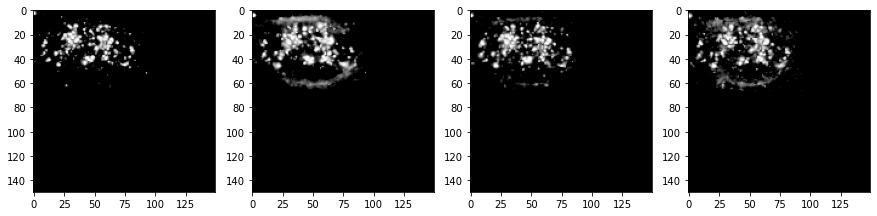


[Image] number 368 	Prediction: 0.91782504 	Category: OFQv69_w2
			Observed: 0.7121212121212122


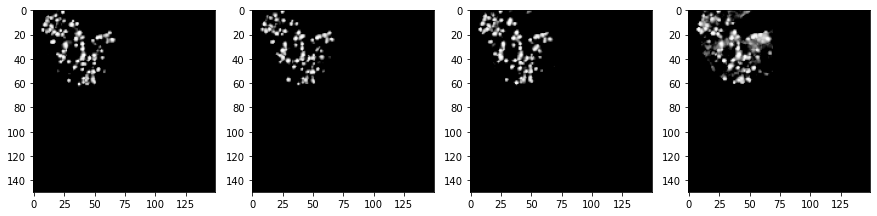


[Image] number 369 	Prediction: 0.9190851 	Category: OFQv68_w3
			Observed: 0.8484848484848485


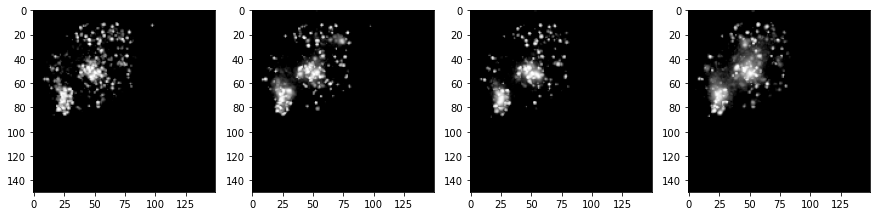


[Image] number 370 	Prediction: 0.91928387 	Category: OFQv67_w3
			Observed: 0.9090909090909091


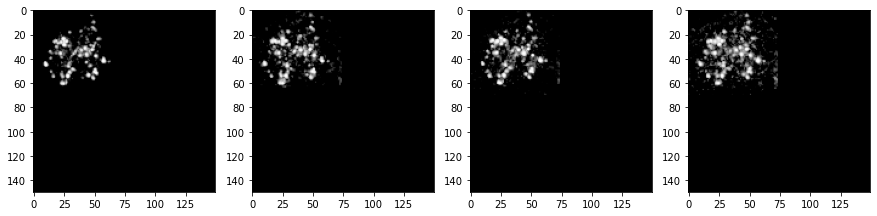


[Image] number 371 	Prediction: 0.9218414 	Category: OFQv67_w5
			Observed: 0.8939393939393939


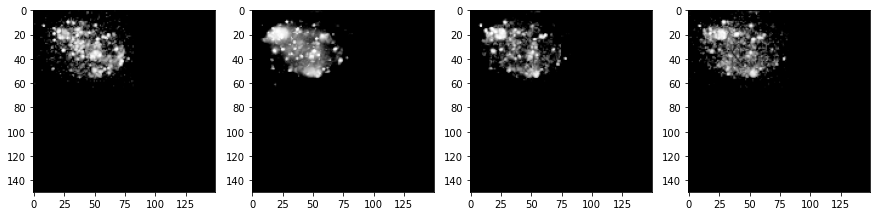


[Image] number 372 	Prediction: 0.9225678 	Category: shyam04_w4
			Observed: 0.9242424242424242


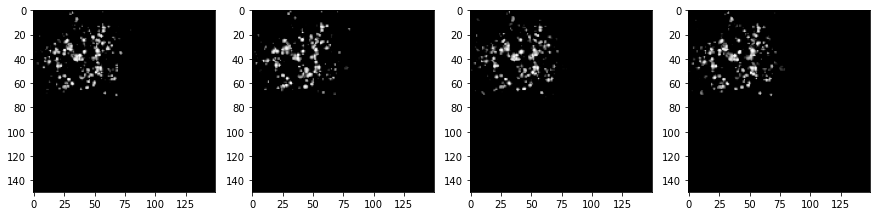


[Image] number 373 	Prediction: 0.9253133 	Category: shyam04_w5
			Observed: 0.9242424242424242


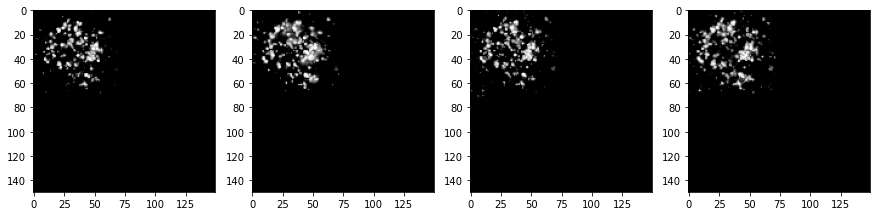


[Image] number 374 	Prediction: 0.92654747 	Category: OFQv69_w3
			Observed: 0.9242424242424242


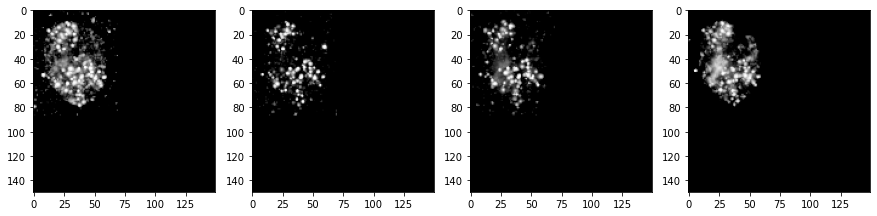


[Image] number 375 	Prediction: 0.9287448 	Category: OFQv68_w4
			Observed: 0.8939393939393939


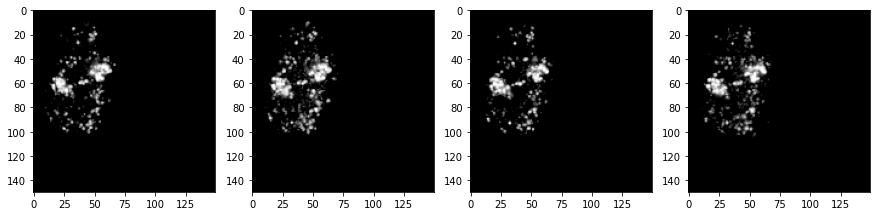


[Image] number 376 	Prediction: 0.9308029 	Category: OFQv69_w3
			Observed: 0.8333333333333334


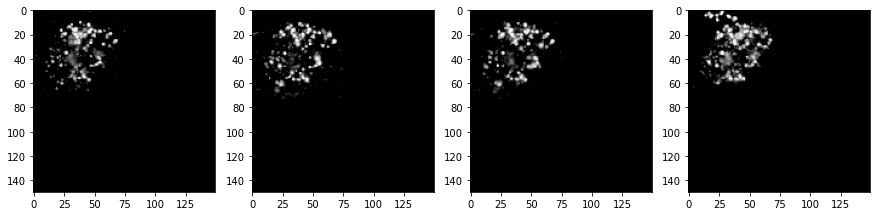


[Image] number 377 	Prediction: 0.9310084 	Category: shyam04_w4
			Observed: 0.9393939393939394


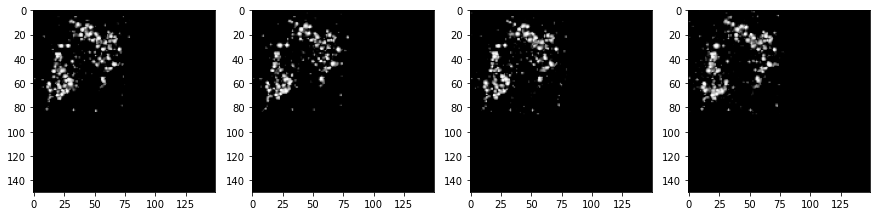


[Image] number 378 	Prediction: 0.93895143 	Category: OFQv69_w4
			Observed: 0.9393939393939394


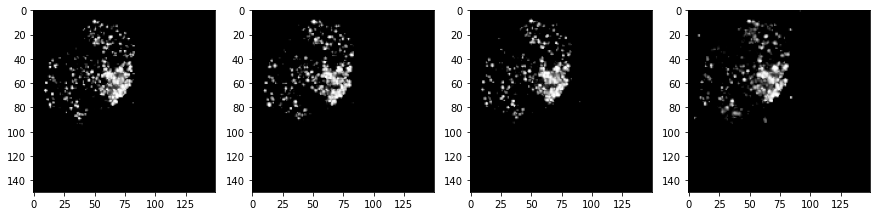


[Image] number 379 	Prediction: 0.9413219 	Category: shyam04_w4
			Observed: 0.9545454545454546


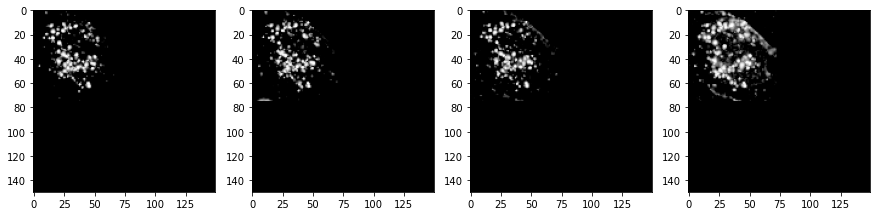


[Image] number 380 	Prediction: 0.9444143 	Category: shyam04_w4
			Observed: 0.9545454545454546


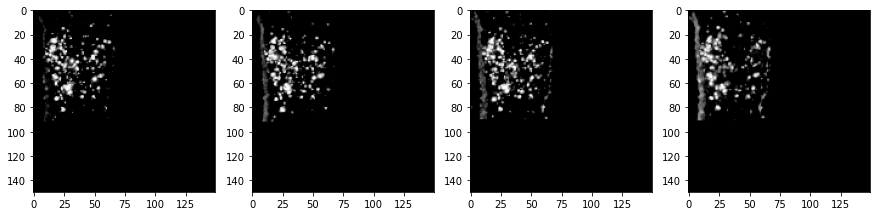


[Image] number 381 	Prediction: 0.95255023 	Category: OFQv69_w4
			Observed: 0.9545454545454546


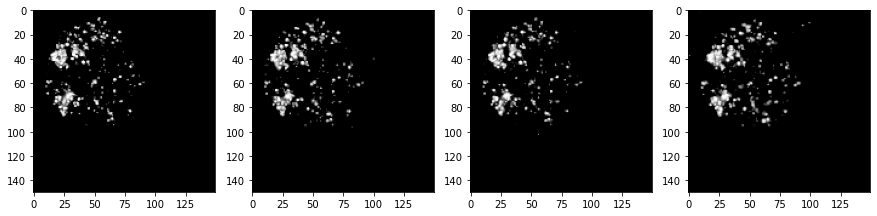


[Image] number 382 	Prediction: 0.95308304 	Category: OFQv69_w3
			Observed: 0.9696969696969697


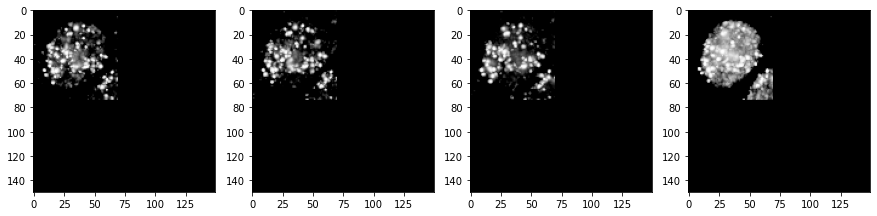


[Image] number 383 	Prediction: 0.95905274 	Category: OFQv69_w3
			Observed: 0.8636363636363636


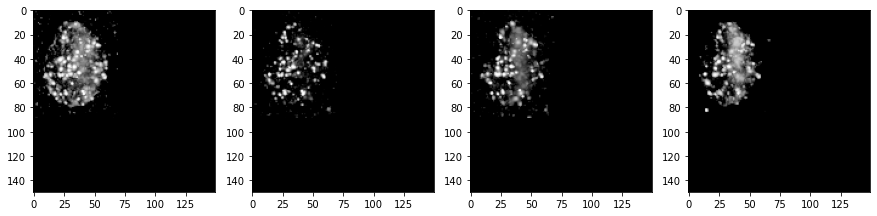


[Image] number 384 	Prediction: 0.96139246 	Category: OFQv69_w4
			Observed: 0.9393939393939394


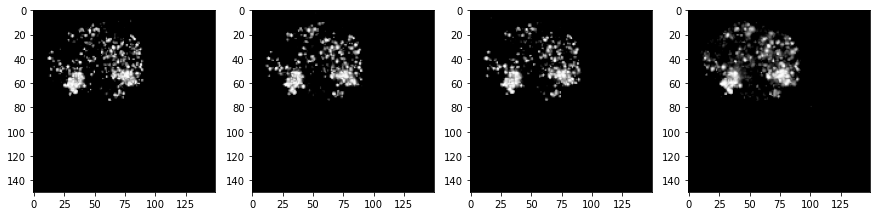


[Image] number 385 	Prediction: 0.9673423 	Category: OFQv69_w4
			Observed: 0.9393939393939394


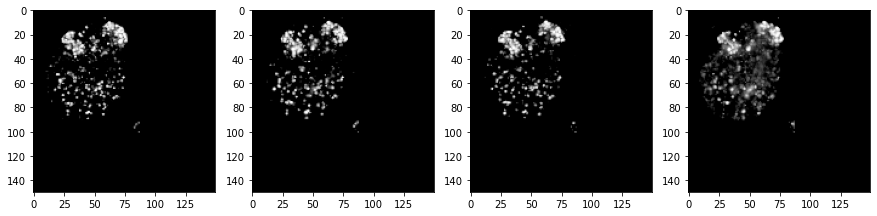


[Image] number 386 	Prediction: 0.9838139 	Category: OFQv67_w5
			Observed: 0.8484848484848485


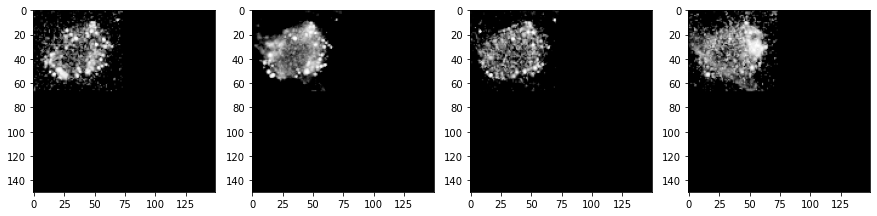

NameError: name 'approach' is not defined

In [27]:
print(colored("\n[INFO]", "cyan"),"Plotting images sorted by prediction...")
for image in range(len(result_sorted)):
    print(colored("\n[Image]", "cyan"), "number", image, "\tPrediction:", result_sorted.iloc[image]["preds"], "\tCategory:", result_sorted.iloc[image]["category"])
    print("\t\t\tObserved:", result_sorted.iloc[image]["y_test"])
    plt.figure(figsize=(15, 40))
    for r in range(4):
        plt.subplot(1,4,r+1)
        plt.imshow(result_sorted.iloc[image]["image_array"][r], cmap="gray")
    plt.show()
    plt.close()
plt.savefig(approach+"images_train"+name_model+".png")
plt.show()

In [3]:
def add_image(dataframe, b, row, group):
    dataframe=dataframe.append({'image_array':b, 
                                        "image":row["image"], 
                                        "roi":row["roi"], 
                                        "category":row["category"], 
                                        "area":row["area"], 
                                        "perimeter":row["perimeter"], 
                                        "chemistry":row["chemistry"], 
                                        "X":row["X"], 
                                        "Y":row["Y"], 
                                        'file_raw':row["path_raw"], 
                                        'file_decon':row["path_decon"], 
                                        'expected':row["expected"], 
                                        'observed_r1':row["1"], 
                                        'observed_r2':row["2"], 
                                        'observed_r3':row["3"], 
                                        'observed_r4':row["4"],
                                        "group":group}, ignore_index=True)
    return dataframe

In [6]:
result.head()

,image_array,image,roi,category,area,perimeter,chemistry,X,Y,file,expected,observed_r1,observed_r2,observed_r3,observed_r4,group,file_decon,file_raw,error
0,"[[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",1,1,OFQv69_w1,192.902,52.695,SOLiD,112.857143,113.955719,NaN,66,12,45,50,40,test dataset,../OFQv69/detect_w1/OFQv69_w1_36plx5Kmsbs_1/ro...,merged/OFQv69/w1/1/roi_1.tif,0.214827
1,"[[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",1,2,OFQv69_w1,173.483,49.872,SOLiD,240.813147,184.692027,NaN,66,12,54,57,48,test dataset,../OFQv69/detect_w1/OFQv69_w1_36plx5Kmsbs_1/ro...,merged/OFQv69/w1/1/roi_2.tif,0.024696
2,"[[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",1,3,OFQv69_w1,199.303,53.697,SOLiD,72.423541,330.656431,NaN,66,9,55,59,48,test dataset,../OFQv69/detect_w1/OFQv69_w1_36plx5Kmsbs_1/ro...,merged/OFQv69/w1/1/roi_3.tif,0.087165
3,"[[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",1,4,OFQv69_w1,207.127,55.804,SOLiD,177.721879,374.854438,NaN,66,16,56,60,52,test dataset,../OFQv69/detect_w1/OFQv69_w1_36plx5Kmsbs_1/ro...,merged/OFQv69/w1/1/roi_4.tif,0.049650
4,"[[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",1,5,OFQv69_w1,223.985,56.337,SOLiD,419.258662,370.223920,NaN,66,15,54,55,40,test dataset,../OFQv69/detect_w1/OFQv69_w1_36plx5Kmsbs_1/ro...,merged/OFQv69/w1/1/roi_5.tif,0.224637


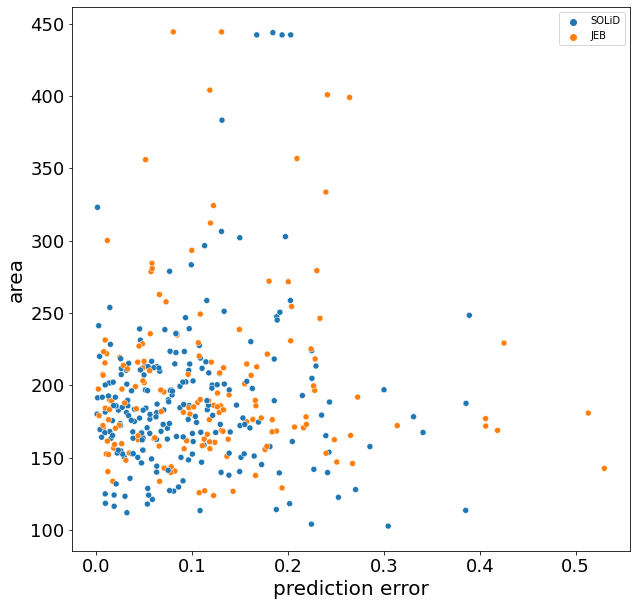

In [7]:
fig, (ax1) = plt.subplots(1, 1, figsize=(10, 10))
fig.set_figheight(10)
fig.set_figwidth(10)
cmap = sns.cubehelix_palette(rot=-.2, as_cmap=True)
sns.scatterplot(x=np.asarray(error), y=np.asarray(area),
                hue=result["chemistry"].tolist())
ax1.set_ylabel("area",fontsize=20)
ax1.set_xlabel('prediction error',fontsize=20)
ax1.tick_params(labelsize=18)


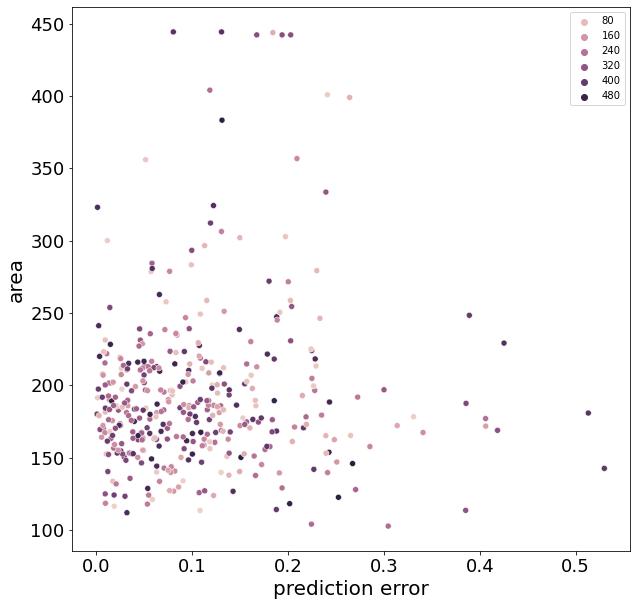

In [8]:
fig, (ax1) = plt.subplots(1, 1, figsize=(10, 10))
fig.set_figheight(10)
fig.set_figwidth(10)
cmap = sns.cubehelix_palette(rot=-.2, as_cmap=True)
sns.scatterplot(x=np.asarray(error), y=np.asarray(area),
                hue=result["Y"].tolist())
ax1.set_ylabel("area",fontsize=20)
ax1.set_xlabel('prediction error',fontsize=20)
ax1.tick_params(labelsize=18)


In [9]:
result["preds"]=preds
result.head()

,image_array,image,roi,category,area,perimeter,chemistry,X,Y,file,expected,observed_r1,observed_r2,observed_r3,observed_r4,group,file_decon,file_raw,error,preds
0,"[[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",1,1,OFQv69_w1,192.902,52.695,SOLiD,112.857143,113.955719,NaN,66,12,45,50,40,test dataset,../OFQv69/detect_w1/OFQv69_w1_36plx5Kmsbs_1/ro...,merged/OFQv69/w1/1/roi_1.tif,0.214827,0.820887
1,"[[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",1,2,OFQv69_w1,173.483,49.872,SOLiD,240.813147,184.692027,NaN,66,12,54,57,48,test dataset,../OFQv69/detect_w1/OFQv69_w1_36plx5Kmsbs_1/ro...,merged/OFQv69/w1/1/roi_2.tif,0.024696,0.702577
2,"[[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",1,3,OFQv69_w1,199.303,53.697,SOLiD,72.423541,330.656431,NaN,66,9,55,59,48,test dataset,../OFQv69/detect_w1/OFQv69_w1_36plx5Kmsbs_1/ro...,merged/OFQv69/w1/1/roi_3.tif,0.087165,0.814438
3,"[[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",1,4,OFQv69_w1,207.127,55.804,SOLiD,177.721879,374.854438,NaN,66,16,56,60,52,test dataset,../OFQv69/detect_w1/OFQv69_w1_36plx5Kmsbs_1/ro...,merged/OFQv69/w1/1/roi_4.tif,0.049650,0.738229
4,"[[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",1,5,OFQv69_w1,223.985,56.337,SOLiD,419.258662,370.223920,NaN,66,15,54,55,40,test dataset,../OFQv69/detect_w1/OFQv69_w1_36plx5Kmsbs_1/ro...,merged/OFQv69/w1/1/roi_5.tif,0.224637,0.830698


In [10]:
os.getcwd()

'/home/amarti/CI_data/final_results/approach1/notebooks'

In [11]:
result.to_csv("/home/amarti/CI_data/taula_prova.csv")

In [49]:
result.to_pickle('/home/amarti/CI_data/taula_prova2.csv')

In [21]:
images=np.asarray(result["image_array"])

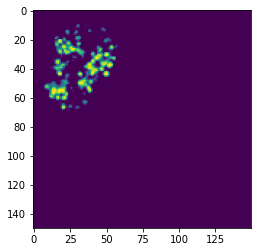

In [20]:
plt.imshow(images[1][0])

In [39]:
images=np.asarray(result["image_array"].tolist())[:,1]
print(images.shape)
np.save("/home/amarti/CI_data/images_prova1.npy", images)

(386, 150, 150)


In [32]:
images[:,1].shape

(386, 150, 150)